In [1]:
import spotchaos.syntheticSignals as sp

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.animation as animation
from matplotlib.animation import TimedAnimation
from mpl_toolkits import mplot3d
from mpl_toolkits.axes_grid1 import make_axes_locatable
import time
import tqdm
import pickle
import os
from astropy.timeseries import LombScargle
from scipy.integrate import RK45, DOP853
from scipy.stats import chi2, iqr, mode
from scipy.signal import argrelextrema, savgol_filter, medfilt
from scipy.spatial.distance import chebyshev
from scipy.optimize import curve_fit, minimize

import jax
import jax.numpy as jnp
import jaxopt
jax.config.update("jax_enable_x64", True)

import celerite
from celerite import terms
import autograd.numpy as anp

from tinygp import kernels, GaussianProcess

from pytisean import tiseano, tiseanio

In [2]:
speculoos = np.genfromtxt("./speculoos_style_M8.txt") #Teff = 2592; Prot = 0.21265815403868307 d

#For now, don't worry about the scattered few speculoos obs taken post-covid 
speculoos_trunc = speculoos[(speculoos[:,0] < 2458247)]

kepler = np.genfromtxt("./kepler_style_G4.txt")       #Teff = 5687; Prot = 26.536163091164116 d (but evolving)
tess = np.genfromtxt("./TESS_style_F8.txt")           #Teff = 6060; Prot ~= 2.8 - 5.6 d (evolving)

print(np.shape(speculoos))
print(np.shape(kepler))
print(np.shape(tess))

(7275, 3)
(64887, 4)
(205351, 4)


(6788,)
(6788,)


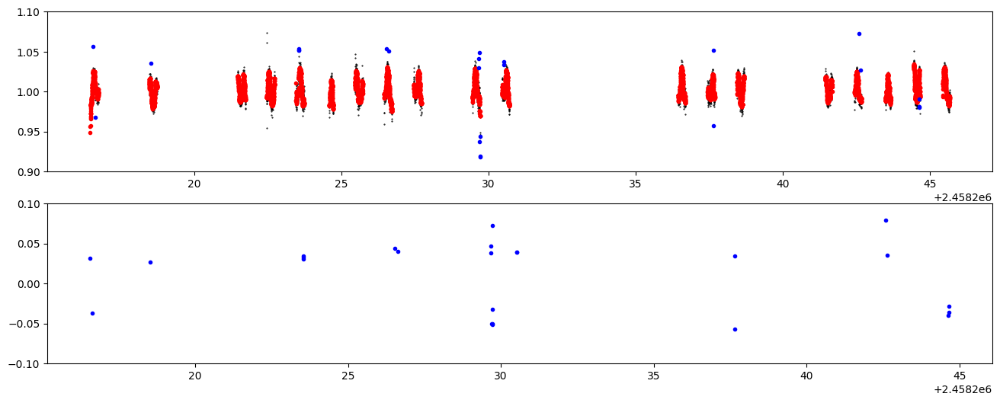

30
0.00441956393635828
6758


In [3]:
# eliminate speculoos flux outliers
movingmed = medfilt(speculoos_trunc[:,1], kernel_size = 15) #chose this kernel size as covering ~0.05*Prot
print(np.shape(movingmed))
print(np.shape(speculoos_trunc[:,1]))

fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(speculoos_trunc[:,0],speculoos_trunc[:,1],'k.',ms=1,zorder=1)
axes[0].plot(speculoos_trunc[:,0],movingmed,'r.',zorder=2)
axes[0].set_ylim(0.9,1.1)


outlierMask = (np.abs(speculoos_trunc[:,1] - movingmed) > 5.*speculoos_trunc[:,2])

axes[0].plot(speculoos_trunc[:,0][outlierMask],speculoos_trunc[:,1][outlierMask],'b.',zorder=3)

axes[1].plot(speculoos_trunc[:,0][outlierMask],speculoos_trunc[:,1][outlierMask]-movingmed[outlierMask],'b.')
axes[1].set_ylim(-0.1,0.1)
plt.show()

print(len(speculoos_trunc[:,0][outlierMask]))
print(len(speculoos_trunc[:,0][outlierMask])/len(speculoos_trunc[:,0]))

speculoos_trunc = speculoos_trunc[~outlierMask]
print(len(speculoos_trunc))

(64887,)
(64887,)


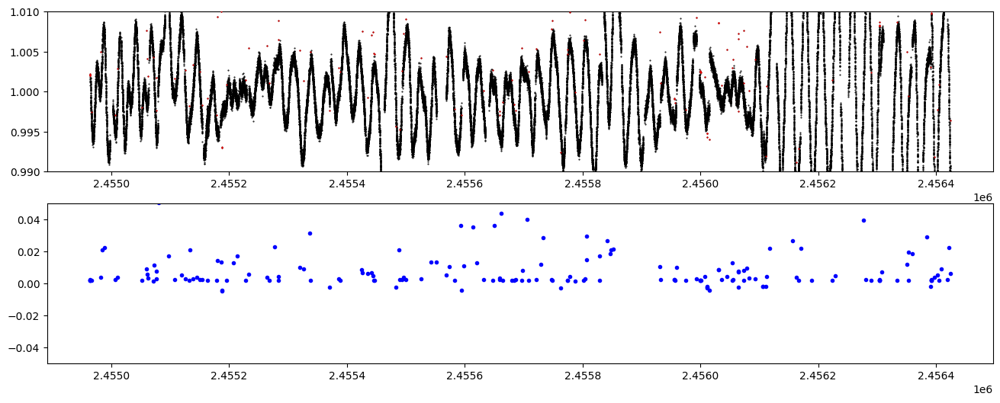

191
0.0029435788370551883
64696


In [4]:
# eliminate kepler flux outliers
movingmed = medfilt(kepler[:,1],kernel_size=65) #chose this kernel size as covering ~0.05*Prot
print(np.shape(movingmed))
print(np.shape(kepler[:,1]))

fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(kepler[:,0],kepler[:,1],'k.',ms=1,zorder=1)
#axes[0].plot(kepler[:,0],movingmed,'r.',zorder=2)
axes[0].set_ylim(0.99,1.01)


outlierMask = (np.abs(kepler[:,1] - movingmed) > 5.*kepler[:,2])

axes[0].plot(kepler[:,0][outlierMask],kepler[:,1][outlierMask],'r.',ms=1,zorder=3)

axes[1].plot(kepler[:,0][outlierMask],kepler[:,1][outlierMask]-movingmed[outlierMask],'b.')
axes[1].set_ylim(-0.05,0.05)
plt.show()

print(len(kepler[:,0][outlierMask]))
print(len(kepler[:,0][outlierMask])/len(kepler[:,0]))

kepler = kepler[~outlierMask]
print(len(kepler))

(205351,)
(205351,)


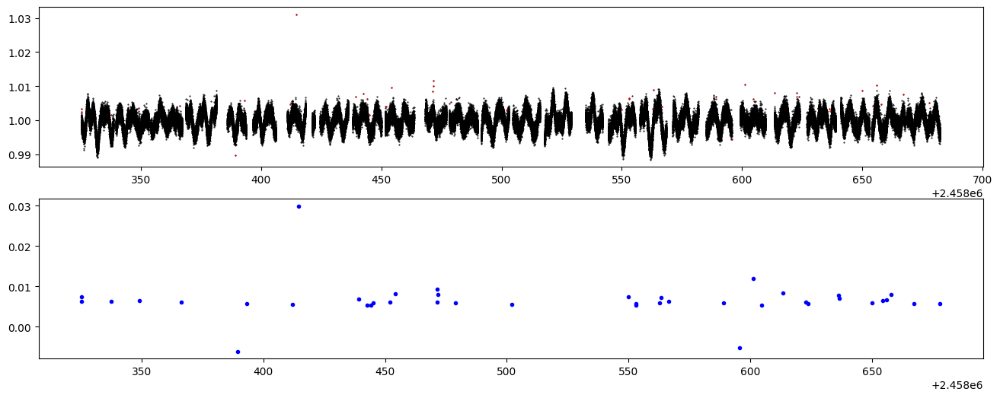

41
0.0001996581462958544
205310


In [5]:
# eliminate tess flux outliers
movingmed = medfilt(tess[:,1],kernel_size=201) #chose this kernel size as covering ~0.05*Prot
print(np.shape(movingmed))
print(np.shape(tess[:,1]))

fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(tess[:,0],tess[:,1],'k.',ms=1,zorder=1)
#axes[0].plot(tess[:,0],tess,'r.',zorder=2)
#axes[0].set_ylim(0.99,1.01)


outlierMask = (np.abs(tess[:,1] - movingmed) > 5.*tess[:,2])

axes[0].plot(tess[:,0][outlierMask],tess[:,1][outlierMask],'r.',ms=1,zorder=3)

axes[1].plot(tess[:,0][outlierMask],tess[:,1][outlierMask]-movingmed[outlierMask],'b.')
#axes[1].set_ylim(-0.05,0.05)
plt.show()

print(len(tess[:,0][outlierMask]))
print(len(tess[:,0][outlierMask])/len(tess[:,0]))

tess = tess[~outlierMask]
print(len(tess))

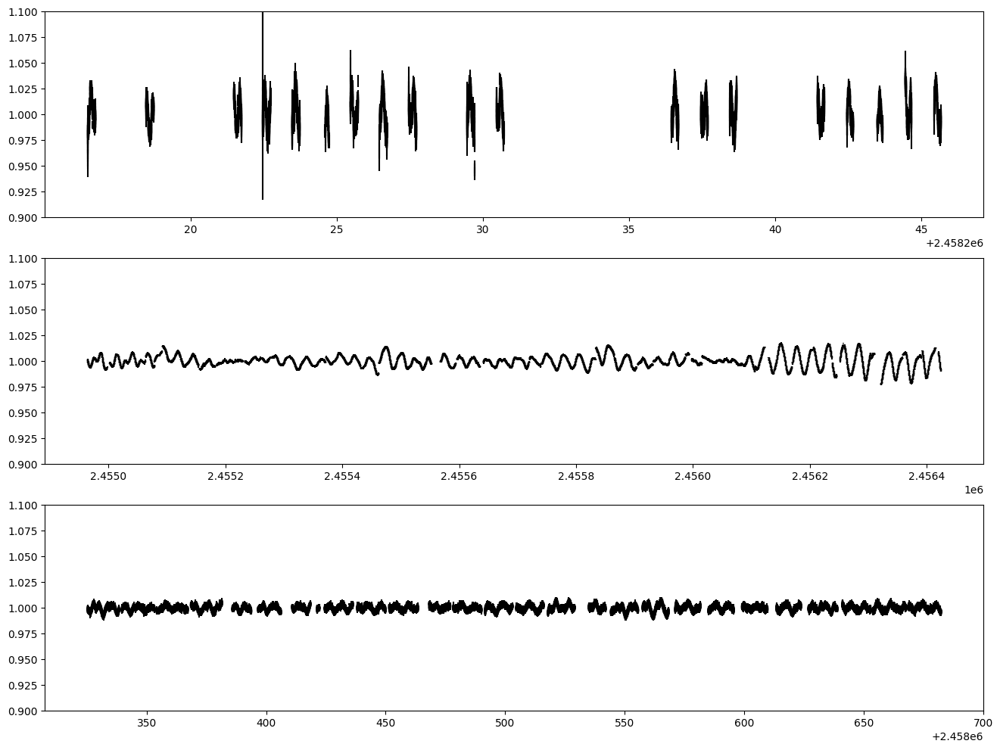

In [6]:
fig, axes = plt.subplots(3,1,figsize=(16,12))
#axes[0].errorbar(speculoos[:,0],speculoos[:,1],yerr=speculoos[:,2],color='k',ls='None',capsize=0)
axes[0].errorbar(speculoos_trunc[:,0],speculoos_trunc[:,1],yerr=speculoos_trunc[:,2],color='k',ls='None',capsize=0)
axes[1].errorbar(kepler[:,0],kepler[:,1],yerr=kepler[:,2],color='k',ls='None',capsize=0)
axes[2].errorbar(tess[:,0],tess[:,1],yerr=tess[:,2],color='k',ls='None',capsize=0)

#axes[0].set_xlim(2458215,2458247)

for ax in axes:
    ax.set_ylim(0.9,1.1)
plt.show()

# Perfect
# + white noise
# + gaps
# + gaps + white noise 
0. Gaussian noise
1. A GP time series from the QP kernel
2. Simple periodic (sum of sines)
3. KB88 R(t)
4. Rossler x,y,z
5. Transformed Rossler x,y,z
6. Lorenz x,y,z

-Scale quasi-period to stellar Prot

-Impose gaps

-Impose same fractional uncertainty as each observed data point

In [7]:
# all saved files will have the same header:
header = "t[BJD] flux_norm_perf-1 flux_norm_noise-1 flux_norm_err"
color = "#ff7f0e"

In [8]:
def find_cadence(timeseries):
    return mode(timeseries[1:] - timeseries[0:-1], keepdims=True)[0][0]

In [9]:
speculoos_trunc_cad = find_cadence(speculoos_trunc[:,0])
kepler_cad = find_cadence(kepler[:,0])
tess_cad = find_cadence(tess[:,0])

t_speculoos_trunc_perfect = np.arange(speculoos_trunc[0,0], speculoos_trunc[-1,0], speculoos_trunc_cad)
print(len(speculoos_trunc[:,0])/len(t_speculoos_trunc_perfect))

t_kepler_perfect = np.arange(kepler[0,0], kepler[-1,0], kepler_cad)
print(len(kepler[:,0])/len(t_kepler_perfect))

t_tess_perfect = np.arange(tess[0,0], tess[-1,0], tess_cad)
print(len(tess[:,0])/len(t_tess_perfect))

0.15317663591649855
0.9058273361149226
0.7986789179264147


In [10]:
# best-fit periods from LS periodograms, in days
speculoos_Prot = 0.21265815403868307
kepler_Prot = 26.536163091164116
tess_Prot = 5.614166939523766

In [11]:
# to justify the moving median window length choices in outlier rejection, above
print(speculoos_Prot/speculoos_trunc_cad*0.05)
print(kepler_Prot/kepler_cad*0.05)
print(tess_Prot/tess_cad*0.05)

16.061796088583176
64.93139622310285
202.09382788921175


In [12]:
def resample_time_series(t_orig, y_orig, yerr_orig, t_new):
    """
    t_new must be smaller than and encompassed within the start and end points of t_orig
    """
    
    y_new = np.zeros_like(t_new)
    yerr_new = np.zeros_like(t_new)
    
    for i in range(len(y_new)):
        
        try:
            iminus1 = np.arange(len(t_orig))[t_orig < t_new[i]][-1]
        except IndexError:
            iminus1 = 0
            
        try:
            iplus1 = np.arange(len(t_orig))[t_orig > t_new[i]][0]
        except IndexError:
            iplus1 = -1
        
        slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])
        
        y_new[i] = y_orig[iminus1] + (t_new[i] - t_orig[iminus1])*slope
        yerr_new[i] = (yerr_orig[iplus1] + yerr_orig[iminus1])/2.
        
    #print(y_new)
    #print(yerr_new)
    return y_new,yerr_new

# 0. Gaussian noise

In [128]:
np.random.seed(8421)

specGaussianNoise_perfect = np.ones_like(t_speculoos_trunc_perfect) + np.random.normal(0.,np.median(speculoos[:,2]), len(t_speculoos_trunc_perfect))

specGaussianNoise_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T, 
                                              np.ones_like(t_speculoos_trunc_perfect),
                                              specGaussianNoise_perfect.T, 
                                              np.median(speculoos[:,2])*np.ones_like(t_speculoos_trunc_perfect).T)).T
print(np.shape(specGaussianNoise_perfect_tosave))
np.savetxt("./data/0_gaussian_noise/0_gaussianNoise_speculoos_perfect.txt",specGaussianNoise_perfect_tosave,fmt="%f",header=header)

specGaussianNoise_gaps = np.zeros_like(speculoos_trunc[:,1])

for i in range(len(specGaussianNoise_gaps)):
    specGaussianNoise_gaps[i] = 1 + np.random.normal(0.,speculoos_trunc[i,2],1)

specGaussianNoise_gaps_tosave = np.vstack((speculoos_trunc[:,0].T, 
                                              np.ones_like(speculoos_trunc[:,0]),
                                              specGaussianNoise_gaps.T, 
                                              speculoos_trunc[:,2].T)).T
print(np.shape(specGaussianNoise_gaps_tosave))
np.savetxt("./data/0_gaussian_noise/0_gaussianNoise_speculoos_gaps.txt",specGaussianNoise_gaps_tosave,fmt="%f",header=header)


(44119, 4)
(6758, 4)


In [129]:
np.random.seed(8421)

kepGaussianNoise_perfect = np.ones_like(t_kepler_perfect) + np.random.normal(0.,np.median(kepler[:,2]), len(t_kepler_perfect))

kepGaussianNoise_perfect_tosave = np.vstack((t_kepler_perfect.T, 
                                              np.ones_like(t_kepler_perfect),
                                              kepGaussianNoise_perfect.T, 
                                              np.median(kepler[:,2])*np.ones_like(t_kepler_perfect).T)).T
print(np.shape(kepGaussianNoise_perfect_tosave))
np.savetxt("./data/0_gaussian_noise/0_gaussianNoise_kepler_perfect.txt",kepGaussianNoise_perfect_tosave,fmt="%f",header=header)

kepGaussianNoise_gaps = np.zeros_like(kepler[:,1])

for i in range(len(kepGaussianNoise_gaps)):
    kepGaussianNoise_gaps[i] = 1 + np.random.normal(0.,kepler[i,2],1)

kepGaussianNoise_gaps_tosave = np.vstack((kepler[:,0].T, 
                                              np.ones_like(kepler[:,0]),
                                              kepGaussianNoise_gaps.T, 
                                              kepler[:,2].T)).T
print(np.shape(kepGaussianNoise_gaps_tosave))
np.savetxt("./data/0_gaussian_noise/0_gaussianNoise_kepler_gaps.txt",kepGaussianNoise_gaps_tosave,fmt="%f",header=header)



(71422, 4)
(64696, 4)


In [130]:
np.random.seed(8421)

tessGaussianNoise_perfect = np.ones_like(t_tess_perfect) + np.random.normal(0.,np.median(tess[:,2]), len(t_tess_perfect))

tessGaussianNoise_perfect_tosave = np.vstack((t_tess_perfect.T, 
                                              np.ones_like(t_tess_perfect),
                                              tessGaussianNoise_perfect.T, 
                                              np.median(tess[:,2])*np.ones_like(t_tess_perfect).T)).T
print(np.shape(tessGaussianNoise_perfect_tosave))
np.savetxt("./data/0_gaussian_noise/0_gaussianNoise_tess_perfect.txt",tessGaussianNoise_perfect_tosave,fmt="%f",header=header)

tessGaussianNoise_gaps = np.zeros_like(tess[:,1])

for i in range(len(tessGaussianNoise_gaps)):
    tessGaussianNoise_gaps[i] = 1 + np.random.normal(0.,tess[i,2],1)

tessGaussianNoise_gaps_tosave = np.vstack((tess[:,0].T, 
                                              np.ones_like(tess[:,0]),
                                              tessGaussianNoise_gaps.T, 
                                              tess[:,2].T)).T
print(np.shape(tessGaussianNoise_gaps_tosave))
np.savetxt("./data/0_gaussian_noise/0_gaussianNoise_tess_gaps.txt",tessGaussianNoise_gaps_tosave,fmt="%f",header=header)



(257062, 4)
(205310, 4)


# 1. A GP time series from the QP kernel

In [13]:
# 1. fit (very approximately, least squares) a GP to each data set
# 2. draw a random function from the parameters of this GP ( = gaps version)
# 3. condition the GP on the uninterrupted time series
# 4. fit the GP (again super approximately) to that time series 
# 5. draw a random function from the parameters of that GP ( = perfect version)

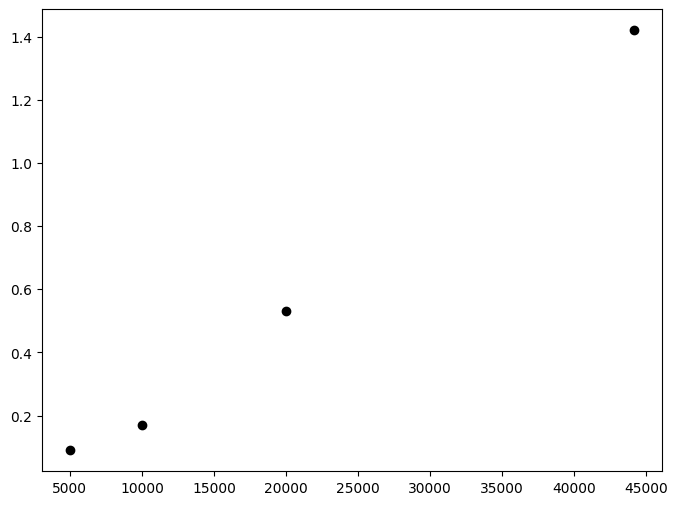

In [14]:
# scaling of computation time for the conditioning step, which is the slowest (least squares fit is very fast)
lengths = np.array((5000,10000,20000,44119))
durations = np.array((0.09,0.17,0.53,1.42))
fig, ax = plt.subplots(1,1,figsize=(8,6))
ax.plot(lengths,durations,'ko')
plt.show() #linear!!!

In [15]:
class QPApproxTerm(terms.Term):
    parameter_names = ("log_a", "log_b", "log_c", "log_P")

    def get_real_coefficients(self, params):
        log_a, log_b, log_c, log_P = params
        b = anp.exp(log_b)
        return (
            anp.exp(log_a) * (1.0 + b) / (2.0 + b), anp.exp(log_c),
        )

    def get_complex_coefficients(self, params):
        log_a, log_b, log_c, log_P = params
        b = anp.exp(log_b)
        return (
            anp.exp(log_a) / (2.0 + b), 0.0,
            anp.exp(log_c), 2*anp.pi*anp.exp(-log_P),
        )
    
def neg_log_like(params, y, gp):
    gp.set_parameter_vector(params)
    return -gp.log_likelihood(y)


In [16]:
def runGPfit(bounds,log_a_init,log_b_init,log_c_init,log_P_init,time_to_fit,flux_to_fit,fluxerr_to_fit,time_to_condition,verbose=False,condition=True,plot=False):
    
    kernel = QPApproxTerm(log_a=log_a_init, log_b=log_b_init, log_c=log_c_init, log_P=log_P_init, bounds=bounds)
    
    gp = celerite.GP(kernel, mean=np.mean(flux_to_fit))
    gp.compute(time_to_fit, fluxerr_to_fit)  # You always need to call compute once.
    
    if verbose is True:
        print("Initial log likelihood: {0}".format(gp.log_likelihood(flux_to_fit)))
        print("parameter_dict:\n{0}".format(gp.get_parameter_dict()))
        print("parameter_names:\n{0}".format(gp.get_parameter_names()))
        print("parameter_vector:\n{0}".format(gp.get_parameter_vector()))
        print("parameter_bounds:\n{0}".format(gp.get_parameter_bounds()))

    initial_params = gp.get_parameter_vector()
    bounds = gp.get_parameter_bounds()

    r = minimize(neg_log_like, initial_params, method="L-BFGS-B", bounds=bounds, args=(flux_to_fit, gp))
    gp.set_parameter_vector(r.x)
    #print(r)
    
    lsq_param_dict = gp.get_parameter_dict()
    #print(lsq_param_dict)
    
    if condition is True:
        pred_mean, pred_var = gp.predict(flux_to_fit, time_to_condition, return_var=True)
        pred_std = np.sqrt(pred_var)

        if plot is True:
            color = "#ff7f0e"

            fig,ax = plt.subplots(1,1,figsize=(8,6))
            plt.errorbar(time_to_fit, flux_to_fit, yerr=fluxerr_to_fit, fmt=".k", capsize=0)
            plt.plot(time_to_condition, pred_mean, color=color)
            plt.fill_between(time_to_condition, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3,
                             edgecolor="none")
            plt.xlabel("t")
            plt.ylabel("flux")
            plt.show()
        
        return gp, pred_mean, pred_std

    else:
        return gp

Initial log likelihood: 15479.479040708937
parameter_dict:
OrderedDict([('kernel:log_a', 0.1), ('kernel:log_b', 0.5), ('kernel:log_c', -0.01), ('kernel:log_P', -1.5480693131378707)])
parameter_names:
('kernel:log_a', 'kernel:log_b', 'kernel:log_c', 'kernel:log_P')
parameter_vector:
[ 0.1         0.5        -0.01       -1.54806931]
parameter_bounds:
[(-10.0, 10.0), (-10.0, 10.0), (-5.0, 5.0), (-1.6480693131378708, -1.4480693131378706)]
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -26019.25460631828
        x: [-4.800e+00  5.121e+00 -2.449e+00 -1.548e+00]
      nit: 12
      jac: [-1.478e+00  1.259e-01  2.907e+00 -4.721e+00]
     nfev: 145
     njev: 29
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
OrderedDict([('kernel:log_a', -4.800199899013486), ('kernel:log_b', 5.120994224035009), ('kernel:log_c', -2.4488289274950303), ('kernel:log_P', -1.548094273722147)])


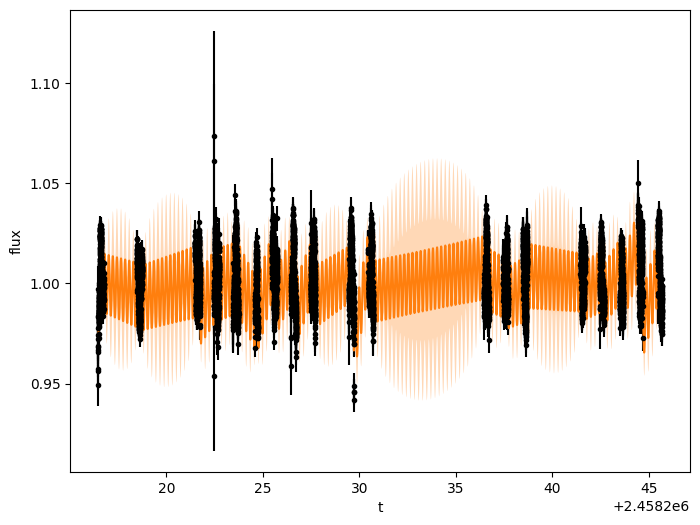

(5, 6758)


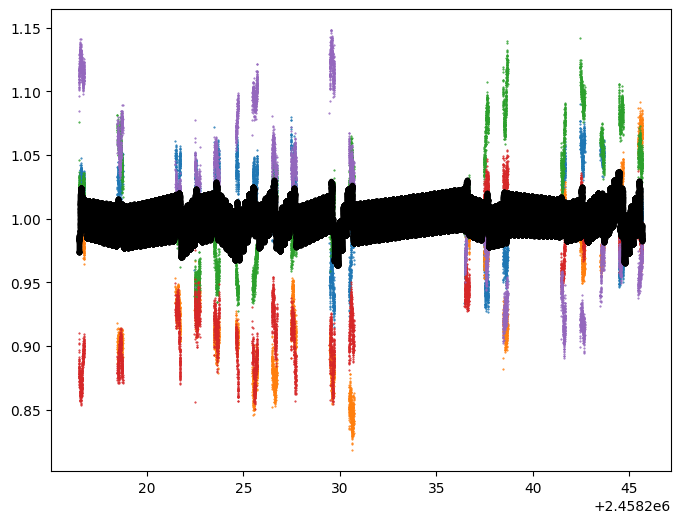

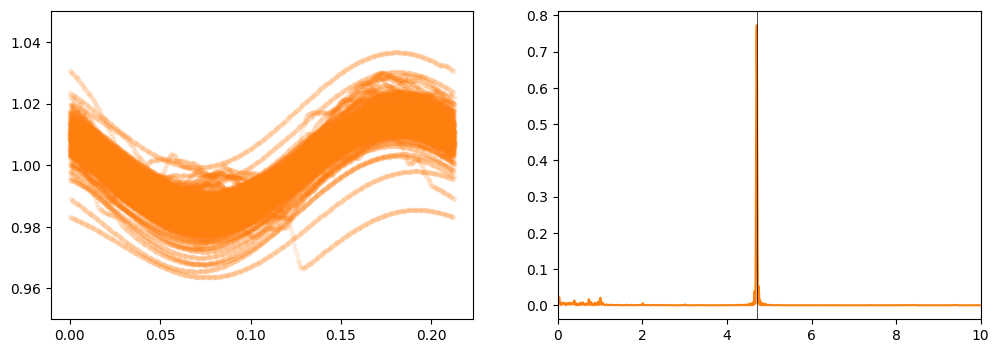

Initial log likelihood: 205454.81328003015
parameter_dict:
OrderedDict([('kernel:log_a', -3.0), ('kernel:log_b', 3.43), ('kernel:log_c', -1.53), ('kernel:log_P', -1.5480693131378707)])
parameter_names:
('kernel:log_a', 'kernel:log_b', 'kernel:log_c', 'kernel:log_P')
parameter_vector:
[-3.          3.43       -1.53       -1.54806931]
parameter_bounds:
[(-10.0, 10.0), (-10.0, 10.0), (-5.0, 5.0), (-1.6480693131378708, -1.4480693131378706)]
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: -339824.57920362183
        x: [-6.636e+00 -3.532e+00 -4.998e+00 -1.548e+00]
      nit: 34
      jac: [-5.052e+01 -2.864e+01  2.134e+01  4.042e+03]
     nfev: 345
     njev: 69
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
OrderedDict([('kernel:log_a', -6.635504387711074), ('kernel:log_b', -3.531779782048249), ('kernel:log_c', -4.998162692686583), ('kernel:log_P', -1.5477274704448292)])


/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_79418/765265801.py:26: RuntimeWarning: invalid value encountered in sqrt
  pred_std = np.sqrt(pred_var)


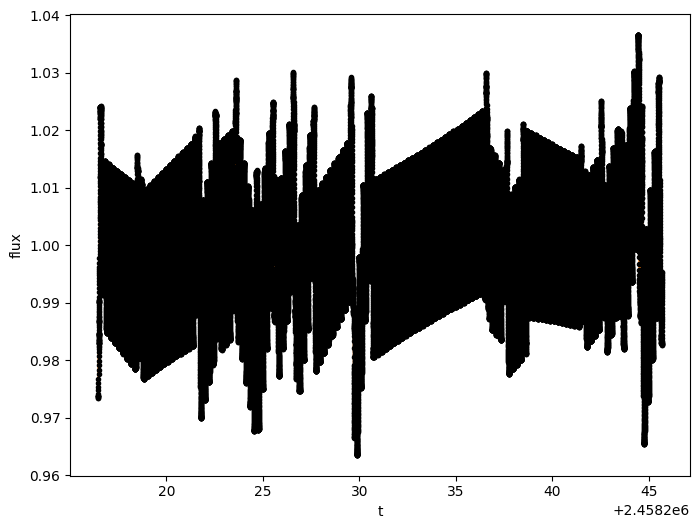

(1, 44119)


/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_79418/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


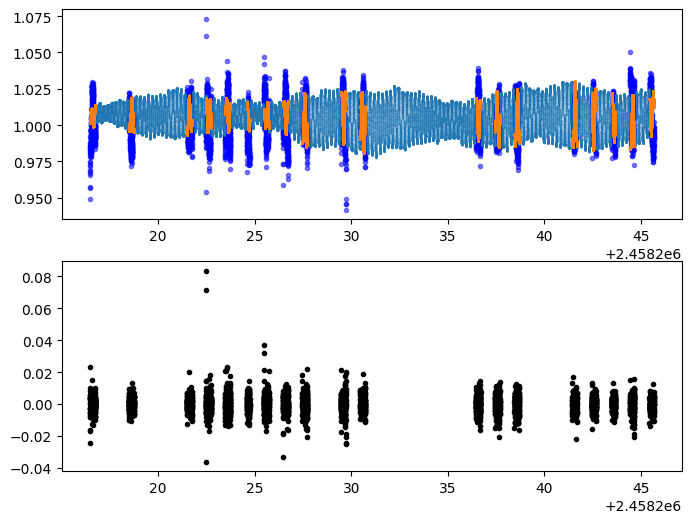

(44119, 4)
(6758, 4)


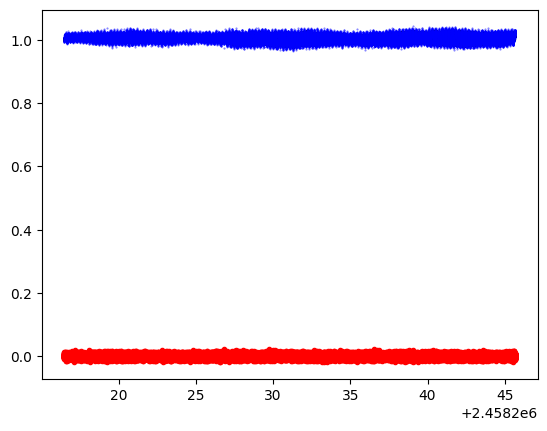

In [22]:
specGP_gaps, specGP_gaps_pred_mean, specGP_gaps_pred_std=runGPfit(bounds=dict(log_a=(-10., 10.), log_b=(-10., 10.0), log_c=(-5.0, 5.0),
                                                                              log_P=(np.log(speculoos_Prot)-0.1, np.log(speculoos_Prot)+0.1)),
                                                                 log_a_init=0.1,
                                                                 log_b_init=0.5,
                                                                 log_c_init=-0.01,
                                                                 log_P_init=np.log(speculoos_Prot),
                                                                 time_to_fit=speculoos_trunc[:,0],
                                                                 flux_to_fit=speculoos_trunc[:,1],
                                                                 fluxerr_to_fit=speculoos_trunc[:,2],
                                                                 time_to_condition=t_speculoos_trunc_perfect,
                                                                 condition=True,
                                                                 plot=True)

#random draw from least squares best fit kernel
specGPtimeseries_gaps = specGP_gaps.sample(size=5)
print(np.shape(specGPtimeseries_gaps))


fig,ax = plt.subplots(1,1,figsize=(8,6))
for i in range(5):
    ax.plot(speculoos_trunc[:,0],specGPtimeseries_gaps[i],ls='None',marker='.',ms=1)
ax.plot(t_speculoos_trunc_perfect,specGP_gaps_pred_mean,'k.')
#ax.set_ylim(0.95,1.05)
#ax.set_xlim(2458222,2458224)
plt.show()

# LS periodogram of signal
frequency, power = LombScargle(t_speculoos_trunc_perfect,specGP_gaps_pred_mean).autopower(minimum_frequency=(1./(np.max(t_speculoos_trunc_perfect)-np.min(t_speculoos_trunc_perfect))), maximum_frequency=(1./(2.*0.000595)))

fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].plot(t_speculoos_trunc_perfect%speculoos_Prot,specGP_gaps_pred_mean,color=color,marker='.',ls='None',alpha=0.1)
axes[0].set_ylim(0.95,1.05)
axes[1].plot(frequency,power,color=color,zorder=1)
axes[1].axvline(1./speculoos_Prot,color='k',lw=0.5,zorder=2)
axes[1].set_xlim(0,10)
plt.show()

specGP_perfect, specGP_perfect_pred_mean, specGP_perfect_pred_std=runGPfit(bounds=dict(log_a=(-10., 10.), log_b=(-10., 10.0), log_c=(-5.0, 5.0),
                                                                              log_P=(np.log(speculoos_Prot)-0.1, np.log(speculoos_Prot)+0.1)),
                                                                         log_a_init=-3.,
                                                                         log_b_init=3.43,
                                                                         log_c_init=-1.53,
                                                                         log_P_init=np.log(speculoos_Prot),
                                                                         time_to_fit=t_speculoos_trunc_perfect,
                                                                         flux_to_fit=specGP_gaps_pred_mean,
                                                                         fluxerr_to_fit=1.e-6*np.ones_like(t_speculoos_trunc_perfect),#np.median(speculoos[:,2])*np.ones_like(t_speculoos_trunc_perfect).T,
                                                                         time_to_condition=speculoos_trunc[:,0],
                                                                         condition=True,
                                                                         plot=True)

np.random.seed(4)

#random draw from least squares best fit kernel
specGPtimeseries_perfect = specGP_perfect.sample(size=1)
print(np.shape(specGPtimeseries_perfect))


fig,axes = plt.subplots(2,1,figsize=(8,6))
for i in range(1):
    #ax.plot(speculoos_trunc[:,0],specGPtimeseries_gaps,ls='None',marker='.',ms=1)
    axes[0].plot(t_speculoos_trunc_perfect, specGPtimeseries_perfect[i],ls='None',marker='.',ms=1,alpha=0.5)
    resampled, resampled_err = resample_time_series(t_orig=t_speculoos_trunc_perfect, y_orig=specGPtimeseries_perfect[i], yerr_orig=1.e-6*np.ones_like(t_speculoos_trunc_perfect),t_new=speculoos_trunc[:,0])
    axes[0].plot(speculoos_trunc[:,0],resampled,ls='None',marker='o',ms=1,alpha=1)
#axes[0].plot(speculoos_trunc[:,0],specGP_perfect_pred_mean,'k.',alpha=0.1,zorder=2)
axes[0].plot(speculoos_trunc[:,0],speculoos_trunc[:,1],'b.',alpha=0.5,zorder=1)
#axes[0].set_ylim(0.95,1.05)
#axes[0].set_xlim(2458222,2458224)
axes[1].plot(speculoos_trunc[:,0],speculoos_trunc[:,1]-specGP_perfect_pred_mean,'k.',ls='None')
plt.show()

specGPtimeseries_perfect = specGPtimeseries_perfect[0]


specGPtimeseries_perfect_noise = np.zeros_like(specGPtimeseries_perfect)
for i in range(len(specGPtimeseries_perfect_noise)):
    specGPtimeseries_perfect_noise[i] = specGPtimeseries_perfect[i] + np.random.normal(0.,np.median(speculoos_trunc[:,2]),1)

specGPtimeseries_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T, 
                                              specGPtimeseries_perfect.T,
                                              specGPtimeseries_perfect_noise.T, 
                                              np.median(speculoos_trunc[:,2])*np.ones_like(t_speculoos_trunc_perfect).T)).T
print(np.shape(specGPtimeseries_perfect_tosave))
np.savetxt("./data/1_gaussian_process/1_gaussianProcess_speculoos_perfect.txt",specGPtimeseries_perfect_tosave,fmt="%f",header=header)

specGPtimeseries_gaps, specGPtimeseries_gaps_err = resample_time_series(t_orig=t_speculoos_trunc_perfect, 
                                                                          y_orig=specGPtimeseries_perfect, 
                                                                          yerr_orig=1.e-6*np.ones_like(t_speculoos_trunc_perfect),
                                                                        t_new=speculoos_trunc[:,0])

specGPtimeseries_gaps_noise, specGPtimeseries_gaps_noise_err = resample_time_series(t_orig=t_speculoos_trunc_perfect, 
                                                                          y_orig=specGPtimeseries_perfect_noise, 
                                                                          yerr_orig=1.e-6*np.ones_like(t_speculoos_trunc_perfect),
                                                                        t_new=speculoos_trunc[:,0])

specGPtimeseries_gaps_tosave = np.vstack((speculoos_trunc[:,0].T, 
                                              specGPtimeseries_gaps.T,
                                              specGPtimeseries_gaps_noise.T, 
                                              speculoos_trunc[:,2].T)).T
print(np.shape(specGPtimeseries_gaps_tosave))
np.savetxt("./data/1_gaussian_process/1_gaussianProcess_speculoos_gaps.txt",specGPtimeseries_gaps_tosave,fmt="%f",header=header)


plt.plot(speculoos_trunc[:,0],specGPtimeseries_gaps,'k.',ms=2)
plt.plot(speculoos_trunc[:,0],specGPtimeseries_gaps_noise,'b.',ms=1,alpha=0.5)
plt.plot(speculoos_trunc[:,0],specGPtimeseries_gaps - specGPtimeseries_gaps_noise,'r.')

plt.plot(t_speculoos_trunc_perfect, specGPtimeseries_perfect, 'k.',ms=2)
plt.plot(t_speculoos_trunc_perfect, specGPtimeseries_perfect_noise, 'b.',ms=1,alpha=0.5)
plt.plot(t_speculoos_trunc_perfect, specGPtimeseries_perfect-specGPtimeseries_perfect_noise, 'r.')

In [23]:
print(len(kepler[:,0]))
print(len(t_kepler_perfect))

64696
71422


# memory limits exceeded for t_kepler_perfect longer than ~20,000 data points. longer than ~10,000 is very slow.
# for tomorrow: gonna have to try
1. normalizing by quarter 
2. stitching together segments of conditioned GP---perhaps slices of 10,000 points, overlapping by 5000 points

In [17]:
# number of data points per rotation period
print((kepler_Prot*24*60)/30)

1273.7358283758776


In [26]:
sliceSize = 5000
overlap = 2500

# recall---every loop we are fitting to the entire data set, but only *conditioning* on one slice of t_kepler_perfect

kepGP_gaps_time_list = []
kepGP_gaps_pred_mean_list = []
kepGP_gaps_pred_std_list = []

sliceInit = 0
lastSlice = False
while lastSlice is False:

    sliceFinal = sliceInit + sliceSize

    if sliceFinal > len(t_kepler_perfect):
        sliceFinal = len(t_kepler_perfect)
        lastSlice = True
        
    print(sliceInit,sliceFinal)
    start = time.time()
    
    kepGP_gaps, kepGP_gaps_pred_mean, kepGP_gaps_pred_std=runGPfit(bounds=dict(log_a=(-20., 20.), log_b=(-20., 20.0), log_c=(-10.0, 10.0),
                                                                               log_P=(np.log(kepler_Prot)-0.1, np.log(kepler_Prot)+0.1)),
                                                                   log_a_init=0.1,
                                                                   log_b_init=0.5,
                                                                   log_c_init=-0.01,
                                                                   log_P_init=np.log(kepler_Prot),
                                                                   time_to_fit=kepler[:,0],
                                                                   flux_to_fit=kepler[:,1],
                                                                   fluxerr_to_fit=kepler[:,2],
                                                                   time_to_condition=t_kepler_perfect[sliceInit:sliceFinal],
                                                                   verbose=False,
                                                                   condition=True,
                                                                   plot=False)
    end = time.time()
    print(kepGP_gaps.get_parameter_dict())
    print((end-start)/60.)
    
    
    kepGP_gaps_time_list.append(t_kepler_perfect[sliceInit:sliceFinal])
    kepGP_gaps_pred_mean_list.append(kepGP_gaps_pred_mean)
    kepGP_gaps_pred_std_list.append(kepGP_gaps_pred_std)
    sliceInit = sliceFinal - overlap

0 5000
OrderedDict([('kernel:log_a', -8.648336405702516), ('kernel:log_b', -4.89408981100133), ('kernel:log_c', -6.763856458607838), ('kernel:log_P', 3.2598768794281496)])
2.5399412155151366
2500 7500
OrderedDict([('kernel:log_a', -8.648336405702516), ('kernel:log_b', -4.89408981100133), ('kernel:log_c', -6.763856458607838), ('kernel:log_P', 3.2598768794281496)])
1.4702875018119812
5000 10000
OrderedDict([('kernel:log_a', -8.648336405702516), ('kernel:log_b', -4.89408981100133), ('kernel:log_c', -6.763856458607838), ('kernel:log_P', 3.2598768794281496)])
1.6213117480278014
7500 12500
OrderedDict([('kernel:log_a', -8.648336405702516), ('kernel:log_b', -4.89408981100133), ('kernel:log_c', -6.763856458607838), ('kernel:log_P', 3.2598768794281496)])
1.7451218366622925
10000 15000
OrderedDict([('kernel:log_a', -8.648336405702516), ('kernel:log_b', -4.89408981100133), ('kernel:log_c', -6.763856458607838), ('kernel:log_P', 3.2598768794281496)])
1.417241664727529
12500 17500
OrderedDict([('ker

In [27]:
print(len(kepGP_gaps_time_list))
print(len(kepGP_gaps_pred_mean_list))
print(len(kepGP_gaps_pred_std_list))
print(kepler[0,0])
print(kepler[-1,0])

28
28
28
2454964.553195
2456423.980861


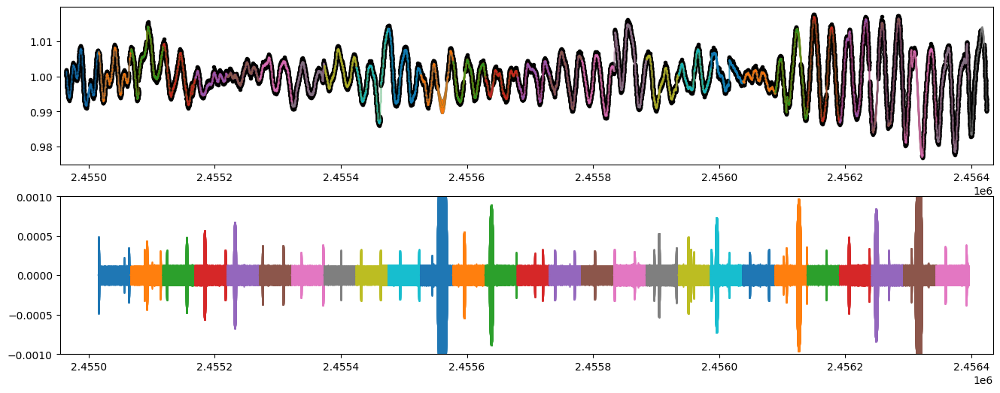

In [28]:
fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(kepler[:,0],kepler[:,1],'k.')

for i in range(len(kepGP_gaps_time_list)):
    axes[0].errorbar(kepGP_gaps_time_list[i], kepGP_gaps_pred_mean_list[i], yerr=kepGP_gaps_pred_std_list[i],marker='.',ms=1,capsize=0,elinewidth=1,alpha=0.1)

#check degree of overlap
for i in range(0,len(kepGP_gaps_time_list)-1):
    
    axes[1].errorbar(kepGP_gaps_time_list[i][-overlap:], kepGP_gaps_pred_mean_list[i][-overlap:] - kepGP_gaps_pred_mean_list[i+1][:overlap], yerr=kepGP_gaps_pred_std_list[i][-overlap:],marker='.',ms=1,capsize=0,elinewidth=1,alpha=1)
    
axes[1].set_ylim(-0.001,0.001)
for ax in axes:
    ax.set_xlim(kepler[0,0] - 10, kepler[-1,0]+10)
plt.show()

In [29]:
# stitch together
kepGP_gaps_pred_mean = np.zeros_like(t_kepler_perfect)
kepGP_gaps_pred_std = np.zeros_like(t_kepler_perfect)

for i in range(0,len(kepGP_gaps_time_list)):
    startIdx = i*(sliceSize-overlap)
    endIdx = startIdx + sliceSize
    if endIdx > len(t_kepler_perfect):
        endIdx = len(t_kepler_perfect)
    kepGP_gaps_pred_mean[startIdx:endIdx] = kepGP_gaps_pred_mean_list[i]
    kepGP_gaps_pred_std[startIdx:endIdx] = kepGP_gaps_pred_std_list[i]

np.save("./kepGP_gaps_pred_mean.npy",kepGP_gaps_pred_mean)
np.save("./kepGP_gaps_pred_std.npy",kepGP_gaps_pred_std)

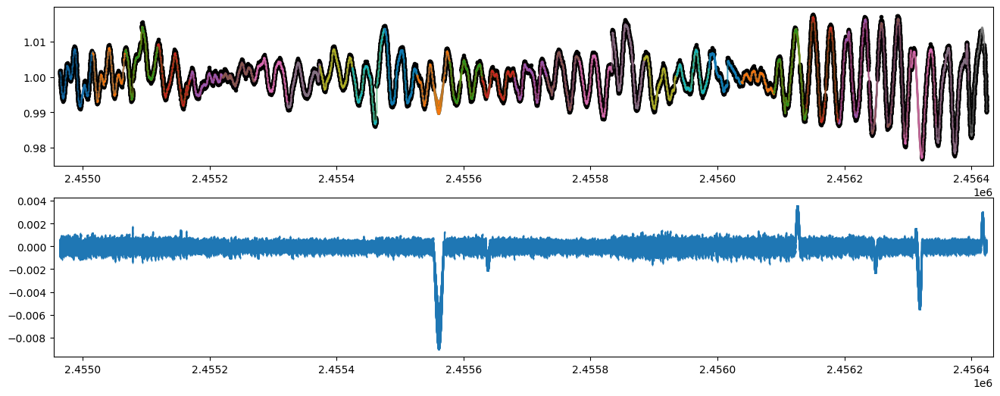

In [30]:
fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(kepler[:,0],kepler[:,1],'k.')

for i in range(len(kepGP_gaps_time_list)):
    axes[0].errorbar(kepGP_gaps_time_list[i], kepGP_gaps_pred_mean_list[i], yerr=kepGP_gaps_pred_std_list[i],marker='.',ms=1,capsize=0,elinewidth=1,alpha=0.1)

#check consistency with original time series
axes[1].errorbar(t_kepler_perfect, kepGP_gaps_pred_mean - resample_time_series(t_orig=kepler[:,0], y_orig=kepler[:,1], yerr_orig=kepler[:,2], t_new=t_kepler_perfect)[0], yerr= kepGP_gaps_pred_std, marker='.',ms=1,capsize=0,elinewidth=1,alpha=1)

for ax in axes:
    ax.set_xlim(kepler[0,0] - 10, kepler[-1,0]+10)
plt.show() 

In [31]:
#GP computation with no conditioning
kepGP_gaps =runGPfit(bounds=dict(log_a=(-20., 20.), log_b=(-20., 20.0), log_c=(-10.0, 10.0),
                                 log_P=(np.log(kepler_Prot)-0.1, np.log(kepler_Prot)+0.1)),
                     log_a_init=0.1,
                     log_b_init=0.5,
                     log_c_init=-0.01,
                     log_P_init=np.log(kepler_Prot),
                     time_to_fit=kepler[:,0],
                     flux_to_fit=kepler[:,1],
                     fluxerr_to_fit=kepler[:,2],
                     time_to_condition=t_kepler_perfect,
                     verbose=False,
                     condition=False,
                     plot=False)

print(kepGP_gaps.get_parameter_dict())
# Load saved arrays
kepGP_gaps_pred_mean = np.load("./kepGP_gaps_pred_mean.npy")
kepGP_gaps_pred_std = np.load("./kepGP_gaps_pred_std.npy")

OrderedDict([('kernel:log_a', -8.648336405702516), ('kernel:log_b', -4.89408981100133), ('kernel:log_c', -6.763856458607838), ('kernel:log_P', 3.2598768794281496)])


(5, 64696)


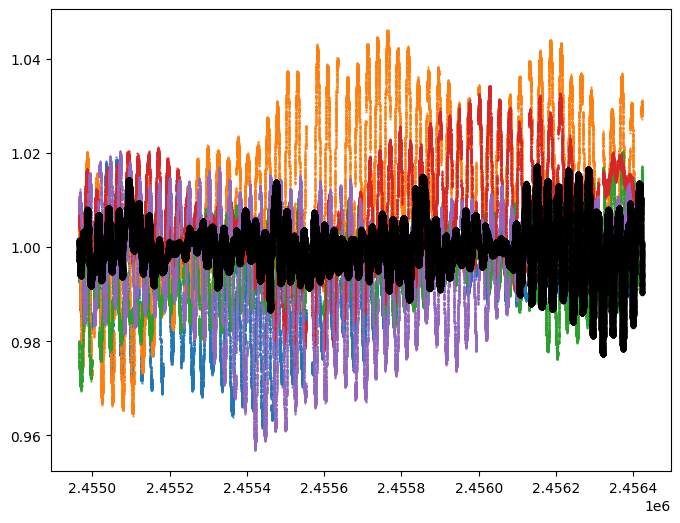

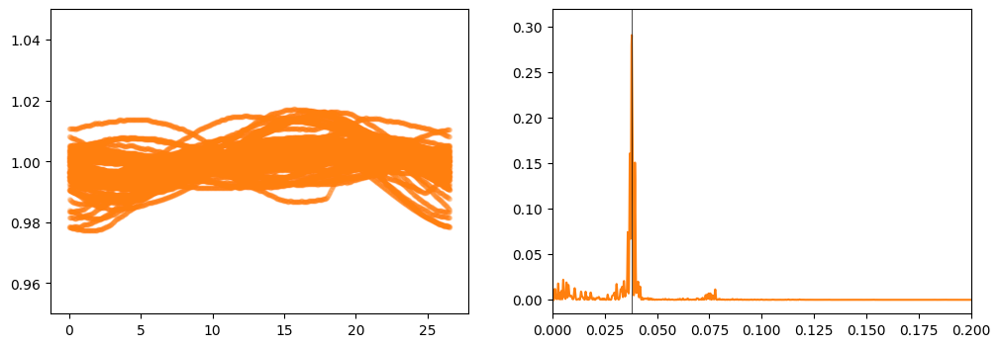

In [35]:
#random draw from least squares best fit kernel
kepGPtimeseries_gaps = kepGP_gaps.sample(size=5)
print(np.shape(kepGPtimeseries_gaps))


fig,ax = plt.subplots(1,1,figsize=(8,6))
for i in range(5):
    ax.plot(kepler[:,0],kepGPtimeseries_gaps[i],ls='None',marker='.',ms=1)
ax.plot(t_kepler_perfect,kepGP_gaps_pred_mean,'k.')
#ax.set_ylim(0.95,1.05)
#ax.set_xlim(2458222,2458224)
plt.show()

# LS periodogram of signal
frequency, power = LombScargle(t_kepler_perfect,kepGP_gaps_pred_mean).autopower(minimum_frequency=(1./(np.max(t_kepler_perfect)-np.min(t_kepler_perfect))), maximum_frequency=(1./(2.*0.000595)))

fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].plot(t_kepler_perfect%kepler_Prot,kepGP_gaps_pred_mean,color=color,marker='.',ls='None',alpha=0.1)
axes[0].set_ylim(0.95,1.05)
axes[1].plot(frequency,power,color=color,zorder=1)
axes[1].axvline(1./kepler_Prot,color='k',lw=0.5,zorder=2)
axes[1].set_xlim(0,0.2)
plt.show()

In [36]:
print(kepGP_gaps.get_parameter_dict())

OrderedDict([('kernel:log_a', -8.648336405702516), ('kernel:log_b', -4.89408981100133), ('kernel:log_c', -6.763856458607838), ('kernel:log_P', 3.2598768794281496)])


In [39]:
sliceSize = 5000
overlap = 2500

# recall---every loop we are fitting to the entire data set, but only *conditioning* on one slice of t_kepler_perfect

kepGP_perfect_time_list = []
kepGP_perfect_pred_mean_list = []
kepGP_perfect_pred_std_list = []

sliceInit = 0
lastSlice = False
while lastSlice is False:

    sliceFinal = sliceInit + sliceSize

    if sliceFinal > len(kepler[:,0]):
        sliceFinal = len(kepler[:,0])
        lastSlice = True
        
    print(sliceInit,sliceFinal)
    start = time.time()
    
    kepGP_perfect, kepGP_perfect_pred_mean, kepGP_perfect_pred_std=runGPfit(bounds=dict(log_a=(-20., 20.), log_b=(-20., 20.0), log_c=(-10.0, 10.0),
                                                                                        log_P=(np.log(kepler_Prot)-0.1, np.log(kepler_Prot)+0.1)),
                                                                           log_a_init=-8.65,
                                                                           log_b_init=-4.89,
                                                                           log_c_init=-6.76,
                                                                           log_P_init=np.log(kepler_Prot),
                                                                           time_to_fit=t_kepler_perfect,
                                                                           flux_to_fit=kepGP_gaps_pred_mean,
                                                                           fluxerr_to_fit=1.e-6*np.ones_like(t_kepler_perfect),
                                                                           time_to_condition=kepler[:,0][sliceInit:sliceFinal],
                                                                           verbose=False,
                                                                           condition=True,
                                                                           plot=False)
    end = time.time()
    print((end-start)/60.)
    print(kepGP_perfect.get_parameter_dict())
    kepGP_perfect_time_list.append(kepler[:,0][sliceInit:sliceFinal])
    kepGP_perfect_pred_mean_list.append(kepGP_perfect_pred_mean)
    kepGP_perfect_pred_std_list.append(kepGP_perfect_pred_std)
    sliceInit = sliceFinal - overlap

0 5000
2.406042551994324
OrderedDict([('kernel:log_a', -10.378666009556195), ('kernel:log_b', -2.65325166817563), ('kernel:log_c', -7.255324047798915), ('kernel:log_P', 3.2543343960393205)])
2500 7500
1.44612828095754
OrderedDict([('kernel:log_a', -10.378666009556195), ('kernel:log_b', -2.65325166817563), ('kernel:log_c', -7.255324047798915), ('kernel:log_P', 3.2543343960393205)])
5000 10000
8.592357301712036
OrderedDict([('kernel:log_a', -10.378666009556195), ('kernel:log_b', -2.65325166817563), ('kernel:log_c', -7.255324047798915), ('kernel:log_P', 3.2543343960393205)])
7500 12500
12.186061684290568
OrderedDict([('kernel:log_a', -10.378666009556195), ('kernel:log_b', -2.65325166817563), ('kernel:log_c', -7.255324047798915), ('kernel:log_P', 3.2543343960393205)])
10000 15000
1.151832067966461
OrderedDict([('kernel:log_a', -10.378666009556195), ('kernel:log_b', -2.65325166817563), ('kernel:log_c', -7.255324047798915), ('kernel:log_P', 3.2543343960393205)])
12500 17500
1.427241313457489

In [ ]:
print(len(kepGP_perfect_time_list))
print(len(kepGP_perfect_pred_mean_list))
print(len(kepGP_perfect_pred_std_list))


25
25
25


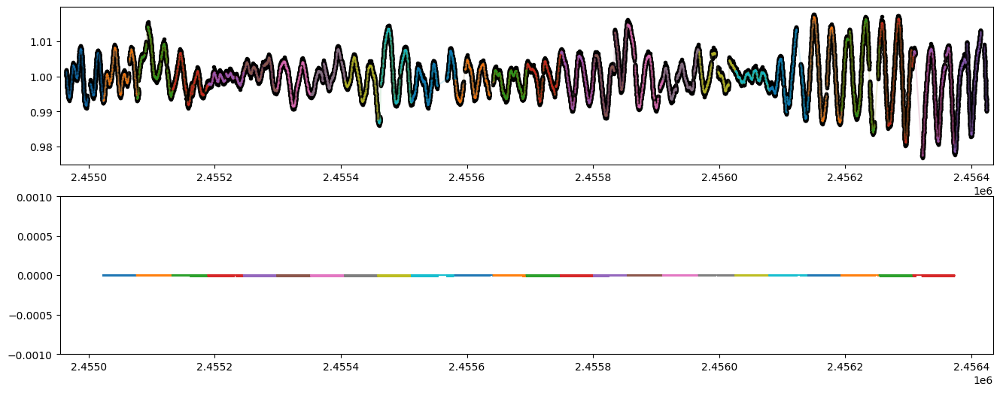

In [ ]:
fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(kepler[:,0],kepler[:,1],'k.')

for i in range(len(kepGP_perfect_time_list)):
    axes[0].errorbar(kepGP_perfect_time_list[i], kepGP_perfect_pred_mean_list[i], yerr=kepGP_perfect_pred_std_list[i],marker='.',ms=1,capsize=0,elinewidth=1,alpha=0.1)

#check degree of overlap
for i in range(0,len(kepGP_perfect_time_list)-1):
    
    axes[1].errorbar(kepGP_perfect_time_list[i][-overlap:], kepGP_perfect_pred_mean_list[i][-overlap:] - kepGP_perfect_pred_mean_list[i+1][:overlap], yerr=kepGP_perfect_pred_std_list[i][-overlap:],marker='.',ms=1,capsize=0,elinewidth=1,alpha=1)
    
axes[1].set_ylim(-0.001,0.001)
for ax in axes:
    ax.set_xlim(kepler[0,0] - 10, kepler[-1,0]+10)
plt.show()

In [45]:
# stitch together
kepGP_perfect_pred_mean = np.zeros_like(kepler[:,0])
kepGP_perfect_pred_std = np.zeros_like(kepler[:,0])

for i in range(0,len(kepGP_perfect_time_list)):
    startIdx = i*(sliceSize-overlap)
    endIdx = startIdx + sliceSize
    if endIdx > len(kepler[:,0]):
        endIdx = len(kepler[:,0])
    kepGP_perfect_pred_mean[startIdx:endIdx] = kepGP_perfect_pred_mean_list[i]
    kepGP_perfect_pred_std[startIdx:endIdx] = kepGP_perfect_pred_std_list[i]

np.save("./kepGP_perfect_pred_mean.npy",kepGP_perfect_pred_mean)
np.save("./kepGP_perfect_pred_std.npy",kepGP_perfect_pred_std)

In [ ]:
#GP computation with no conditioning
kepGP_perfect =runGPfit(bounds=dict(log_a=(-20., 20.), log_b=(-20., 20.0), log_c=(-10.0, 10.0),
                     log_P=(np.log(kepler_Prot)-0.1, np.log(kepler_Prot)+0.1)),
                     log_a_init=-8.65,
                     log_b_init=-4.89,
                     log_c_init=-6.76,
                     log_P_init=np.log(kepler_Prot),
                     time_to_fit=t_kepler_perfect,
                     flux_to_fit=kepGP_gaps_pred_mean,
                     fluxerr_to_fit=1.e-6*np.ones_like(t_kepler_perfect),
                     time_to_condition=kepler[:,0],
                     verbose=False,
                     condition=False,
                     plot=False)

print(kepGP_perfect.get_parameter_dict())
# Load saved arrays
kepGP_perfect_pred_mean = np.load("./kepGP_perfect_pred_mean.npy")
kepGP_perfect_pred_std = np.load("./kepGP_perfect_pred_std.npy")

(5, 71422)


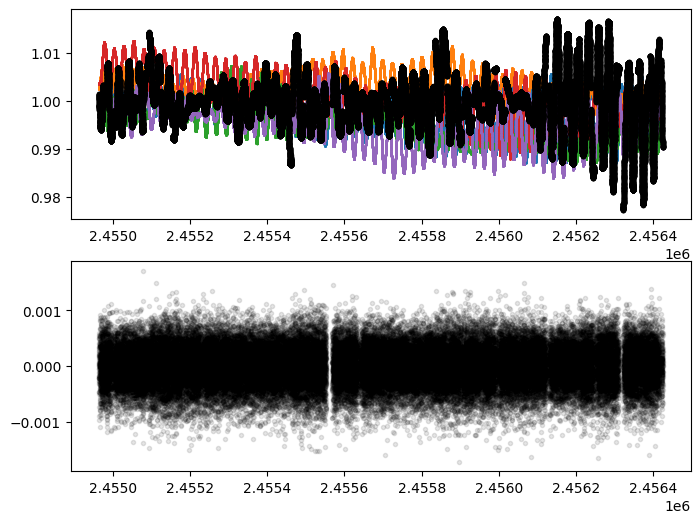

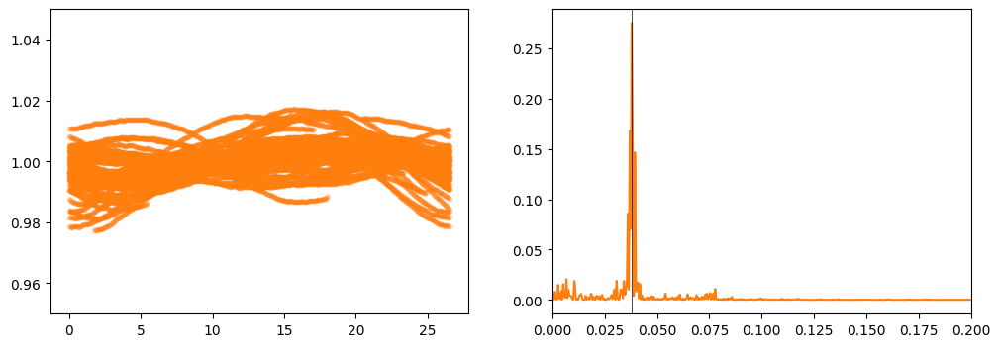

In [73]:
#random draw from least squares best fit kernel
np.random.seed(4)
kepGPtimeseries_perfect = kepGP_perfect.sample(size=5)
print(np.shape(kepGPtimeseries_perfect))


fig,axes = plt.subplots(2,1,figsize=(8,6))
for i in range(5):
    axes[0].plot(t_kepler_perfect,kepGPtimeseries_perfect[i],ls='None',marker='.',ms=1)
axes[0].plot(kepler[:,0],kepGP_perfect_pred_mean,'k.')
axes[1].plot(kepler[:,0],kepGP_perfect_pred_mean-kepler[:,1],'k.',alpha=0.1)
plt.show()

# LS periodogram of signal
frequency, power = LombScargle(kepler[:,0],kepGP_perfect_pred_mean).autopower(minimum_frequency=(1./(np.max(kepler[:,0])-np.min(kepler[:,0]))), maximum_frequency=(1./(2.*0.000595)))

fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].plot(kepler[:,0]%kepler_Prot,kepGP_perfect_pred_mean,color=color,marker='.',ls='None',alpha=0.1)
axes[0].set_ylim(0.95,1.05)
axes[1].plot(frequency,power,color=color,zorder=1)
axes[1].axvline(1./kepler_Prot,color='k',lw=0.5,zorder=2)
axes[1].set_xlim(0,0.2)
plt.show()

(71422, 4)


/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_88510/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


(64696, 4)


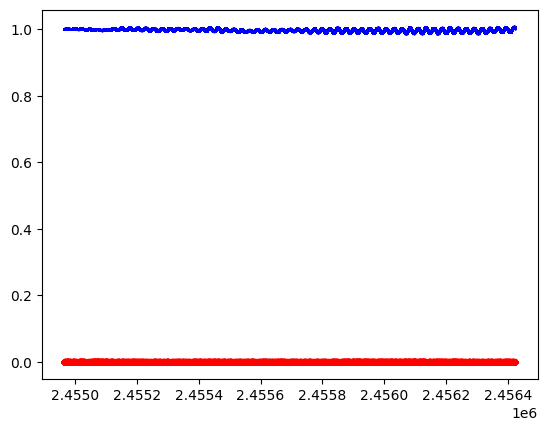

In [51]:
kepGPtimeseries_perfect = kepGPtimeseries_perfect[0]

kepGPtimeseries_perfect_noise = np.zeros_like(kepGPtimeseries_perfect)
for i in range(len(kepGPtimeseries_perfect_noise)):
    kepGPtimeseries_perfect_noise[i] = kepGPtimeseries_perfect[i] + np.random.normal(0.,np.median(kepler[:,2]),1)

kepGPtimeseries_perfect_tosave = np.vstack((t_kepler_perfect.T, 
                                              kepGPtimeseries_perfect.T,
                                              kepGPtimeseries_perfect_noise.T, 
                                              np.median(kepler[:,2])*np.ones_like(t_kepler_perfect).T)).T
print(np.shape(kepGPtimeseries_perfect_tosave))
np.savetxt("./data/1_gaussian_process/1_gaussianProcess_kepler_perfect.txt",kepGPtimeseries_perfect_tosave,fmt="%f",header=header)

kepGPtimeseries_gaps, kepGPtimeseries_gaps_err = resample_time_series(t_orig=t_kepler_perfect, 
                                                                          y_orig=kepGPtimeseries_perfect, 
                                                                          yerr_orig=1.e-6*np.ones_like(t_kepler_perfect),
                                                                        t_new=kepler[:,0])

kepGPtimeseries_gaps_noise, kepGPtimeseries_gaps_noise_err = resample_time_series(t_orig=t_kepler_perfect, 
                                                                          y_orig=kepGPtimeseries_perfect_noise, 
                                                                          yerr_orig=1.e-6*np.ones_like(t_kepler_perfect),
                                                                        t_new=kepler[:,0])

kepGPtimeseries_gaps_tosave = np.vstack((kepler[:,0].T, 
                                              kepGPtimeseries_gaps.T,
                                              kepGPtimeseries_gaps_noise.T, 
                                              kepler[:,2].T)).T
print(np.shape(kepGPtimeseries_gaps_tosave))
np.savetxt("./data/1_gaussian_process/1_gaussianProcess_kepler_gaps.txt",kepGPtimeseries_gaps_tosave,fmt="%f",header=header)


plt.plot(kepler[:,0],kepGPtimeseries_gaps,'k.',ms=2)
plt.plot(kepler[:,0],kepGPtimeseries_gaps_noise,'b.',ms=1,alpha=0.5)
plt.plot(kepler[:,0],kepGPtimeseries_gaps - kepGPtimeseries_gaps_noise,'r.')

plt.plot(t_kepler_perfect, kepGPtimeseries_perfect, 'k.',ms=2)
plt.plot(t_kepler_perfect, kepGPtimeseries_perfect_noise, 'b.',ms=1,alpha=0.5)
plt.plot(t_kepler_perfect, kepGPtimeseries_perfect-kepGPtimeseries_perfect_noise, 'r.')

In [54]:
# number of data points per rotation period
print((tess_Prot*24*60)/2)

4042.200196457112


In [59]:
sliceSize = 1250
overlap = 625

# recall---every loop we are fitting to the entire data set, but only *conditioning* on one slice of t_tess_perfect

tessGP_gaps_time_list = []
tessGP_gaps_pred_mean_list = []
tessGP_gaps_pred_std_list = []

sliceInit = 0
lastSlice = False
while lastSlice is False:

    sliceFinal = sliceInit + sliceSize

    if sliceFinal > len(t_tess_perfect):
        sliceFinal = len(t_tess_perfect)
        lastSlice = True
        
    print(sliceInit,sliceFinal)
    start = time.time()
    
    tessGP_gaps, tessGP_gaps_pred_mean, tessGP_gaps_pred_std=runGPfit(bounds=dict(log_a=(-20., 20.), log_b=(-20., 20.0), log_c=(-10.0, 10.0),
                                                                               log_P=(np.log(tess_Prot)-0.1, np.log(tess_Prot)+0.1)),
                                                                   log_a_init=0.1,
                                                                   log_b_init=0.5,
                                                                   log_c_init=-0.01,
                                                                   log_P_init=np.log(tess_Prot),
                                                                   time_to_fit=tess[:,0],
                                                                   flux_to_fit=tess[:,1],
                                                                   fluxerr_to_fit=tess[:,2],
                                                                   time_to_condition=t_tess_perfect[sliceInit:sliceFinal],
                                                                   verbose=False,
                                                                   condition=True,
                                                                   plot=False)
    end = time.time()
    print(tessGP_gaps.get_parameter_dict())
    print((end-start)/60.)
    
    
    tessGP_gaps_time_list.append(t_tess_perfect[sliceInit:sliceFinal])
    tessGP_gaps_pred_mean_list.append(tessGP_gaps_pred_mean)
    tessGP_gaps_pred_std_list.append(tessGP_gaps_pred_std)
    sliceInit = sliceFinal - overlap

0 1250
OrderedDict([('kernel:log_a', -6.556031262834568), ('kernel:log_b', -6.349660401762029), ('kernel:log_c', -7.551913642947632), ('kernel:log_P', 1.6264192414086902)])
0.6594720880190531
625 1875
OrderedDict([('kernel:log_a', -6.556031262834568), ('kernel:log_b', -6.349660401762029), ('kernel:log_c', -7.551913642947632), ('kernel:log_P', 1.6264192414086902)])
0.6339186986287435
1250 2500
OrderedDict([('kernel:log_a', -6.556031262834568), ('kernel:log_b', -6.349660401762029), ('kernel:log_c', -7.551913642947632), ('kernel:log_P', 1.6264192414086902)])
0.7485272328058878
1875 3125
OrderedDict([('kernel:log_a', -6.556031262834568), ('kernel:log_b', -6.349660401762029), ('kernel:log_c', -7.551913642947632), ('kernel:log_P', 1.6264192414086902)])
0.6904428323109945
2500 3750
OrderedDict([('kernel:log_a', -6.556031262834568), ('kernel:log_b', -6.349660401762029), ('kernel:log_c', -7.551913642947632), ('kernel:log_P', 1.6264192414086902)])
0.6226835012435913
3125 4375
OrderedDict([('kern

In [60]:
print(len(tessGP_gaps_time_list))
print(len(tessGP_gaps_pred_mean_list))
print(len(tessGP_gaps_pred_std_list))
print(tess[0,0])
print(tess[-1,0])

411
411
411
2458325.297928
2458682.356167


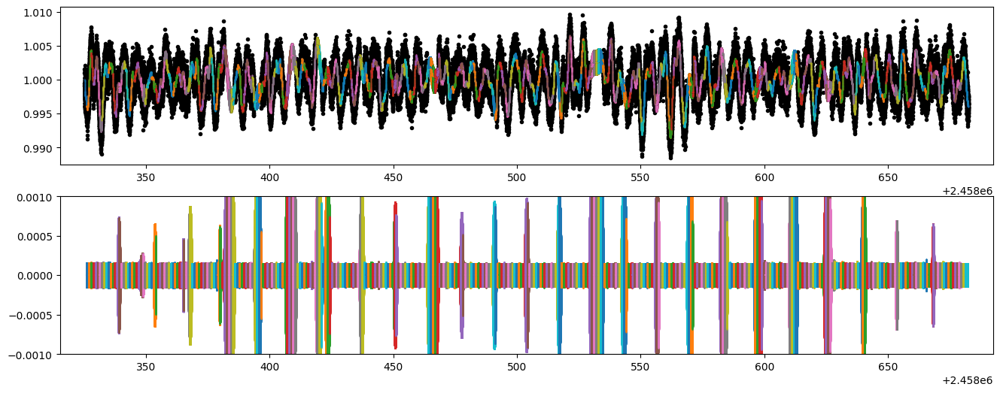

In [61]:
fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(tess[:,0],tess[:,1],'k.')

for i in range(len(tessGP_gaps_time_list)):
    axes[0].errorbar(tessGP_gaps_time_list[i], tessGP_gaps_pred_mean_list[i], yerr=tessGP_gaps_pred_std_list[i],marker='.',ms=1,capsize=0,elinewidth=1,alpha=0.1)

#check degree of overlap
for i in range(0,len(tessGP_gaps_time_list)-1):
    
    axes[1].errorbar(tessGP_gaps_time_list[i][-overlap:], tessGP_gaps_pred_mean_list[i][-overlap:] - tessGP_gaps_pred_mean_list[i+1][:overlap], yerr=tessGP_gaps_pred_std_list[i][-overlap:],marker='.',ms=1,capsize=0,elinewidth=1,alpha=1)
    
axes[1].set_ylim(-0.001,0.001)
for ax in axes:
    ax.set_xlim(tess[0,0] - 10, tess[-1,0]+10)
plt.show()

In [62]:
# stitch together
tessGP_gaps_pred_mean = np.zeros_like(t_tess_perfect)
tessGP_gaps_pred_std = np.zeros_like(t_tess_perfect)

for i in range(0,len(tessGP_gaps_time_list)):
    startIdx = i*(sliceSize-overlap)
    endIdx = startIdx + sliceSize
    if endIdx > len(t_tess_perfect):
        endIdx = len(t_tess_perfect)
    tessGP_gaps_pred_mean[startIdx:endIdx] = tessGP_gaps_pred_mean_list[i]
    tessGP_gaps_pred_std[startIdx:endIdx] = tessGP_gaps_pred_std_list[i]

np.save("./tessGP_gaps_pred_mean.npy",tessGP_gaps_pred_mean)
np.save("./tessGP_gaps_pred_std.npy",tessGP_gaps_pred_std)

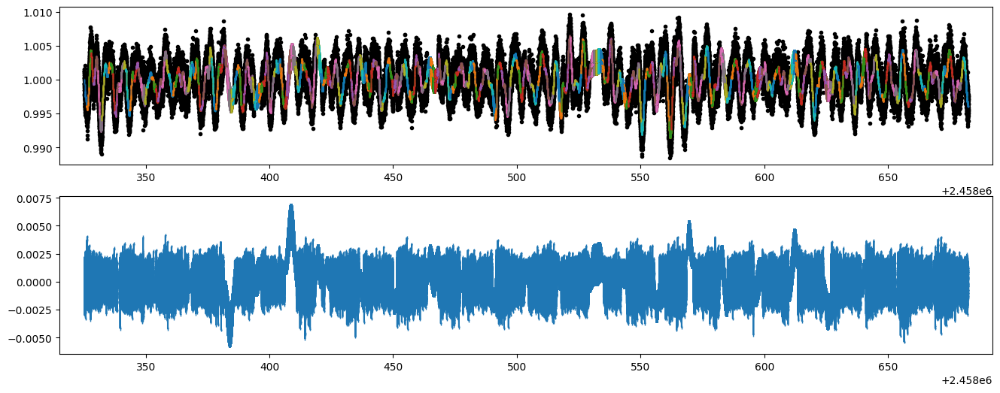

In [63]:
fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(tess[:,0],tess[:,1],'k.')

for i in range(len(tessGP_gaps_time_list)):
    axes[0].errorbar(tessGP_gaps_time_list[i], tessGP_gaps_pred_mean_list[i], yerr=tessGP_gaps_pred_std_list[i],marker='.',ms=1,capsize=0,elinewidth=1,alpha=0.1)

#check consistency with original time series
axes[1].errorbar(t_tess_perfect, tessGP_gaps_pred_mean - resample_time_series(t_orig=tess[:,0], y_orig=tess[:,1], yerr_orig=tess[:,2], t_new=t_tess_perfect)[0], yerr= tessGP_gaps_pred_std, marker='.',ms=1,capsize=0,elinewidth=1,alpha=1)

for ax in axes:
    ax.set_xlim(tess[0,0] - 10, tess[-1,0]+10)
plt.show() 

In [ ]:
#GP computation with no conditioning
tessGP_gaps =runGPfit(bounds=dict(log_a=(-20., 20.), log_b=(-20., 20.0), log_c=(-10.0, 10.0),
                                 log_P=(np.log(tess_Prot)-0.1, np.log(tess_Prot)+0.1)),
                     log_a_init=0.1,
                     log_b_init=0.5,
                     log_c_init=-0.01,
                     log_P_init=np.log(tess_Prot),
                     time_to_fit=tess[:,0],
                     flux_to_fit=tess[:,1],
                     fluxerr_to_fit=tess[:,2],
                     time_to_condition=t_tess_perfect,
                     verbose=False,
                     condition=False,
                     plot=False)

print(tessGP_gaps.get_parameter_dict())
# Load saved arrays
tessGP_gaps_pred_mean = np.load("./tessGP_gaps_pred_mean.npy")
tessGP_gaps_pred_std = np.load("./tessGP_gaps_pred_std.npy")

(5, 205310)


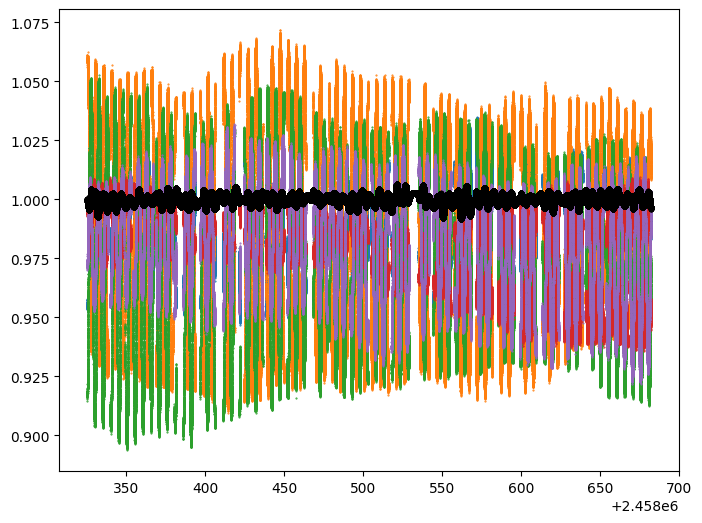

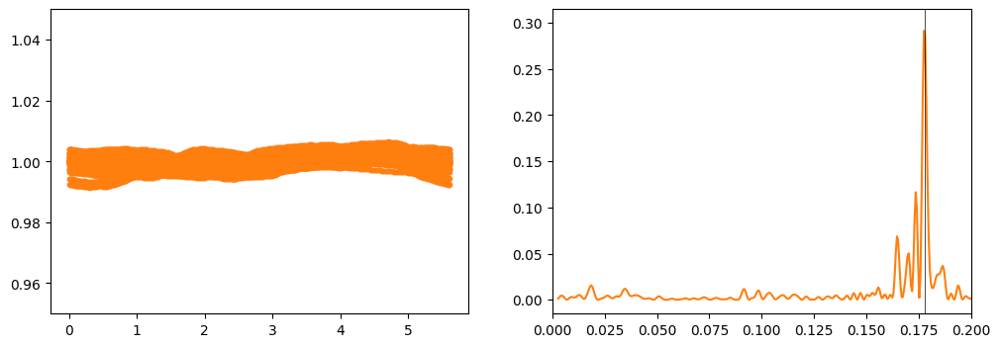

In [64]:
#random draw from least squares best fit kernel
tessGPtimeseries_gaps = tessGP_gaps.sample(size=5)
print(np.shape(tessGPtimeseries_gaps))


fig,ax = plt.subplots(1,1,figsize=(8,6))
for i in range(5):
    ax.plot(tess[:,0],tessGPtimeseries_gaps[i],ls='None',marker='.',ms=1)
ax.plot(t_tess_perfect,tessGP_gaps_pred_mean,'k.')
#ax.set_ylim(0.95,1.05)
#ax.set_xlim(2458222,2458224)
plt.show()

# LS periodogram of signal
frequency, power = LombScargle(t_tess_perfect,tessGP_gaps_pred_mean).autopower(minimum_frequency=(1./(np.max(t_tess_perfect)-np.min(t_tess_perfect))), maximum_frequency=(1./(2.*0.000595)))

fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].plot(t_tess_perfect%tess_Prot,tessGP_gaps_pred_mean,color=color,marker='.',ls='None',alpha=0.1)
axes[0].set_ylim(0.95,1.05)
axes[1].plot(frequency,power,color=color,zorder=1)
axes[1].axvline(1./tess_Prot,color='k',lw=0.5,zorder=2)
axes[1].set_xlim(0,0.2)
plt.show()

In [65]:
print(tessGP_gaps.get_parameter_dict())

OrderedDict([('kernel:log_a', -6.556031262834568), ('kernel:log_b', -6.349660401762029), ('kernel:log_c', -7.551913642947632), ('kernel:log_P', 1.6264192414086902)])


In [66]:
sliceSize = 1250
overlap = 625

# recall---every loop we are fitting to the entire data set, but only *conditioning* on one slice of t_tess_perfect

tessGP_perfect_time_list = []
tessGP_perfect_pred_mean_list = []
tessGP_perfect_pred_std_list = []

sliceInit = 0
lastSlice = False
while lastSlice is False:

    sliceFinal = sliceInit + sliceSize

    if sliceFinal > len(tess[:,0]):
        sliceFinal = len(tess[:,0])
        lastSlice = True
        
    print(sliceInit,sliceFinal)
    start = time.time()
    
    tessGP_perfect, tessGP_perfect_pred_mean, tessGP_perfect_pred_std=runGPfit(bounds=dict(log_a=(-20., 20.), log_b=(-20., 20.0), log_c=(-10.0, 10.0),
                                                                                        log_P=(np.log(tess_Prot)-0.1, np.log(tess_Prot)+0.1)),
                                                                           log_a_init=-8.65,
                                                                           log_b_init=-4.89,
                                                                           log_c_init=-6.76,
                                                                           log_P_init=np.log(tess_Prot),
                                                                           time_to_fit=t_tess_perfect,
                                                                           flux_to_fit=tessGP_gaps_pred_mean,
                                                                           fluxerr_to_fit=1.e-6*np.ones_like(t_tess_perfect),
                                                                           time_to_condition=tess[:,0][sliceInit:sliceFinal],
                                                                           verbose=False,
                                                                           condition=True,
                                                                           plot=False)
    end = time.time()
    print((end-start)/60.)
    print(tessGP_perfect.get_parameter_dict())
    tessGP_perfect_time_list.append(tess[:,0][sliceInit:sliceFinal])
    tessGP_perfect_pred_mean_list.append(tessGP_perfect_pred_mean)
    tessGP_perfect_pred_std_list.append(tessGP_perfect_pred_std)
    sliceInit = sliceFinal - overlap

0 1250
1.2580893635749817
OrderedDict([('kernel:log_a', -8.924666116056455), ('kernel:log_b', -7.427371927891691), ('kernel:log_c', -9.212360407961924), ('kernel:log_P', 1.6252932137860987)])
625 1875
0.7081769148508708
OrderedDict([('kernel:log_a', -8.924666116056455), ('kernel:log_b', -7.427371927891691), ('kernel:log_c', -9.212360407961924), ('kernel:log_P', 1.6252932137860987)])
1250 2500
0.7149940649668376
OrderedDict([('kernel:log_a', -8.924666116056455), ('kernel:log_b', -7.427371927891691), ('kernel:log_c', -9.212360407961924), ('kernel:log_P', 1.6252932137860987)])
1875 3125
0.7123144825299581
OrderedDict([('kernel:log_a', -8.924666116056455), ('kernel:log_b', -7.427371927891691), ('kernel:log_c', -9.212360407961924), ('kernel:log_P', 1.6252932137860987)])
2500 3750
0.7533988356590271
OrderedDict([('kernel:log_a', -8.924666116056455), ('kernel:log_b', -7.427371927891691), ('kernel:log_c', -9.212360407961924), ('kernel:log_P', 1.6252932137860987)])
3125 4375
0.6981751879056295


In [67]:
print(len(tessGP_perfect_time_list))
print(len(tessGP_perfect_pred_mean_list))
print(len(tessGP_perfect_pred_std_list))

328
328
328


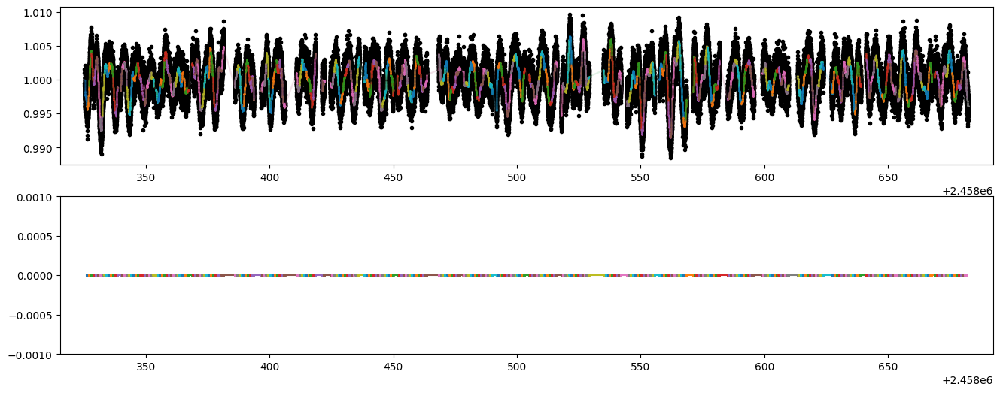

In [68]:
fig, axes = plt.subplots(2,1,figsize=(16,6))
axes[0].plot(tess[:,0],tess[:,1],'k.')

for i in range(len(tessGP_perfect_time_list)):
    axes[0].errorbar(tessGP_perfect_time_list[i], tessGP_perfect_pred_mean_list[i], yerr=tessGP_perfect_pred_std_list[i],marker='.',ms=1,capsize=0,elinewidth=1,alpha=0.1)

#check degree of overlap
for i in range(0,len(tessGP_perfect_time_list)-1):
    
    axes[1].errorbar(tessGP_perfect_time_list[i][-overlap:], tessGP_perfect_pred_mean_list[i][-overlap:] - tessGP_perfect_pred_mean_list[i+1][:overlap], yerr=tessGP_perfect_pred_std_list[i][-overlap:],marker='.',ms=1,capsize=0,elinewidth=1,alpha=1)
    
axes[1].set_ylim(-0.001,0.001)
for ax in axes:
    ax.set_xlim(tess[0,0] - 10, tess[-1,0]+10)
plt.show()

In [69]:
# stitch together
tessGP_perfect_pred_mean = np.zeros_like(tess[:,0])
tessGP_perfect_pred_std = np.zeros_like(tess[:,0])

for i in range(0,len(tessGP_perfect_time_list)):
    startIdx = i*(sliceSize-overlap)
    endIdx = startIdx + sliceSize
    if endIdx > len(tess[:,0]):
        endIdx = len(tess[:,0])
    tessGP_perfect_pred_mean[startIdx:endIdx] = tessGP_perfect_pred_mean_list[i]
    tessGP_perfect_pred_std[startIdx:endIdx] = tessGP_perfect_pred_std_list[i]

np.save("./tessGP_perfect_pred_mean.npy",tessGP_perfect_pred_mean)
np.save("./tessGP_perfect_pred_std.npy",tessGP_perfect_pred_std)

In [89]:
#GP computation with no conditioning
tessGP_perfect =runGPfit(bounds=dict(log_a=(-20., 20.), log_b=(-20., 20.0), log_c=(-10.0, 10.0),
                     log_P=(np.log(tess_Prot)-0.1, np.log(tess_Prot)+0.1)),
                     log_a_init=-8.65,
                     log_b_init=-4.89,
                     log_c_init=-6.76,
                     log_P_init=np.log(tess_Prot),
                     time_to_fit=t_tess_perfect,
                     flux_to_fit=tessGP_gaps_pred_mean,
                     fluxerr_to_fit=1.e-6*np.ones_like(t_tess_perfect),
                     time_to_condition=tess[:,0],
                     verbose=False,
                     condition=False,
                     plot=False)

print(tessGP_perfect.get_parameter_dict())
# Load saved arrays
tessGP_perfect_pred_mean = np.load("./tessGP_perfect_pred_mean.npy")
tessGP_perfect_pred_std = np.load("./tessGP_perfect_pred_std.npy")

OrderedDict([('kernel:log_a', -8.924666116056455), ('kernel:log_b', -7.427371927891691), ('kernel:log_c', -9.212360407961924), ('kernel:log_P', 1.6252932137860987)])


(1, 257062)


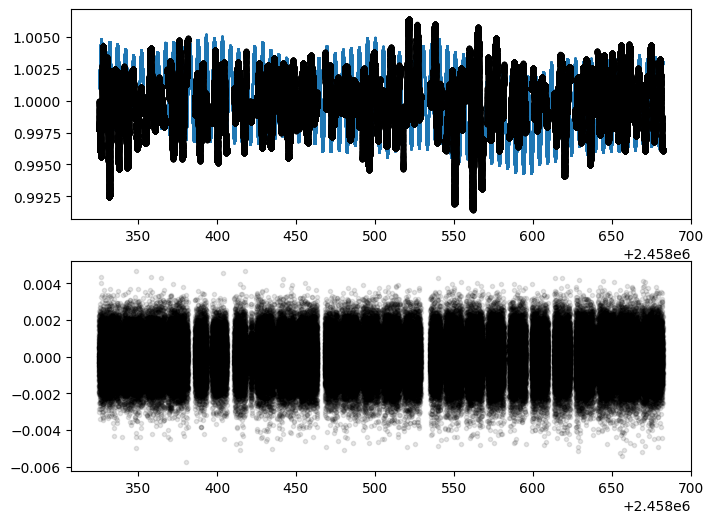

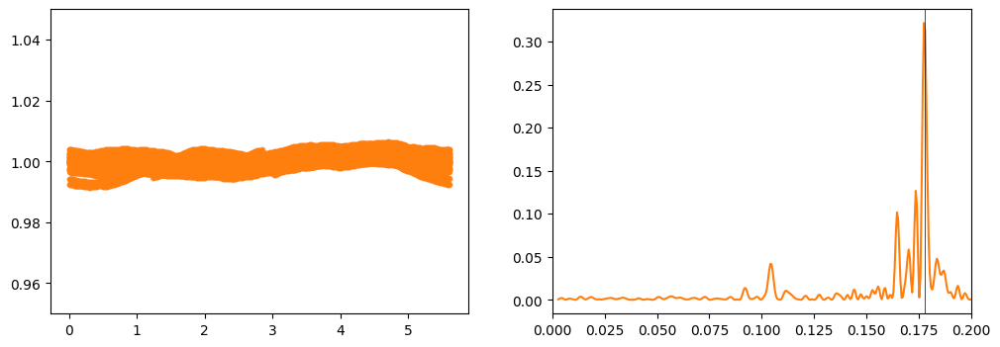

In [94]:
#random draw from least squares best fit kernel
np.random.seed(8)
tessGPtimeseries_perfect = tessGP_perfect.sample(size=1)
print(np.shape(tessGPtimeseries_perfect))


fig,axes = plt.subplots(2,1,figsize=(8,6))
for i in range(1):
    axes[0].plot(t_tess_perfect,tessGPtimeseries_perfect[i],ls='None',marker='.',ms=1)
axes[0].plot(tess[:,0],tessGP_perfect_pred_mean,'k.')
axes[1].plot(tess[:,0],tessGP_perfect_pred_mean-tess[:,1],'k.',alpha=0.1)
plt.show()

# LS periodogram of signal
frequency, power = LombScargle(tess[:,0],tessGP_perfect_pred_mean).autopower(minimum_frequency=(1./(np.max(tess[:,0])-np.min(tess[:,0]))), maximum_frequency=(1./(2.*0.000595)))

fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].plot(tess[:,0]%tess_Prot,tessGP_perfect_pred_mean,color=color,marker='.',ls='None',alpha=0.1)
axes[0].set_ylim(0.95,1.05)
axes[1].plot(frequency,power,color=color,zorder=1)
axes[1].axvline(1./tess_Prot,color='k',lw=0.5,zorder=2)
axes[1].set_xlim(0,0.2)
plt.show()

In [96]:
tessGPtimeseries_perfect = tessGPtimeseries_perfect[0]

tessGPtimeseries_perfect_noise = tessGPtimeseries_perfect + np.random.normal(0.,np.median(tess[:,2]),len(tessGPtimeseries_perfect))

tessGPtimeseries_perfect_tosave = np.vstack((t_tess_perfect.T, 
                                              tessGPtimeseries_perfect.T,
                                              tessGPtimeseries_perfect_noise.T, 
                                              np.median(tess[:,2])*np.ones_like(t_tess_perfect).T)).T
print(np.shape(tessGPtimeseries_perfect_tosave))
np.savetxt("./data/1_gaussian_process/1_gaussianProcess_tess_perfect.txt",tessGPtimeseries_perfect_tosave,fmt="%f",header=header)

tessGPtimeseries_gaps, tessGPtimeseries_gaps_err = resample_time_series(t_orig=t_tess_perfect, 
                                                                          y_orig=tessGPtimeseries_perfect, 
                                                                          yerr_orig=1.e-6*np.ones_like(t_tess_perfect),
                                                                        t_new=tess[:,0])

tessGPtimeseries_gaps_noise, tessGPtimeseries_gaps_noise_err = resample_time_series(t_orig=t_tess_perfect, 
                                                                          y_orig=tessGPtimeseries_perfect_noise, 
                                                                          yerr_orig=1.e-6*np.ones_like(t_tess_perfect),
                                                                        t_new=tess[:,0])

tessGPtimeseries_gaps_tosave = np.vstack((tess[:,0].T, 
                                              tessGPtimeseries_gaps.T,
                                              tessGPtimeseries_gaps_noise.T, 
                                              tess[:,2].T)).T
print(np.shape(tessGPtimeseries_gaps_tosave))
np.savetxt("./data/1_gaussian_process/1_gaussianProcess_tess_gaps.txt",tessGPtimeseries_gaps_tosave,fmt="%f",header=header)

(257062, 4)


/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_88510/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


(205310, 4)


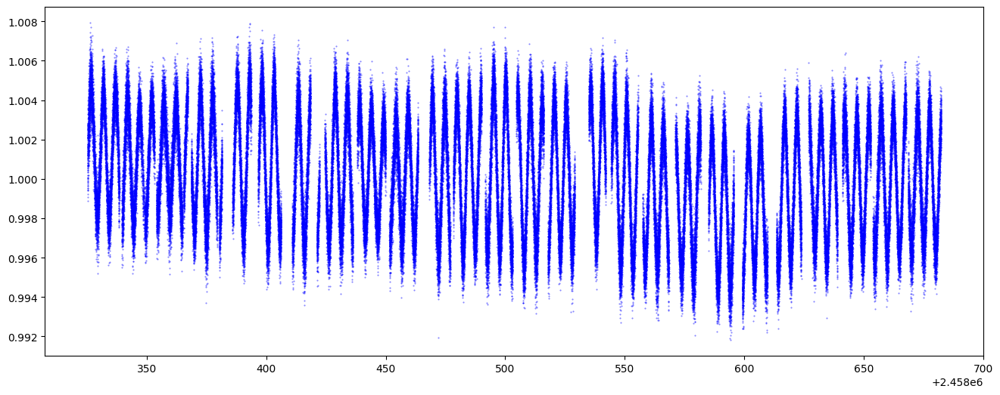

In [97]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
#ax.plot(tess[:,0],tessGPtimeseries_gaps,'k.',ms=1,ls="None")
ax.plot(tess[:,0],tessGPtimeseries_gaps_noise,'b.',ms=1,alpha=0.5,ls='None')
#ax.plot(tess[:,0],tessGPtimeseries_gaps - tessGPtimeseries_gaps_noise,'r.')

#ax.plot(t_tess_perfect, tessGPtimeseries_perfect[0], 'k.',ms=1)
#ax.plot(t_tess_perfect, tessGPtimeseries_perfect_noise, 'b.',ms=1,alpha=0.5)
#plt.plot(t_tess_perfect, tessGPtimeseries_perfect[0]-tessGPtimeseries_perfect_noise, 'r.')
plt.show()

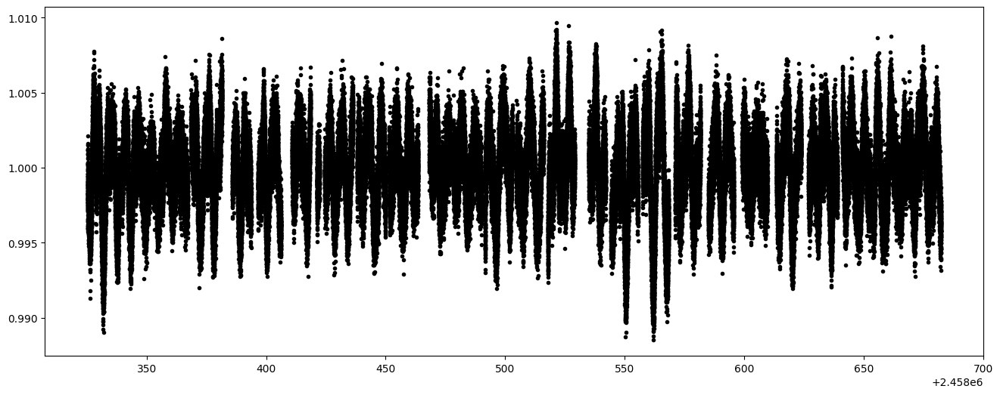

In [98]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
ax.plot(tess[:,0],tess[:,1],'k.')
plt.show()

# 2. Simple periodic time series (sum of sines)

In [127]:
print(speculoos_Prot*np.e)
print(np.ptp(speculoos_trunc[:,1]))

0.5780647957969967
0.13136100000000006


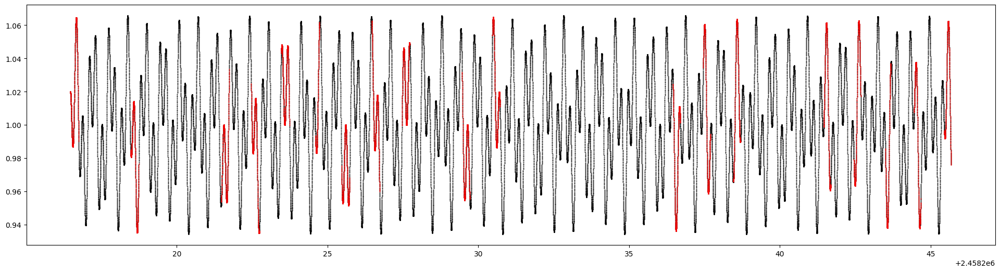

(44119, 4)
(6758, 4)


In [133]:
v1 = 2*np.pi*(1./(speculoos_Prot*np.e))
v2 = 2*np.pi*(1./speculoos_Prot)

specSimplePeriodic_perfect = 0.25*np.ptp(speculoos_trunc[:,1])*(np.sin(t_speculoos_trunc_perfect*v1) + np.sin(t_speculoos_trunc_perfect*v2)) + 1
specSimplePeriodic_gaps = 0.25*np.ptp(speculoos_trunc[:,1])*(np.sin(speculoos_trunc[:,0]*v1) + np.sin(speculoos_trunc[:,0]*v2)) + 1

fig, ax = plt.subplots(1,1,figsize=(24,6))
ax.plot(t_speculoos_trunc_perfect, specSimplePeriodic_perfect, 'k.',ms=1)
ax.plot(speculoos_trunc[:,0], specSimplePeriodic_gaps, 'r.',ms=1)
plt.show()

np.random.seed(8421)

specSimplePeriodic_perfect_noise = specSimplePeriodic_perfect + np.random.normal(0.,np.median(speculoos_trunc[:,2]),len(t_speculoos_trunc_perfect))

specSimplePeriodic_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                               specSimplePeriodic_perfect.T,
                                               specSimplePeriodic_perfect_noise.T,
                                               np.median(speculoos[:,2])*np.ones_like(t_speculoos_trunc_perfect).T)).T
print(np.shape(specSimplePeriodic_perfect_tosave))
np.savetxt("./data/2_simple_periodic/2_simplePeriodic_speculoos_perfect.txt",specSimplePeriodic_perfect_tosave,fmt="%f",header=header)

specSimplePeriodic_gaps_noise = np.zeros_like(specSimplePeriodic_gaps)

for i in range(len(specSimplePeriodic_gaps)):
    specSimplePeriodic_gaps[i] = specSimplePeriodic_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2],1)

specSimplePeriodic_gaps_tosave = np.vstack((speculoos_trunc[:,0].T, 
                                              specSimplePeriodic_gaps.T,
                                              specSimplePeriodic_gaps_noise.T,
                                              speculoos_trunc[:,2].T)).T
print(np.shape(specSimplePeriodic_gaps_tosave))
np.savetxt("./data/2_simple_periodic/2_simplePeriodic_speculoos_gaps.txt",specSimplePeriodic_gaps_tosave,fmt="%f",header=header)

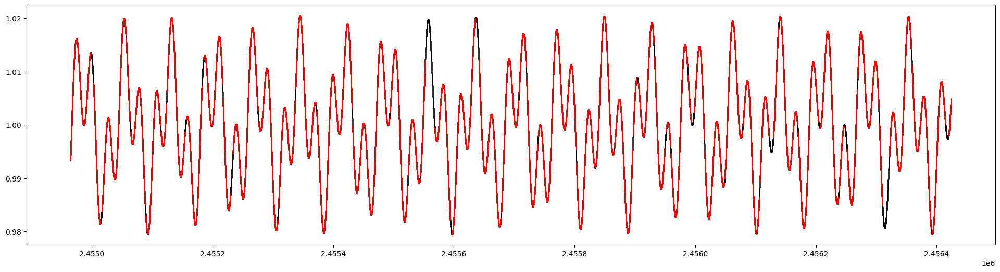

(71422, 4)
(64696, 4)


In [134]:
v1 = 2*np.pi*(1./(kepler_Prot*np.e))
v2 = 2*np.pi*(1./kepler_Prot)

kepSimplePeriodic_perfect = 0.25*np.ptp(kepler[:,1])*(np.sin(t_kepler_perfect*v1) + np.sin(t_kepler_perfect*v2)) + 1
kepSimplePeriodic_gaps = 0.25*np.ptp(kepler[:,1])*(np.sin(kepler[:,0]*v1) + np.sin(kepler[:,0]*v2)) + 1

fig, ax = plt.subplots(1,1,figsize=(24,6))
ax.plot(t_kepler_perfect, kepSimplePeriodic_perfect, 'k.',ms=1)
ax.plot(kepler[:,0], kepSimplePeriodic_gaps, 'r.',ms=1)
plt.show()

np.random.seed(8421)

kepSimplePeriodic_perfect_noise = kepSimplePeriodic_perfect + np.random.normal(0.,np.median(kepler[:,2]),len(t_kepler_perfect))

kepSimplePeriodic_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                               kepSimplePeriodic_perfect.T,
                                               kepSimplePeriodic_perfect_noise.T,
                                               np.median(kepler[:,2])*np.ones_like(t_kepler_perfect).T)).T
print(np.shape(kepSimplePeriodic_perfect_tosave))
np.savetxt("./data/2_simple_periodic/2_simplePeriodic_kepler_perfect.txt",kepSimplePeriodic_perfect_tosave,fmt="%f",header=header)

kepSimplePeriodic_gaps_noise = np.zeros_like(kepSimplePeriodic_gaps)

for i in range(len(kepSimplePeriodic_gaps)):
    kepSimplePeriodic_gaps[i] = kepSimplePeriodic_gaps[i] + np.random.normal(0.,kepler[i,2],1)

kepSimplePeriodic_gaps_tosave = np.vstack((kepler[:,0].T, 
                                              kepSimplePeriodic_gaps.T,
                                              kepSimplePeriodic_gaps_noise.T,
                                              kepler[:,2].T)).T
print(np.shape(kepSimplePeriodic_gaps_tosave))
np.savetxt("./data/2_simple_periodic/2_simplePeriodic_kepler_gaps.txt",kepSimplePeriodic_gaps_tosave,fmt="%f",header=header)

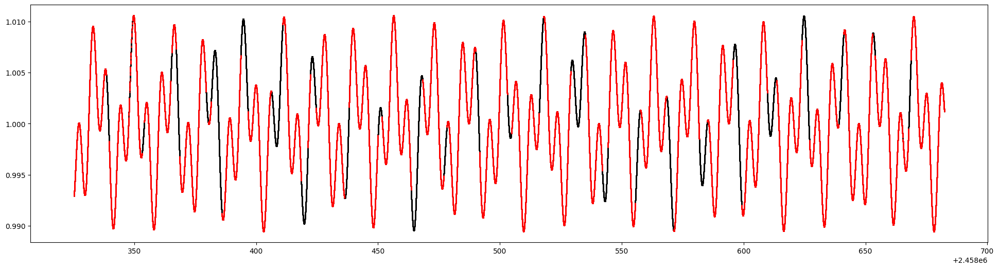

(257062, 4)
(205310, 4)


In [135]:
v1 = 2*np.pi*(1./(tess_Prot*np.e))
v2 = 2*np.pi*(1./tess_Prot)

tessSimplePeriodic_perfect = 0.25*np.ptp(tess[:,1])*(np.sin(t_tess_perfect*v1) + np.sin(t_tess_perfect*v2)) + 1
tessSimplePeriodic_gaps = 0.25*np.ptp(tess[:,1])*(np.sin(tess[:,0]*v1) + np.sin(tess[:,0]*v2)) + 1

fig, ax = plt.subplots(1,1,figsize=(24,6))
ax.plot(t_tess_perfect, tessSimplePeriodic_perfect, 'k.',ms=1)
ax.plot(tess[:,0], tessSimplePeriodic_gaps, 'r.',ms=1)
plt.show()

np.random.seed(8421)

tessSimplePeriodic_perfect_noise = tessSimplePeriodic_perfect + np.random.normal(0.,np.median(tess[:,2]),len(t_tess_perfect))

tessSimplePeriodic_perfect_tosave = np.vstack((t_tess_perfect.T,
                                               tessSimplePeriodic_perfect.T,
                                               tessSimplePeriodic_perfect_noise.T,
                                               np.median(tess[:,2])*np.ones_like(t_tess_perfect).T)).T
print(np.shape(tessSimplePeriodic_perfect_tosave))
np.savetxt("./data/2_simple_periodic/2_simplePeriodic_tess_perfect.txt",tessSimplePeriodic_perfect_tosave,fmt="%f",header=header)

tessSimplePeriodic_gaps_noise = np.zeros_like(tessSimplePeriodic_gaps)

for i in range(len(tessSimplePeriodic_gaps)):
    tessSimplePeriodic_gaps[i] = tessSimplePeriodic_gaps[i] + np.random.normal(0.,tess[i,2],1)

tessSimplePeriodic_gaps_tosave = np.vstack((tess[:,0].T, 
                                              tessSimplePeriodic_gaps.T,
                                              tessSimplePeriodic_gaps_noise.T,
                                              tess[:,2].T)).T
print(np.shape(tessSimplePeriodic_gaps_tosave))
np.savetxt("./data/2_simple_periodic/2_simplePeriodic_tess_gaps.txt",tessSimplePeriodic_gaps_tosave,fmt="%f",header=header)

# 3. KB88 R(t)

In [150]:
def KB88_noV(t,a1=1.0,a2=0.6,a3=0.2,v1=0.1,v2=0.048,v3=0.0252):
    w1 = 2*np.pi*v1
    w2 = 2*np.pi*v2
    w3 = 2*np.pi*v3
    
    r = a1 * np.cos(w1 * t) + a2 * np.cos(w2 * t) + a3 * np.cos(w3 * t) + 0.5 * a1 * a3 * (np.cos( (w1 + w3) * t) + np.cos( (w1 - w3) * t)) + 0.1 * a2 * a3 * (np.cos( (w2 + w3) * t) + np.cos( (w2 - w3) * t)) + 0.1 * a1 * a2 * (np.cos( (w1 + w2) * t) + np.cos( (w1 - w2) * t)) + 0.1 * a1**2 * np.cos(2. * w1 * t) + 0.1 * a2**2 * np.cos(2. * w2 * t)
            
    return r

1.0126273481319261
0.9956817219719597


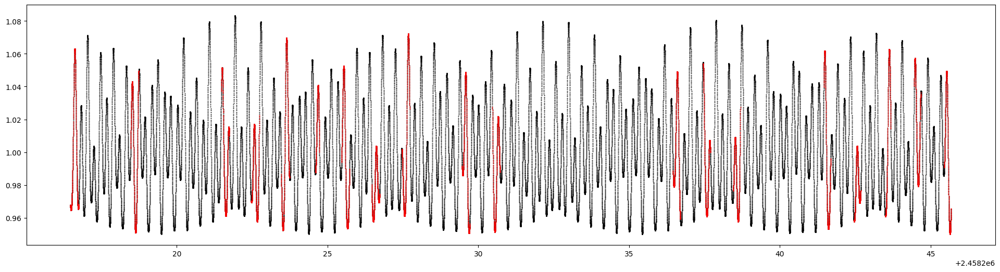

(44119, 4)
(6758, 4)


In [163]:
specMultiPeriodic_perfect = (1/3.6)*np.ptp(speculoos_trunc[:,1]) * KB88_noV(t_speculoos_trunc_perfect,v1=(1./speculoos_Prot), v2=(0.48/speculoos_Prot),v3=(0.252/speculoos_Prot)) + 1
specMultiPeriodic_gaps = (1/3.6)*np.ptp(speculoos_trunc[:,1]) * KB88_noV(speculoos_trunc[:,0],v1=(1./speculoos_Prot), v2=(0.48/speculoos_Prot),v3=(0.252/speculoos_Prot)) + 1

print(np.ptp(specMultiPeriodic_perfect)/np.ptp(speculoos_trunc[:,1]))
print(np.median(specMultiPeriodic_perfect))

fig, ax = plt.subplots(1,1,figsize=(24,6))
ax.plot(t_speculoos_trunc_perfect, specMultiPeriodic_perfect, 'k.',ms=1)
ax.plot(speculoos_trunc[:,0], specMultiPeriodic_gaps, 'r.',ms=1)
plt.show()

np.random.seed(8421)

specMultiPeriodic_perfect_noise = specMultiPeriodic_perfect + np.random.normal(0.,np.median(speculoos_trunc[:,2]),len(t_speculoos_trunc_perfect))

specMultiPeriodic_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                               specMultiPeriodic_perfect.T,
                                               specMultiPeriodic_perfect_noise.T,
                                               np.median(speculoos[:,2])*np.ones_like(t_speculoos_trunc_perfect).T)).T
print(np.shape(specMultiPeriodic_perfect_tosave))
np.savetxt("./data/3_KB88_r/3_KB88r_speculoos_perfect.txt",specMultiPeriodic_perfect_tosave,fmt="%f",header=header)

specMultiPeriodic_gaps_noise = np.zeros_like(specMultiPeriodic_gaps)

for i in range(len(specMultiPeriodic_gaps)):
    specMultiPeriodic_gaps[i] = specMultiPeriodic_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2],1)

specMultiPeriodic_gaps_tosave = np.vstack((speculoos_trunc[:,0].T, 
                                              specMultiPeriodic_gaps.T,
                                              specMultiPeriodic_gaps_noise.T,
                                              speculoos_trunc[:,2].T)).T
print(np.shape(specMultiPeriodic_gaps_tosave))
np.savetxt("./data/3_KB88_r/3_KB88r_speculoos_gaps.txt",specMultiPeriodic_gaps_tosave,fmt="%f",header=header)


0.9861529631324731
0.9987957790289652


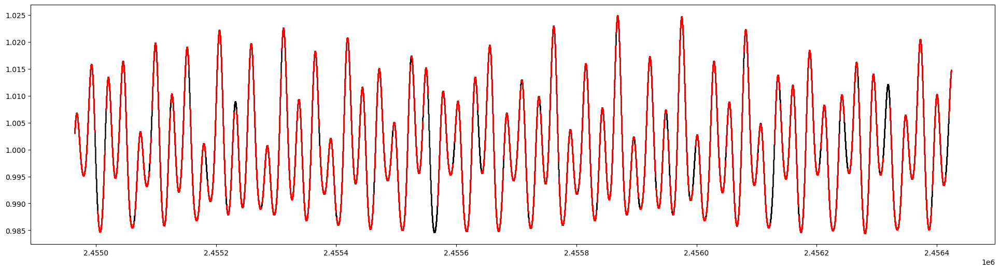

(71422, 4)
(64696, 4)


In [164]:
kepMultiPeriodic_perfect = (1/3.6)*np.ptp(kepler[:,1]) * KB88_noV(t_kepler_perfect,v1=(1./kepler_Prot), v2=(0.48/kepler_Prot),v3=(0.252/kepler_Prot)) + 1
kepMultiPeriodic_gaps = (1/3.6)*np.ptp(kepler[:,1]) * KB88_noV(kepler[:,0],v1=(1./kepler_Prot), v2=(0.48/kepler_Prot),v3=(0.252/kepler_Prot)) + 1

print(np.ptp(kepMultiPeriodic_perfect)/np.ptp(kepler[:,1]))
print(np.median(kepMultiPeriodic_perfect))

fig, ax = plt.subplots(1,1,figsize=(24,6))
ax.plot(t_kepler_perfect, kepMultiPeriodic_perfect, 'k.',ms=1)
ax.plot(kepler[:,0], kepMultiPeriodic_gaps, 'r.',ms=1)
plt.show()

np.random.seed(8421)

kepMultiPeriodic_perfect_noise = kepMultiPeriodic_perfect + np.random.normal(0.,np.median(kepler[:,2]),len(t_kepler_perfect))

kepMultiPeriodic_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                               kepMultiPeriodic_perfect.T,
                                               kepMultiPeriodic_perfect_noise.T,
                                               np.median(kepler[:,2])*np.ones_like(t_kepler_perfect).T)).T
print(np.shape(kepMultiPeriodic_perfect_tosave))
np.savetxt("./data/3_KB88_r/3_KB88r_kepler_perfect.txt",kepMultiPeriodic_perfect_tosave,fmt="%f",header=header)

kepMultiPeriodic_gaps_noise = np.zeros_like(kepMultiPeriodic_gaps)

for i in range(len(kepMultiPeriodic_gaps)):
    kepMultiPeriodic_gaps[i] = kepMultiPeriodic_gaps[i] + np.random.normal(0.,kepler[i,2],1)

kepMultiPeriodic_gaps_tosave = np.vstack((kepler[:,0].T, 
                                              kepMultiPeriodic_gaps.T,
                                              kepMultiPeriodic_gaps_noise.T,
                                              kepler[:,2].T)).T
print(np.shape(kepMultiPeriodic_gaps_tosave))
np.savetxt("./data/3_KB88_r/3_KB88r_kepler_gaps.txt",kepMultiPeriodic_gaps_tosave,fmt="%f",header=header)


0.990421561138818
0.9994038435621851


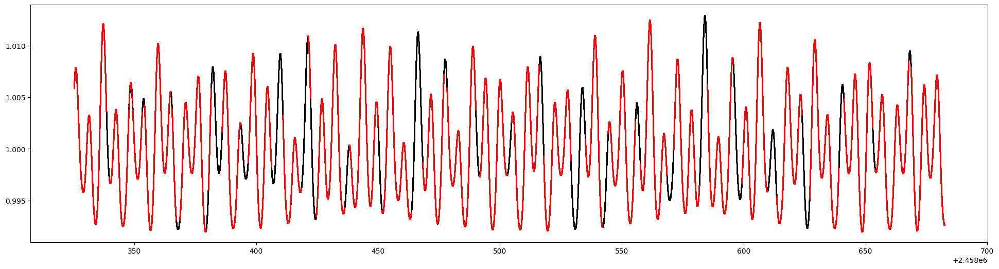

(257062, 4)
(205310, 4)


In [165]:
tessMultiPeriodic_perfect = (1/3.6)*np.ptp(tess[:,1]) * KB88_noV(t_tess_perfect,v1=(1./tess_Prot), v2=(0.48/tess_Prot),v3=(0.252/tess_Prot)) + 1
tessMultiPeriodic_gaps = (1/3.6)*np.ptp(tess[:,1]) * KB88_noV(tess[:,0],v1=(1./tess_Prot), v2=(0.48/tess_Prot),v3=(0.252/tess_Prot)) + 1

print(np.ptp(tessMultiPeriodic_perfect)/np.ptp(tess[:,1]))
print(np.median(tessMultiPeriodic_perfect))

fig, ax = plt.subplots(1,1,figsize=(24,6))
ax.plot(t_tess_perfect, tessMultiPeriodic_perfect, 'k.',ms=1)
ax.plot(tess[:,0], tessMultiPeriodic_gaps, 'r.',ms=1)
plt.show()

np.random.seed(8421)

tessMultiPeriodic_perfect_noise = tessMultiPeriodic_perfect + np.random.normal(0.,np.median(tess[:,2]),len(t_tess_perfect))

tessMultiPeriodic_perfect_tosave = np.vstack((t_tess_perfect.T,
                                               tessMultiPeriodic_perfect.T,
                                               tessMultiPeriodic_perfect_noise.T,
                                               np.median(tess[:,2])*np.ones_like(t_tess_perfect).T)).T
print(np.shape(tessMultiPeriodic_perfect_tosave))
np.savetxt("./data/3_KB88_r/3_KB88r_tess_perfect.txt",tessMultiPeriodic_perfect_tosave,fmt="%f",header=header)

tessMultiPeriodic_gaps_noise = np.zeros_like(tessMultiPeriodic_gaps)

for i in range(len(tessMultiPeriodic_gaps)):
    tessMultiPeriodic_gaps[i] = tessMultiPeriodic_gaps[i] + np.random.normal(0.,tess[i,2],1)

tessMultiPeriodic_gaps_tosave = np.vstack((tess[:,0].T, 
                                              tessMultiPeriodic_gaps.T,
                                              tessMultiPeriodic_gaps_noise.T,
                                              tess[:,2].T)).T
print(np.shape(tessMultiPeriodic_gaps_tosave))
np.savetxt("./data/3_KB88_r/3_KB88r_tess_gaps.txt",tessMultiPeriodic_gaps_tosave,fmt="%f",header=header)


# 4. Rössler x,y,z

In [13]:
a=0.2
b=0.2
c=5.7

fp1, fp2 = sp.Rossler_FPs(a=0.2,b=0.2,c=5.7)
print(fp1)
print(fp2)

[  5.6929738  -28.46486898  28.46486898]
[ 0.0070262  -0.03513102  0.03513102]


In [14]:
#r0 = np.array((1.,1.,1.))
# just in case, to avoid transients, choose as IC the 5000th iteration of the above IC
r0 = np.array((-7.06916283,  0.71266172,  0.01578853))

# fixed point experiment 
# need to do it this way because it's very very sensitive to ICs. truncation error is enough to ruin it
# (both unstable! trajectories roll off and down to the attractor.)
fp1_x = 5.6929738
fp1_y = -28.46486898
fp1_z = 28.46486898
#r0 = np.array((fp1_x, fp1_y, fp1_z))

fp2_x = 0.0070262
fp2_y = -0.03513102
fp2_z = 0.03513102
#r0 = np.array((fp2_x, fp2_y, fp2_z))

dt = 0.005
tmin = -100.
tmax = 100.
baseline = tmax - tmin
Nsteps = int(baseline/dt)

rossler = RK45(fun=sp.Rossler_vel,t0=tmin,y0=r0,max_step=dt,t_bound=10000.)

rossler_r = np.empty((Nsteps,3))
rossler_t = np.empty((Nsteps))
for i in range(Nsteps):
    rossler.step()
    rossler_t[i] = rossler.t
    rossler_r[i] = rossler.y
    
    
qp_x = sp.estimateQuasiPeriod(np.atleast_2d(rossler_t).T, rossler_r[:,0])
qp_x_days = qp_x*dt

qp_y = sp.estimateQuasiPeriod(np.atleast_2d(rossler_t).T, rossler_r[:,1])
qp_y_days = qp_y*dt

qp_z = sp.estimateQuasiPeriod(np.atleast_2d(rossler_t).T, rossler_r[:,2])
qp_z_days = qp_z*dt

print(qp_x_days)
print(qp_y_days)
print(qp_z_days)
print(np.median(rossler_t[1:]-rossler_t[:-1]))

max_qp = np.max(np.array((qp_x,qp_y,qp_z)))
print(max_qp)

6.2700000000000005
6.28
5.86
0.004999999999999005
1256


## Speculoos

321.23592177166347
1254
1256
1172
1256
137.34008992886223
31.84713375796178
172499


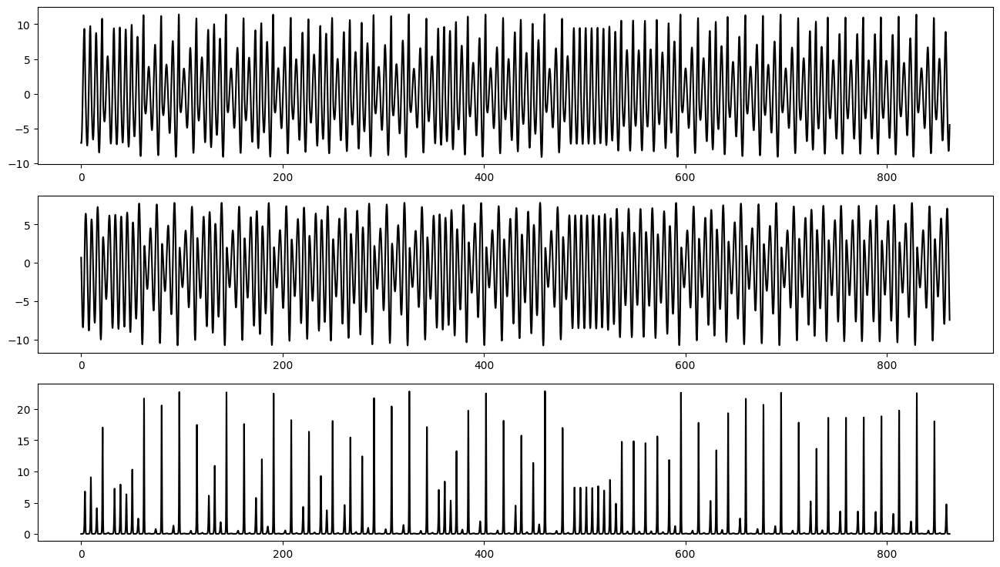

172499
44119
0.0001693139670362064
172499
2458216.471464
2458245.677784686
2458216.471464
2458245.677954


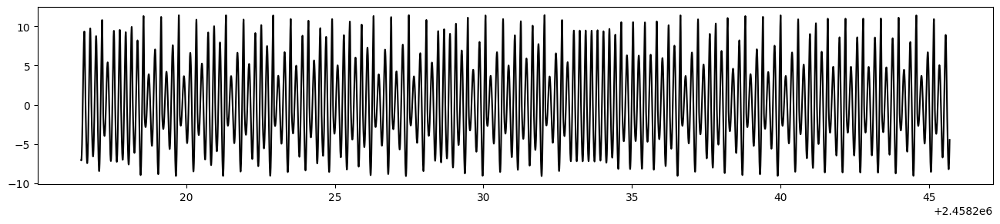

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


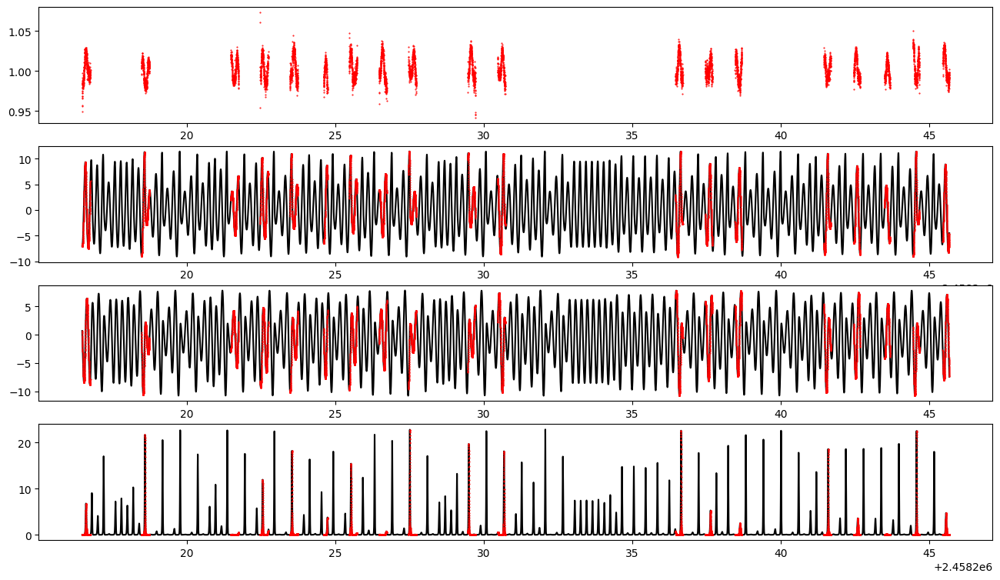

In [15]:
print(speculoos_Prot/speculoos_trunc_cad) 
print(qp_x)
print(qp_y)
print(qp_z)

print(max_qp)

print((speculoos_trunc[-1,0] - speculoos_trunc[0,0])/speculoos_Prot)
print(len(rossler_t)/max_qp)

#so we need ~321 data points per period, and we need to integrate for ~137 periods.
# fine to integrate at this higher cadence, can downsample later.
new_Nsteps = int(((speculoos_trunc[-1,0] - speculoos_trunc[0,0])*max_qp)/speculoos_Prot)
print(new_Nsteps)

rossler = RK45(fun=sp.Rossler_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

rossler_r = np.empty((new_Nsteps,3))
rossler_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    rossler.step()
    rossler_t[i] = rossler.t
    rossler_r[i] = rossler.y
    


fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(rossler_t, rossler_r[:,i], 'k-')
plt.show()
print(len(rossler_t))
print(len(t_speculoos_trunc_perfect))

new_dt =  (speculoos_trunc[-1,0] - speculoos_trunc[0,0])/len(rossler_t)
print(new_dt)
test = np.arange(len(rossler_t))*new_dt
print(len(test))

#rescale time
rossler_t_rescaled = speculoos_trunc[0,0] + np.arange(len(rossler_t))*new_dt
print(rossler_t_rescaled[0])
print(rossler_t_rescaled[-1])

print(speculoos_trunc[0,0])
print(speculoos_trunc[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(rossler_t_rescaled, rossler_r[:,0], 'k-')
plt.show()

rossler_x_speculoos_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,0], yerr_orig=np.ones_like(rossler_r[:,0]), t_new=t_speculoos_trunc_perfect)
rossler_x_speculoos_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,0], yerr_orig=np.ones_like(rossler_r[:,0]), t_new=speculoos_trunc[:,0])

rossler_y_speculoos_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,1], yerr_orig=np.ones_like(rossler_r[:,1]), t_new=t_speculoos_trunc_perfect)
rossler_y_speculoos_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,1], yerr_orig=np.ones_like(rossler_r[:,1]), t_new=speculoos_trunc[:,0])

rossler_z_speculoos_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,2], yerr_orig=np.ones_like(rossler_r[:,2]), t_new=t_speculoos_trunc_perfect)
rossler_z_speculoos_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,2], yerr_orig=np.ones_like(rossler_r[:,2]), t_new=speculoos_trunc[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(speculoos_trunc[:,0],speculoos_trunc[:,1],'r.',ms=1)
axes[1].plot(t_speculoos_trunc_perfect, rossler_x_speculoos_perfect, 'k-')
axes[1].plot(speculoos_trunc[:,0], rossler_x_speculoos_gaps, 'r.',ms=1)
axes[2].plot(t_speculoos_trunc_perfect, rossler_y_speculoos_perfect, 'k-')
axes[2].plot(speculoos_trunc[:,0], rossler_y_speculoos_gaps, 'r.',ms=1)
axes[3].plot(t_speculoos_trunc_perfect, rossler_z_speculoos_perfect, 'k-')
axes[3].plot(speculoos_trunc[:,0], rossler_z_speculoos_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(speculoos_trunc[:,2]) * (np.ptp(rossler_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))
unc_to_add_y = np.median(speculoos_trunc[:,2]) * (np.ptp(rossler_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))
unc_to_add_z = np.median(speculoos_trunc[:,2]) * (np.ptp(rossler_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))

In [16]:
np.random.seed(8421)

rossler_x_speculoos_perfect_noise = rossler_x_speculoos_perfect + np.random.normal(0.,unc_to_add_x,len(t_speculoos_trunc_perfect))
rossler_y_speculoos_perfect_noise = rossler_y_speculoos_perfect + np.random.normal(0.,unc_to_add_y,len(t_speculoos_trunc_perfect))
rossler_z_speculoos_perfect_noise = rossler_z_speculoos_perfect + np.random.normal(0.,unc_to_add_z,len(t_speculoos_trunc_perfect))

rossler_x_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                rossler_x_speculoos_perfect.T,
                                                rossler_x_speculoos_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_speculoos_trunc_perfect).T)).T
rossler_y_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                rossler_y_speculoos_perfect.T,
                                                rossler_y_speculoos_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_speculoos_trunc_perfect).T)).T
rossler_z_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                rossler_z_speculoos_perfect.T,
                                                rossler_z_speculoos_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_speculoos_trunc_perfect).T)).T

print(np.shape(rossler_x_speculoos_perfect_tosave))
print(np.shape(rossler_y_speculoos_perfect_tosave))
print(np.shape(rossler_z_speculoos_perfect_tosave))
np.savetxt("./data/4_rossler/4_rossler_x_speculoos_perfect.txt",rossler_x_speculoos_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_y_speculoos_perfect.txt",rossler_y_speculoos_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_z_speculoos_perfect.txt",rossler_z_speculoos_perfect_tosave,fmt="%f",header=header)

rossler_x_speculoos_gaps_noise = np.zeros_like(rossler_x_speculoos_gaps)
rossler_y_speculoos_gaps_noise = np.zeros_like(rossler_y_speculoos_gaps)
rossler_z_speculoos_gaps_noise = np.zeros_like(rossler_z_speculoos_gaps)

for i in range(len(rossler_x_speculoos_gaps_noise)):
    rossler_x_speculoos_gaps_noise[i] = rossler_x_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(rossler_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)
    rossler_y_speculoos_gaps_noise[i] = rossler_y_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(rossler_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)
    rossler_z_speculoos_gaps_noise[i] = rossler_z_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(rossler_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)

rossler_x_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             rossler_x_speculoos_gaps.T,
                                             rossler_x_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(rossler_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T
rossler_y_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             rossler_y_speculoos_gaps.T,
                                             rossler_y_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(rossler_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T
rossler_z_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             rossler_z_speculoos_gaps.T,
                                             rossler_z_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(rossler_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T

print(np.shape(rossler_x_speculoos_gaps_tosave))
print(np.shape(rossler_y_speculoos_gaps_tosave))
print(np.shape(rossler_z_speculoos_gaps_tosave))
np.savetxt("./data/4_rossler/4_rossler_x_speculoos_gaps.txt",rossler_x_speculoos_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_y_speculoos_gaps.txt",rossler_y_speculoos_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_z_speculoos_gaps.txt",rossler_z_speculoos_gaps_tosave,fmt="%f",header=header)


(44119, 4)
(44119, 4)
(44119, 4)
(6758, 4)
(6758, 4)
(6758, 4)


## Kepler

69077


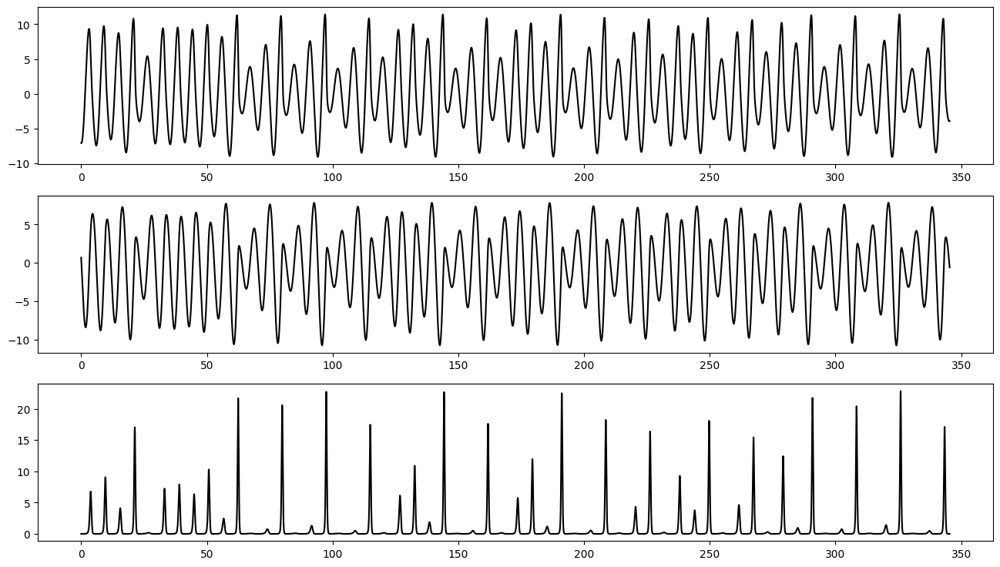

69077
71422
0.02112754847488491
69077
2454964.553195
2456423.9597334513
2454964.553195
2456423.980861


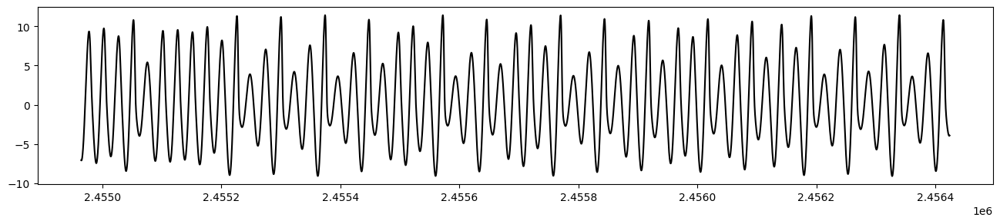

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


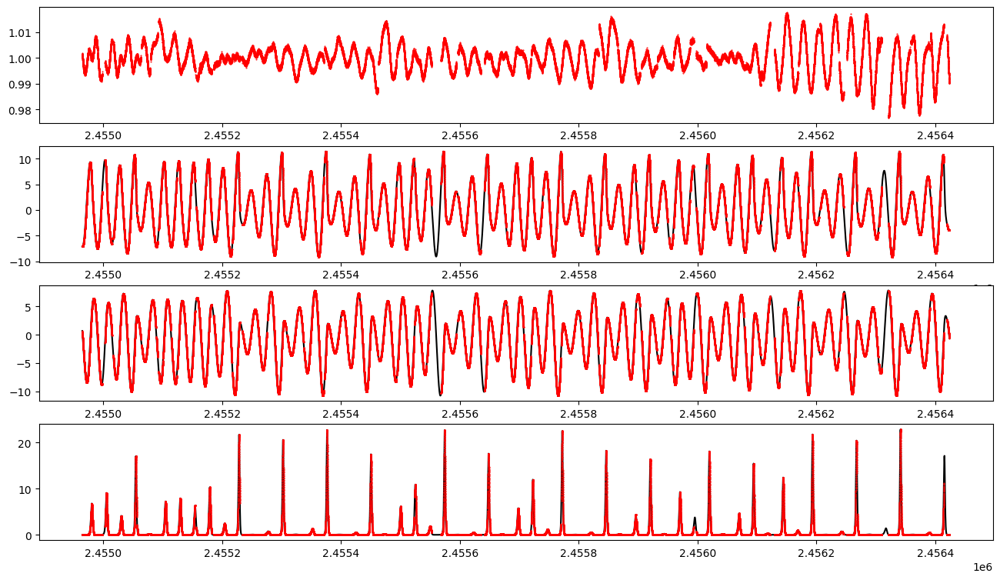

In [17]:
new_Nsteps = int(((kepler[-1,0] - kepler[0,0])*max_qp)/kepler_Prot)
print(new_Nsteps)

rossler = RK45(fun=sp.Rossler_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

rossler_r = np.empty((new_Nsteps,3))
rossler_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    rossler.step()
    rossler_t[i] = rossler.t
    rossler_r[i] = rossler.y
    


fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(rossler_t, rossler_r[:,i], 'k-')
plt.show()
print(len(rossler_t))
print(len(t_kepler_perfect))

new_dt =  (kepler[-1,0] - kepler[0,0])/len(rossler_t)
print(new_dt)
test = np.arange(len(rossler_t))*new_dt
print(len(test))

#rescale time
rossler_t_rescaled = kepler[0,0] + np.arange(len(rossler_t))*new_dt
print(rossler_t_rescaled[0])
print(rossler_t_rescaled[-1])

print(kepler[0,0])
print(kepler[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(rossler_t_rescaled, rossler_r[:,0], 'k-')
plt.show()

rossler_x_kepler_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,0], yerr_orig=np.ones_like(rossler_r[:,0]), t_new=t_kepler_perfect)
rossler_x_kepler_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,0], yerr_orig=np.ones_like(rossler_r[:,0]), t_new=kepler[:,0])

rossler_y_kepler_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,1], yerr_orig=np.ones_like(rossler_r[:,1]), t_new=t_kepler_perfect)
rossler_y_kepler_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,1], yerr_orig=np.ones_like(rossler_r[:,1]), t_new=kepler[:,0])

rossler_z_kepler_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,2], yerr_orig=np.ones_like(rossler_r[:,2]), t_new=t_kepler_perfect)
rossler_z_kepler_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,2], yerr_orig=np.ones_like(rossler_r[:,2]), t_new=kepler[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(kepler[:,0],kepler[:,1],'r.',ms=1)
axes[1].plot(t_kepler_perfect, rossler_x_kepler_perfect, 'k-')
axes[1].plot(kepler[:,0], rossler_x_kepler_gaps, 'r.',ms=1)
axes[2].plot(t_kepler_perfect, rossler_y_kepler_perfect, 'k-')
axes[2].plot(kepler[:,0], rossler_y_kepler_gaps, 'r.',ms=1)
axes[3].plot(t_kepler_perfect, rossler_z_kepler_perfect, 'k-')
axes[3].plot(kepler[:,0], rossler_z_kepler_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(kepler[:,2]) * (np.ptp(rossler_x_kepler_perfect)/np.ptp(kepler[:,1]))
unc_to_add_y = np.median(kepler[:,2]) * (np.ptp(rossler_y_kepler_perfect)/np.ptp(kepler[:,1]))
unc_to_add_z = np.median(kepler[:,2]) * (np.ptp(rossler_z_kepler_perfect)/np.ptp(kepler[:,1]))

In [18]:
np.random.seed(8421)

rossler_x_kepler_perfect_noise = rossler_x_kepler_perfect + np.random.normal(0.,unc_to_add_x,len(t_kepler_perfect))
rossler_y_kepler_perfect_noise = rossler_y_kepler_perfect + np.random.normal(0.,unc_to_add_y,len(t_kepler_perfect))
rossler_z_kepler_perfect_noise = rossler_z_kepler_perfect + np.random.normal(0.,unc_to_add_z,len(t_kepler_perfect))

rossler_x_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                rossler_x_kepler_perfect.T,
                                                rossler_x_kepler_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_kepler_perfect).T)).T
rossler_y_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                rossler_y_kepler_perfect.T,
                                                rossler_y_kepler_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_kepler_perfect).T)).T
rossler_z_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                rossler_z_kepler_perfect.T,
                                                rossler_z_kepler_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_kepler_perfect).T)).T

print(np.shape(rossler_x_kepler_perfect_tosave))
print(np.shape(rossler_y_kepler_perfect_tosave))
print(np.shape(rossler_z_kepler_perfect_tosave))
np.savetxt("./data/4_rossler/4_rossler_x_kepler_perfect.txt",rossler_x_kepler_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_y_kepler_perfect.txt",rossler_y_kepler_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_z_kepler_perfect.txt",rossler_z_kepler_perfect_tosave,fmt="%f",header=header)

rossler_x_kepler_gaps_noise = np.zeros_like(rossler_x_kepler_gaps)
rossler_y_kepler_gaps_noise = np.zeros_like(rossler_y_kepler_gaps)
rossler_z_kepler_gaps_noise = np.zeros_like(rossler_z_kepler_gaps)

for i in range(len(rossler_x_kepler_gaps_noise)):
    rossler_x_kepler_gaps_noise[i] = rossler_x_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(rossler_x_kepler_perfect)/np.ptp(kepler[:,1])),1)
    rossler_y_kepler_gaps_noise[i] = rossler_y_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(rossler_y_kepler_perfect)/np.ptp(kepler[:,1])),1)
    rossler_z_kepler_gaps_noise[i] = rossler_z_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(rossler_z_kepler_perfect)/np.ptp(kepler[:,1])),1)

rossler_x_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             rossler_x_kepler_gaps.T,
                                             rossler_x_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(rossler_x_kepler_perfect)/np.ptp(kepler[:,1])).T)).T
rossler_y_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             rossler_y_kepler_gaps.T,
                                             rossler_y_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(rossler_y_kepler_perfect)/np.ptp(kepler[:,1])).T)).T
rossler_z_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             rossler_z_kepler_gaps.T,
                                             rossler_z_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(rossler_z_kepler_perfect)/np.ptp(kepler[:,1])).T)).T

print(np.shape(rossler_x_kepler_gaps_tosave))
print(np.shape(rossler_y_kepler_gaps_tosave))
print(np.shape(rossler_z_kepler_gaps_tosave))
np.savetxt("./data/4_rossler/4_rossler_x_kepler_gaps.txt",rossler_x_kepler_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_y_kepler_gaps.txt",rossler_y_kepler_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_z_kepler_gaps.txt",rossler_z_kepler_gaps_tosave,fmt="%f",header=header)


(71422, 4)
(71422, 4)
(71422, 4)
(64696, 4)
(64696, 4)
(64696, 4)


## TESS

79880


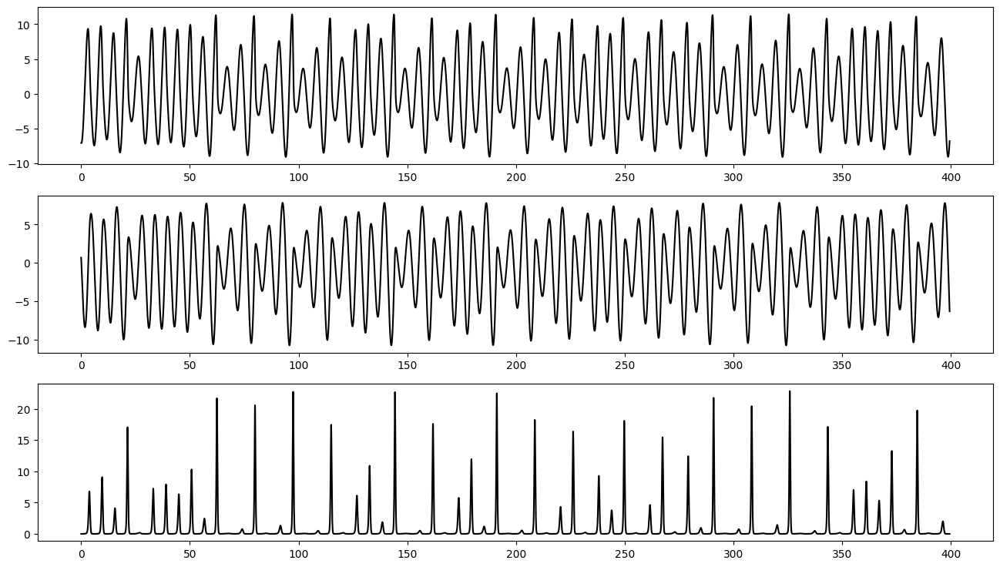

79880
257062
0.0044699328868292205
79880
2458325.297928
2458682.351697067
2458325.297928
2458682.356167


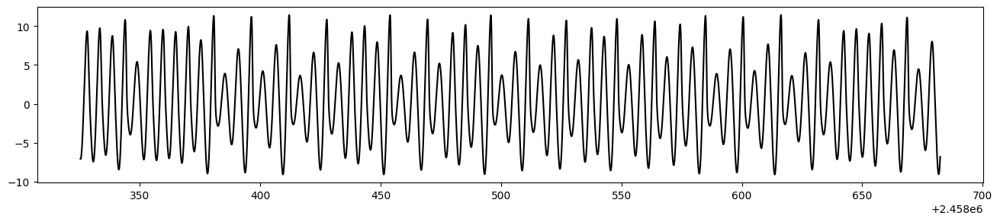

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


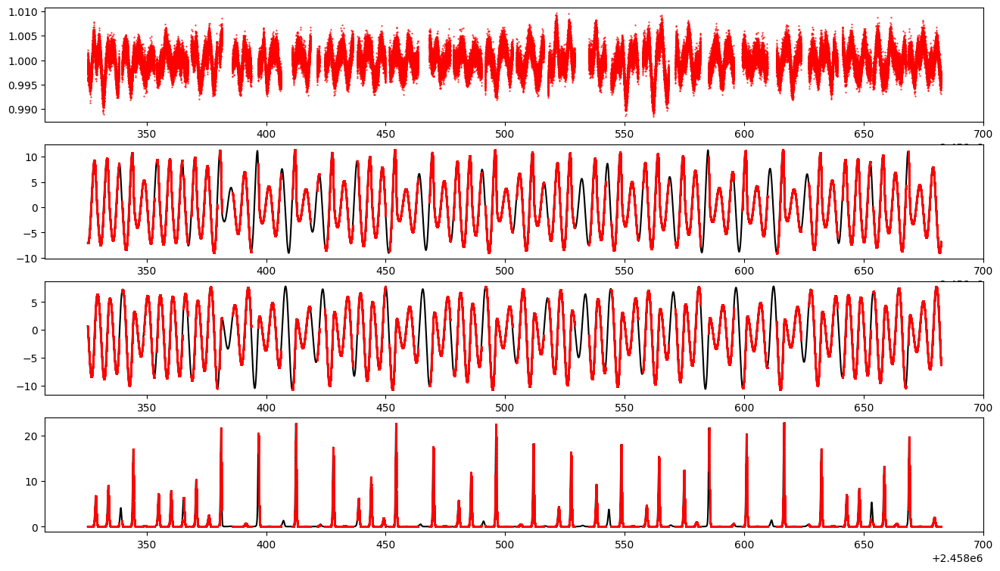

In [19]:
new_Nsteps = int(((tess[-1,0] - tess[0,0])*max_qp)/tess_Prot)
print(new_Nsteps)

rossler = RK45(fun=sp.Rossler_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

rossler_r = np.empty((new_Nsteps,3))
rossler_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    rossler.step()
    rossler_t[i] = rossler.t
    rossler_r[i] = rossler.y
    


fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(rossler_t, rossler_r[:,i], 'k-')
plt.show()
print(len(rossler_t))
print(len(t_tess_perfect))

new_dt =  (tess[-1,0] - tess[0,0])/len(rossler_t)
print(new_dt)
test = np.arange(len(rossler_t))*new_dt
print(len(test))

#rescale time
rossler_t_rescaled = tess[0,0] + np.arange(len(rossler_t))*new_dt
print(rossler_t_rescaled[0])
print(rossler_t_rescaled[-1])

print(tess[0,0])
print(tess[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(rossler_t_rescaled, rossler_r[:,0], 'k-')
plt.show()

rossler_x_tess_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,0], yerr_orig=np.ones_like(rossler_r[:,0]), t_new=t_tess_perfect)
rossler_x_tess_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,0], yerr_orig=np.ones_like(rossler_r[:,0]), t_new=tess[:,0])

rossler_y_tess_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,1], yerr_orig=np.ones_like(rossler_r[:,1]), t_new=t_tess_perfect)
rossler_y_tess_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,1], yerr_orig=np.ones_like(rossler_r[:,1]), t_new=tess[:,0])

rossler_z_tess_perfect, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,2], yerr_orig=np.ones_like(rossler_r[:,2]), t_new=t_tess_perfect)
rossler_z_tess_gaps, blah = resample_time_series(t_orig=rossler_t_rescaled, y_orig=rossler_r[:,2], yerr_orig=np.ones_like(rossler_r[:,2]), t_new=tess[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(tess[:,0],tess[:,1],'r.',ms=1)
axes[1].plot(t_tess_perfect, rossler_x_tess_perfect, 'k-')
axes[1].plot(tess[:,0], rossler_x_tess_gaps, 'r.',ms=1)
axes[2].plot(t_tess_perfect, rossler_y_tess_perfect, 'k-')
axes[2].plot(tess[:,0], rossler_y_tess_gaps, 'r.',ms=1)
axes[3].plot(t_tess_perfect, rossler_z_tess_perfect, 'k-')
axes[3].plot(tess[:,0], rossler_z_tess_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(tess[:,2]) * (np.ptp(rossler_x_tess_perfect)/np.ptp(tess[:,1]))
unc_to_add_y = np.median(tess[:,2]) * (np.ptp(rossler_y_tess_perfect)/np.ptp(tess[:,1]))
unc_to_add_z = np.median(tess[:,2]) * (np.ptp(rossler_z_tess_perfect)/np.ptp(tess[:,1]))

In [20]:
np.random.seed(8421)

rossler_x_tess_perfect_noise = rossler_x_tess_perfect + np.random.normal(0.,unc_to_add_x,len(t_tess_perfect))
rossler_y_tess_perfect_noise = rossler_y_tess_perfect + np.random.normal(0.,unc_to_add_y,len(t_tess_perfect))
rossler_z_tess_perfect_noise = rossler_z_tess_perfect + np.random.normal(0.,unc_to_add_z,len(t_tess_perfect))

rossler_x_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                rossler_x_tess_perfect.T,
                                                rossler_x_tess_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_tess_perfect).T)).T
rossler_y_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                rossler_y_tess_perfect.T,
                                                rossler_y_tess_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_tess_perfect).T)).T
rossler_z_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                rossler_z_tess_perfect.T,
                                                rossler_z_tess_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_tess_perfect).T)).T

print(np.shape(rossler_x_tess_perfect_tosave))
print(np.shape(rossler_y_tess_perfect_tosave))
print(np.shape(rossler_z_tess_perfect_tosave))
np.savetxt("./data/4_rossler/4_rossler_x_tess_perfect.txt",rossler_x_tess_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_y_tess_perfect.txt",rossler_y_tess_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_z_tess_perfect.txt",rossler_z_tess_perfect_tosave,fmt="%f",header=header)

rossler_x_tess_gaps_noise = np.zeros_like(rossler_x_tess_gaps)
rossler_y_tess_gaps_noise = np.zeros_like(rossler_y_tess_gaps)
rossler_z_tess_gaps_noise = np.zeros_like(rossler_z_tess_gaps)

for i in range(len(rossler_x_tess_gaps_noise)):
    rossler_x_tess_gaps_noise[i] = rossler_x_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(rossler_x_tess_perfect)/np.ptp(tess[:,1])),1)
    rossler_y_tess_gaps_noise[i] = rossler_y_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(rossler_y_tess_perfect)/np.ptp(tess[:,1])),1)
    rossler_z_tess_gaps_noise[i] = rossler_z_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(rossler_z_tess_perfect)/np.ptp(tess[:,1])),1)

rossler_x_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             rossler_x_tess_gaps.T,
                                             rossler_x_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(rossler_x_tess_perfect)/np.ptp(tess[:,1])).T)).T
rossler_y_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             rossler_y_tess_gaps.T,
                                             rossler_y_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(rossler_y_tess_perfect)/np.ptp(tess[:,1])).T)).T
rossler_z_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             rossler_z_tess_gaps.T,
                                             rossler_z_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(rossler_z_tess_perfect)/np.ptp(tess[:,1])).T)).T

print(np.shape(rossler_x_tess_gaps_tosave))
print(np.shape(rossler_y_tess_gaps_tosave))
print(np.shape(rossler_z_tess_gaps_tosave))
np.savetxt("./data/4_rossler/4_rossler_x_tess_gaps.txt",rossler_x_tess_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_y_tess_gaps.txt",rossler_y_tess_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/4_rossler/4_rossler_z_tess_gaps.txt",rossler_z_tess_gaps_tosave,fmt="%f",header=header)


(257062, 4)
(257062, 4)
(257062, 4)
(205310, 4)
(205310, 4)
(205310, 4)


# 5. Transformed Rössler x,y,z

In [21]:
rossler_fp1 = np.array((0.0070262, -0.03513102, 0.03513102)) # central. strongly attractive in z, repulsive spiral in x, y
rossler_fp2 = np.array((5.6929738, -28.46486898, 28.46486898)) # outlying. repulsive in z, weak attractive spiral in x,y

transformed_rossler_fp1 = (1./np.sqrt(2))*np.array((rossler_fp1[1] + rossler_fp1[2], rossler_fp1[2] + rossler_fp1[0], rossler_fp1[0] + rossler_fp1[1]))
transformed_rossler_fp2 = (1./np.sqrt(2))*np.array((rossler_fp2[1] + rossler_fp2[2], rossler_fp2[2] + rossler_fp2[0], rossler_fp2[0] + rossler_fp2[1]))


#r0 = (1.,1.,1.)
# just in case, to avoid transients, choose as IC the 5000th iteration of the above IC
r0 = np.array((3.6162099,  -5.17683558, -1.58314013))

# fixed point experiment
# need to do it this way because it's very very sensitive to ICs. truncation error is enough to ruin it
# (both unstable! trajectories roll off and down to the attractor.)
fp1_x = 5.6929738
fp1_y = -28.46486898
fp1_z = 28.46486898
#r0 = (1./np.sqrt(2))*np.array((fp1_y + fp1_z, fp1_x+fp1_z, fp1_x+fp1_y))

fp2_x = 0.0070262
fp2_y = -0.03513102
fp2_z = 0.03513102
#r0 = (1./np.sqrt(2))*np.array((fp2_y + fp2_z, fp2_x+fp2_z, fp2_x+fp2_y))

dt = 0.005
tmin = -100.
tmax = 100.
baseline = tmax - tmin
Nsteps = int(baseline/dt)

transformed_rossler = RK45(fun=sp.transformed_Rossler_vel,t0=tmin,y0=r0,max_step=dt,t_bound=10000.)

transformed_rossler_r = np.empty((Nsteps,3))
transformed_rossler_t = np.empty((Nsteps))
for i in range(Nsteps):
    transformed_rossler.step()
    transformed_rossler_t[i] = transformed_rossler.t
    transformed_rossler_r[i] = transformed_rossler.y

qp_x = sp.estimateQuasiPeriod(np.atleast_2d(transformed_rossler_t).T, transformed_rossler_r[:,0])
qp_x_days = qp_x*dt

qp_y = sp.estimateQuasiPeriod(np.atleast_2d(transformed_rossler_t).T, transformed_rossler_r[:,1])
qp_y_days = qp_y*dt

qp_z = sp.estimateQuasiPeriod(np.atleast_2d(transformed_rossler_t).T, transformed_rossler_r[:,2])
qp_z_days = qp_z*dt

print(qp_x_days)
print(qp_y_days)
print(qp_z_days)
print(np.median(transformed_rossler_t[1:]-transformed_rossler_t[:-1]))

max_qp = np.max(np.array((qp_x,qp_y,qp_z)))
print(max_qp)

6.255
6.285
6.275
0.004999999999999005
1257


## Speculoos

172636


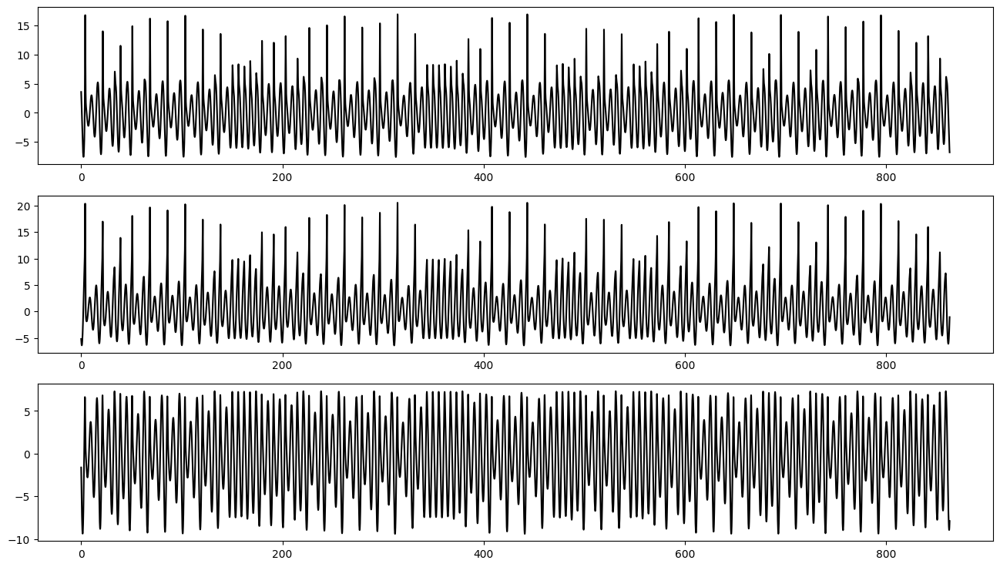

172636
44119
2458216.471464
2458245.6777848206
2458216.471464
2458245.677954


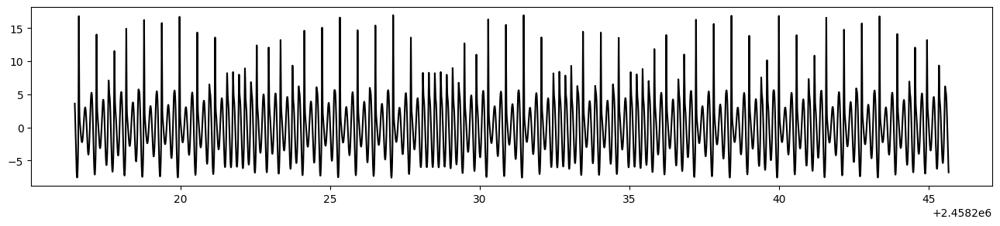

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


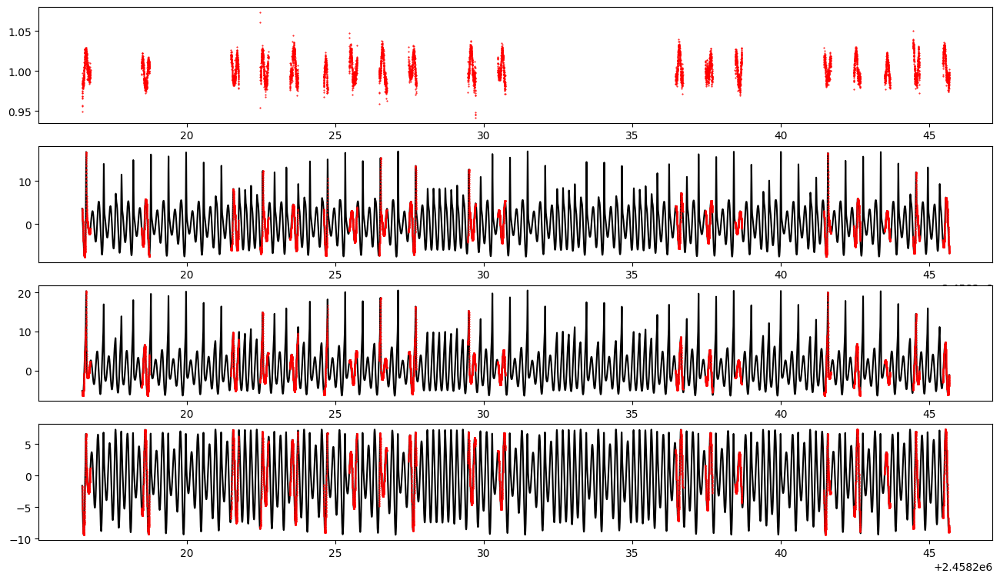

In [22]:
new_Nsteps = int(((speculoos_trunc[-1,0] - speculoos_trunc[0,0])*max_qp)/speculoos_Prot)
print(new_Nsteps)

transformed_rossler = RK45(fun=sp.transformed_Rossler_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

transformed_rossler_r = np.empty((new_Nsteps,3))
transformed_rossler_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    transformed_rossler.step()
    transformed_rossler_t[i] = transformed_rossler.t
    transformed_rossler_r[i] = transformed_rossler.y
    

fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(transformed_rossler_t, transformed_rossler_r[:,i], 'k-')
plt.show()
print(len(transformed_rossler_t))
print(len(t_speculoos_trunc_perfect))

new_dt =  (speculoos_trunc[-1,0] - speculoos_trunc[0,0])/len(transformed_rossler_t)

#rescale time
transformed_rossler_t_rescaled = speculoos_trunc[0,0] + np.arange(len(transformed_rossler_t))*new_dt
print(transformed_rossler_t_rescaled[0])
print(transformed_rossler_t_rescaled[-1])

print(speculoos_trunc[0,0])
print(speculoos_trunc[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(transformed_rossler_t_rescaled, transformed_rossler_r[:,0], 'k-')
plt.show()

transformed_rossler_x_speculoos_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,0], yerr_orig=np.ones_like(transformed_rossler_r[:,0]), t_new=t_speculoos_trunc_perfect)
transformed_rossler_x_speculoos_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,0], yerr_orig=np.ones_like(transformed_rossler_r[:,0]), t_new=speculoos_trunc[:,0])

transformed_rossler_y_speculoos_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,1], yerr_orig=np.ones_like(transformed_rossler_r[:,1]), t_new=t_speculoos_trunc_perfect)
transformed_rossler_y_speculoos_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,1], yerr_orig=np.ones_like(transformed_rossler_r[:,1]), t_new=speculoos_trunc[:,0])

transformed_rossler_z_speculoos_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,2], yerr_orig=np.ones_like(transformed_rossler_r[:,2]), t_new=t_speculoos_trunc_perfect)
transformed_rossler_z_speculoos_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,2], yerr_orig=np.ones_like(transformed_rossler_r[:,2]), t_new=speculoos_trunc[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(speculoos_trunc[:,0],speculoos_trunc[:,1],'r.',ms=1)
axes[1].plot(t_speculoos_trunc_perfect, transformed_rossler_x_speculoos_perfect, 'k-')
axes[1].plot(speculoos_trunc[:,0], transformed_rossler_x_speculoos_gaps, 'r.',ms=1)
axes[2].plot(t_speculoos_trunc_perfect, transformed_rossler_y_speculoos_perfect, 'k-')
axes[2].plot(speculoos_trunc[:,0], transformed_rossler_y_speculoos_gaps, 'r.',ms=1)
axes[3].plot(t_speculoos_trunc_perfect, transformed_rossler_z_speculoos_perfect, 'k-')
axes[3].plot(speculoos_trunc[:,0], transformed_rossler_z_speculoos_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(speculoos_trunc[:,2]) * (np.ptp(transformed_rossler_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))
unc_to_add_y = np.median(speculoos_trunc[:,2]) * (np.ptp(transformed_rossler_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))
unc_to_add_z = np.median(speculoos_trunc[:,2]) * (np.ptp(transformed_rossler_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))

In [23]:
np.random.seed(8421)

transformed_rossler_x_speculoos_perfect_noise = transformed_rossler_x_speculoos_perfect + np.random.normal(0.,unc_to_add_x,len(t_speculoos_trunc_perfect))
transformed_rossler_y_speculoos_perfect_noise = transformed_rossler_y_speculoos_perfect + np.random.normal(0.,unc_to_add_y,len(t_speculoos_trunc_perfect))
transformed_rossler_z_speculoos_perfect_noise = transformed_rossler_z_speculoos_perfect + np.random.normal(0.,unc_to_add_z,len(t_speculoos_trunc_perfect))

transformed_rossler_x_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                transformed_rossler_x_speculoos_perfect.T,
                                                transformed_rossler_x_speculoos_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_speculoos_trunc_perfect).T)).T
transformed_rossler_y_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                transformed_rossler_y_speculoos_perfect.T,
                                                transformed_rossler_y_speculoos_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_speculoos_trunc_perfect).T)).T
transformed_rossler_z_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                transformed_rossler_z_speculoos_perfect.T,
                                                transformed_rossler_z_speculoos_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_speculoos_trunc_perfect).T)).T

print(np.shape(transformed_rossler_x_speculoos_perfect_tosave))
print(np.shape(transformed_rossler_y_speculoos_perfect_tosave))
print(np.shape(transformed_rossler_z_speculoos_perfect_tosave))
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_x_speculoos_perfect.txt",transformed_rossler_x_speculoos_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_y_speculoos_perfect.txt",transformed_rossler_y_speculoos_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_z_speculoos_perfect.txt",transformed_rossler_z_speculoos_perfect_tosave,fmt="%f",header=header)

transformed_rossler_x_speculoos_gaps_noise = np.zeros_like(transformed_rossler_x_speculoos_gaps)
transformed_rossler_y_speculoos_gaps_noise = np.zeros_like(transformed_rossler_y_speculoos_gaps)
transformed_rossler_z_speculoos_gaps_noise = np.zeros_like(transformed_rossler_z_speculoos_gaps)

for i in range(len(transformed_rossler_x_speculoos_gaps_noise)):
    transformed_rossler_x_speculoos_gaps_noise[i] = transformed_rossler_x_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(transformed_rossler_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)
    transformed_rossler_y_speculoos_gaps_noise[i] = transformed_rossler_y_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(transformed_rossler_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)
    transformed_rossler_z_speculoos_gaps_noise[i] = transformed_rossler_z_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(transformed_rossler_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)

transformed_rossler_x_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             transformed_rossler_x_speculoos_gaps.T,
                                             transformed_rossler_x_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(transformed_rossler_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T
transformed_rossler_y_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             transformed_rossler_y_speculoos_gaps.T,
                                             transformed_rossler_y_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(transformed_rossler_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T
transformed_rossler_z_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             transformed_rossler_z_speculoos_gaps.T,
                                             transformed_rossler_z_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(transformed_rossler_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T

print(np.shape(transformed_rossler_x_speculoos_gaps_tosave))
print(np.shape(transformed_rossler_y_speculoos_gaps_tosave))
print(np.shape(transformed_rossler_z_speculoos_gaps_tosave))
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_x_speculoos_gaps.txt",transformed_rossler_x_speculoos_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_y_speculoos_gaps.txt",transformed_rossler_y_speculoos_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_z_speculoos_gaps.txt",transformed_rossler_z_speculoos_gaps_tosave,fmt="%f",header=header)


(44119, 4)
(44119, 4)
(44119, 4)
(6758, 4)
(6758, 4)
(6758, 4)


## Kepler

69132


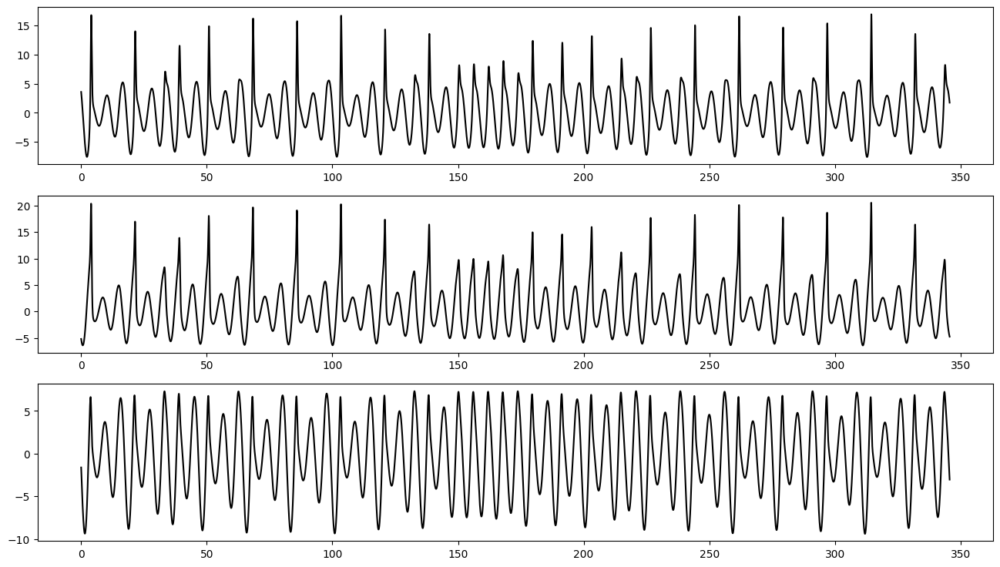

69132
71422
2454964.553195
2456423.9597502598
2454964.553195
2456423.980861


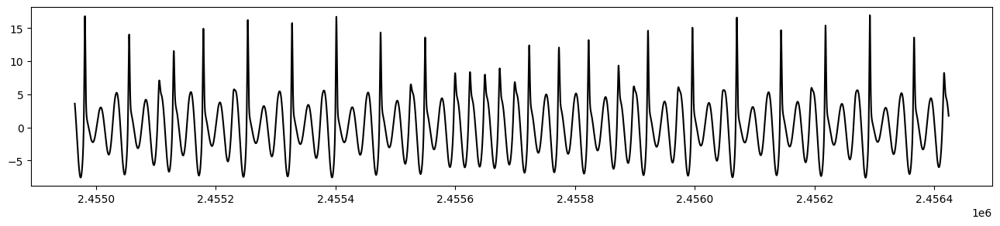

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


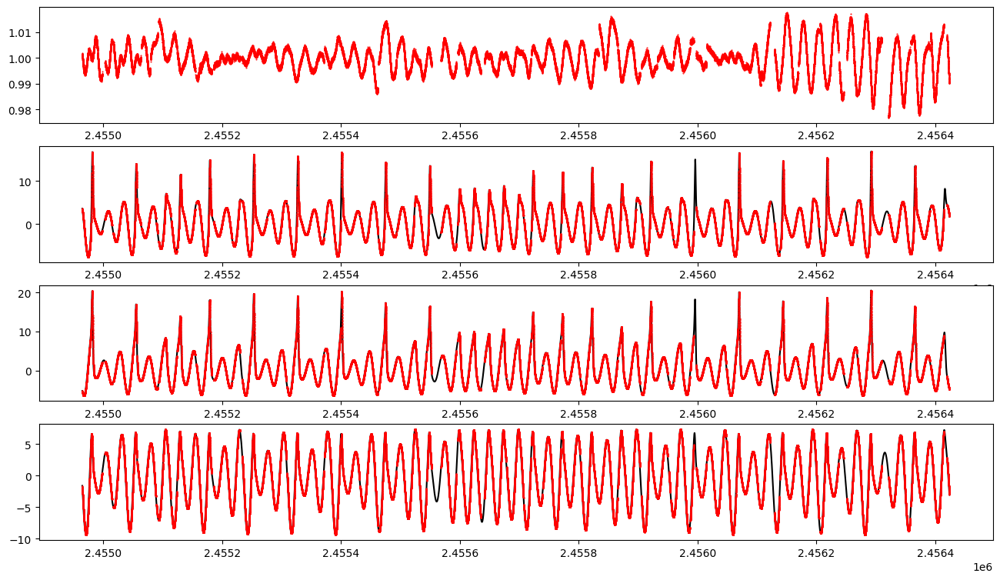

In [24]:
new_Nsteps = int(((kepler[-1,0] - kepler[0,0])*max_qp)/kepler_Prot)
print(new_Nsteps)

transformed_rossler = RK45(fun=sp.transformed_Rossler_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

transformed_rossler_r = np.empty((new_Nsteps,3))
transformed_rossler_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    transformed_rossler.step()
    transformed_rossler_t[i] = transformed_rossler.t
    transformed_rossler_r[i] = transformed_rossler.y
    

fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(transformed_rossler_t, transformed_rossler_r[:,i], 'k-')
plt.show()
print(len(transformed_rossler_t))
print(len(t_kepler_perfect))

new_dt =  (kepler[-1,0] - kepler[0,0])/len(transformed_rossler_t)

#rescale time
transformed_rossler_t_rescaled = kepler[0,0] + np.arange(len(transformed_rossler_t))*new_dt
print(transformed_rossler_t_rescaled[0])
print(transformed_rossler_t_rescaled[-1])

print(kepler[0,0])
print(kepler[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(transformed_rossler_t_rescaled, transformed_rossler_r[:,0], 'k-')
plt.show()

transformed_rossler_x_kepler_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,0], yerr_orig=np.ones_like(transformed_rossler_r[:,0]), t_new=t_kepler_perfect)
transformed_rossler_x_kepler_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,0], yerr_orig=np.ones_like(transformed_rossler_r[:,0]), t_new=kepler[:,0])

transformed_rossler_y_kepler_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,1], yerr_orig=np.ones_like(transformed_rossler_r[:,1]), t_new=t_kepler_perfect)
transformed_rossler_y_kepler_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,1], yerr_orig=np.ones_like(transformed_rossler_r[:,1]), t_new=kepler[:,0])

transformed_rossler_z_kepler_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,2], yerr_orig=np.ones_like(transformed_rossler_r[:,2]), t_new=t_kepler_perfect)
transformed_rossler_z_kepler_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,2], yerr_orig=np.ones_like(transformed_rossler_r[:,2]), t_new=kepler[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(kepler[:,0],kepler[:,1],'r.',ms=1)
axes[1].plot(t_kepler_perfect, transformed_rossler_x_kepler_perfect, 'k-')
axes[1].plot(kepler[:,0], transformed_rossler_x_kepler_gaps, 'r.',ms=1)
axes[2].plot(t_kepler_perfect, transformed_rossler_y_kepler_perfect, 'k-')
axes[2].plot(kepler[:,0], transformed_rossler_y_kepler_gaps, 'r.',ms=1)
axes[3].plot(t_kepler_perfect, transformed_rossler_z_kepler_perfect, 'k-')
axes[3].plot(kepler[:,0], transformed_rossler_z_kepler_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(kepler[:,2]) * (np.ptp(transformed_rossler_x_kepler_perfect)/np.ptp(kepler[:,1]))
unc_to_add_y = np.median(kepler[:,2]) * (np.ptp(transformed_rossler_y_kepler_perfect)/np.ptp(kepler[:,1]))
unc_to_add_z = np.median(kepler[:,2]) * (np.ptp(transformed_rossler_z_kepler_perfect)/np.ptp(kepler[:,1]))

In [25]:
np.random.seed(8421)

transformed_rossler_x_kepler_perfect_noise = transformed_rossler_x_kepler_perfect + np.random.normal(0.,unc_to_add_x,len(t_kepler_perfect))
transformed_rossler_y_kepler_perfect_noise = transformed_rossler_y_kepler_perfect + np.random.normal(0.,unc_to_add_y,len(t_kepler_perfect))
transformed_rossler_z_kepler_perfect_noise = transformed_rossler_z_kepler_perfect + np.random.normal(0.,unc_to_add_z,len(t_kepler_perfect))

transformed_rossler_x_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                transformed_rossler_x_kepler_perfect.T,
                                                transformed_rossler_x_kepler_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_kepler_perfect).T)).T
transformed_rossler_y_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                transformed_rossler_y_kepler_perfect.T,
                                                transformed_rossler_y_kepler_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_kepler_perfect).T)).T
transformed_rossler_z_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                transformed_rossler_z_kepler_perfect.T,
                                                transformed_rossler_z_kepler_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_kepler_perfect).T)).T

print(np.shape(transformed_rossler_x_kepler_perfect_tosave))
print(np.shape(transformed_rossler_y_kepler_perfect_tosave))
print(np.shape(transformed_rossler_z_kepler_perfect_tosave))
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_x_kepler_perfect.txt",transformed_rossler_x_kepler_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_y_kepler_perfect.txt",transformed_rossler_y_kepler_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_z_kepler_perfect.txt",transformed_rossler_z_kepler_perfect_tosave,fmt="%f",header=header)

transformed_rossler_x_kepler_gaps_noise = np.zeros_like(transformed_rossler_x_kepler_gaps)
transformed_rossler_y_kepler_gaps_noise = np.zeros_like(transformed_rossler_y_kepler_gaps)
transformed_rossler_z_kepler_gaps_noise = np.zeros_like(transformed_rossler_z_kepler_gaps)

for i in range(len(transformed_rossler_x_kepler_gaps_noise)):
    transformed_rossler_x_kepler_gaps_noise[i] = transformed_rossler_x_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(transformed_rossler_x_kepler_perfect)/np.ptp(kepler[:,1])),1)
    transformed_rossler_y_kepler_gaps_noise[i] = transformed_rossler_y_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(transformed_rossler_y_kepler_perfect)/np.ptp(kepler[:,1])),1)
    transformed_rossler_z_kepler_gaps_noise[i] = transformed_rossler_z_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(transformed_rossler_z_kepler_perfect)/np.ptp(kepler[:,1])),1)

transformed_rossler_x_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             transformed_rossler_x_kepler_gaps.T,
                                             transformed_rossler_x_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(transformed_rossler_x_kepler_perfect)/np.ptp(kepler[:,1])).T)).T
transformed_rossler_y_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             transformed_rossler_y_kepler_gaps.T,
                                             transformed_rossler_y_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(transformed_rossler_y_kepler_perfect)/np.ptp(kepler[:,1])).T)).T
transformed_rossler_z_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             transformed_rossler_z_kepler_gaps.T,
                                             transformed_rossler_z_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(transformed_rossler_z_kepler_perfect)/np.ptp(kepler[:,1])).T)).T

print(np.shape(transformed_rossler_x_kepler_gaps_tosave))
print(np.shape(transformed_rossler_y_kepler_gaps_tosave))
print(np.shape(transformed_rossler_z_kepler_gaps_tosave))
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_x_kepler_gaps.txt",transformed_rossler_x_kepler_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_y_kepler_gaps.txt",transformed_rossler_y_kepler_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_z_kepler_gaps.txt",transformed_rossler_z_kepler_gaps_tosave,fmt="%f",header=header)


(71422, 4)
(71422, 4)
(71422, 4)
(64696, 4)
(64696, 4)
(64696, 4)


## TESS

79944


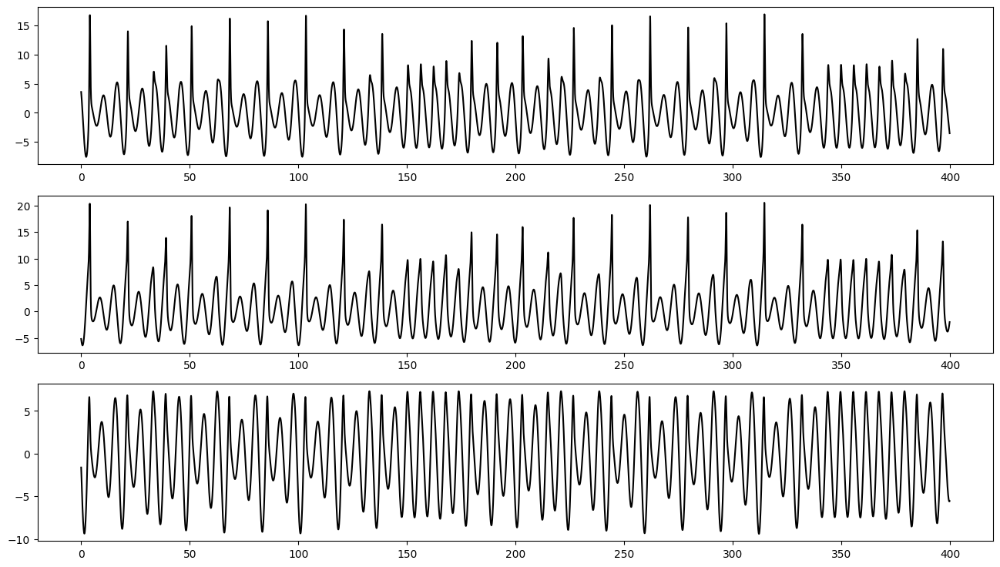

79944
257062
2458325.297928
2458682.3517006454
2458325.297928
2458682.356167


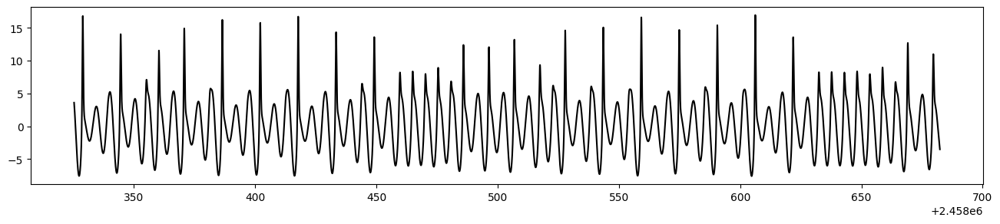

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


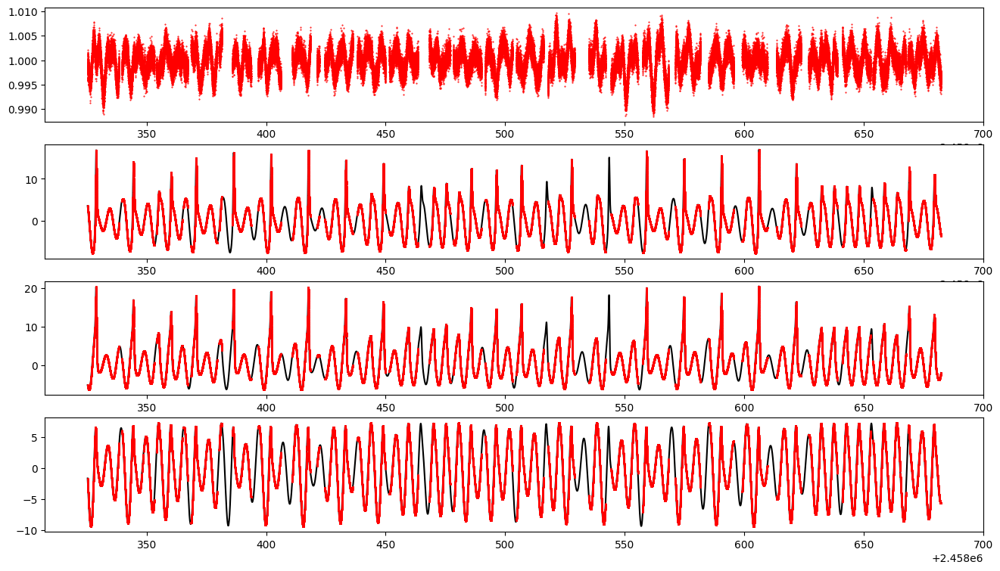

In [26]:
new_Nsteps = int(((tess[-1,0] - tess[0,0])*max_qp)/tess_Prot)
print(new_Nsteps)

transformed_rossler = RK45(fun=sp.transformed_Rossler_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

transformed_rossler_r = np.empty((new_Nsteps,3))
transformed_rossler_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    transformed_rossler.step()
    transformed_rossler_t[i] = transformed_rossler.t
    transformed_rossler_r[i] = transformed_rossler.y
    

fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(transformed_rossler_t, transformed_rossler_r[:,i], 'k-')
plt.show()
print(len(transformed_rossler_t))
print(len(t_tess_perfect))

new_dt =  (tess[-1,0] - tess[0,0])/len(transformed_rossler_t)

#rescale time
transformed_rossler_t_rescaled = tess[0,0] + np.arange(len(transformed_rossler_t))*new_dt
print(transformed_rossler_t_rescaled[0])
print(transformed_rossler_t_rescaled[-1])

print(tess[0,0])
print(tess[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(transformed_rossler_t_rescaled, transformed_rossler_r[:,0], 'k-')
plt.show()

transformed_rossler_x_tess_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,0], yerr_orig=np.ones_like(transformed_rossler_r[:,0]), t_new=t_tess_perfect)
transformed_rossler_x_tess_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,0], yerr_orig=np.ones_like(transformed_rossler_r[:,0]), t_new=tess[:,0])

transformed_rossler_y_tess_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,1], yerr_orig=np.ones_like(transformed_rossler_r[:,1]), t_new=t_tess_perfect)
transformed_rossler_y_tess_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,1], yerr_orig=np.ones_like(transformed_rossler_r[:,1]), t_new=tess[:,0])

transformed_rossler_z_tess_perfect, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,2], yerr_orig=np.ones_like(transformed_rossler_r[:,2]), t_new=t_tess_perfect)
transformed_rossler_z_tess_gaps, blah = resample_time_series(t_orig=transformed_rossler_t_rescaled, y_orig=transformed_rossler_r[:,2], yerr_orig=np.ones_like(transformed_rossler_r[:,2]), t_new=tess[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(tess[:,0],tess[:,1],'r.',ms=1)
axes[1].plot(t_tess_perfect, transformed_rossler_x_tess_perfect, 'k-')
axes[1].plot(tess[:,0], transformed_rossler_x_tess_gaps, 'r.',ms=1)
axes[2].plot(t_tess_perfect, transformed_rossler_y_tess_perfect, 'k-')
axes[2].plot(tess[:,0], transformed_rossler_y_tess_gaps, 'r.',ms=1)
axes[3].plot(t_tess_perfect, transformed_rossler_z_tess_perfect, 'k-')
axes[3].plot(tess[:,0], transformed_rossler_z_tess_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(tess[:,2]) * (np.ptp(transformed_rossler_x_tess_perfect)/np.ptp(tess[:,1]))
unc_to_add_y = np.median(tess[:,2]) * (np.ptp(transformed_rossler_y_tess_perfect)/np.ptp(tess[:,1]))
unc_to_add_z = np.median(tess[:,2]) * (np.ptp(transformed_rossler_z_tess_perfect)/np.ptp(tess[:,1]))

In [27]:
np.random.seed(8421)

transformed_rossler_x_tess_perfect_noise = transformed_rossler_x_tess_perfect + np.random.normal(0.,unc_to_add_x,len(t_tess_perfect))
transformed_rossler_y_tess_perfect_noise = transformed_rossler_y_tess_perfect + np.random.normal(0.,unc_to_add_y,len(t_tess_perfect))
transformed_rossler_z_tess_perfect_noise = transformed_rossler_z_tess_perfect + np.random.normal(0.,unc_to_add_z,len(t_tess_perfect))

transformed_rossler_x_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                transformed_rossler_x_tess_perfect.T,
                                                transformed_rossler_x_tess_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_tess_perfect).T)).T
transformed_rossler_y_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                transformed_rossler_y_tess_perfect.T,
                                                transformed_rossler_y_tess_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_tess_perfect).T)).T
transformed_rossler_z_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                transformed_rossler_z_tess_perfect.T,
                                                transformed_rossler_z_tess_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_tess_perfect).T)).T

print(np.shape(transformed_rossler_x_tess_perfect_tosave))
print(np.shape(transformed_rossler_y_tess_perfect_tosave))
print(np.shape(transformed_rossler_z_tess_perfect_tosave))
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_x_tess_perfect.txt",transformed_rossler_x_tess_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_y_tess_perfect.txt",transformed_rossler_y_tess_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_z_tess_perfect.txt",transformed_rossler_z_tess_perfect_tosave,fmt="%f",header=header)

transformed_rossler_x_tess_gaps_noise = np.zeros_like(transformed_rossler_x_tess_gaps)
transformed_rossler_y_tess_gaps_noise = np.zeros_like(transformed_rossler_y_tess_gaps)
transformed_rossler_z_tess_gaps_noise = np.zeros_like(transformed_rossler_z_tess_gaps)

for i in range(len(transformed_rossler_x_tess_gaps_noise)):
    transformed_rossler_x_tess_gaps_noise[i] = transformed_rossler_x_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(transformed_rossler_x_tess_perfect)/np.ptp(tess[:,1])),1)
    transformed_rossler_y_tess_gaps_noise[i] = transformed_rossler_y_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(transformed_rossler_y_tess_perfect)/np.ptp(tess[:,1])),1)
    transformed_rossler_z_tess_gaps_noise[i] = transformed_rossler_z_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(transformed_rossler_z_tess_perfect)/np.ptp(tess[:,1])),1)

transformed_rossler_x_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             transformed_rossler_x_tess_gaps.T,
                                             transformed_rossler_x_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(transformed_rossler_x_tess_perfect)/np.ptp(tess[:,1])).T)).T
transformed_rossler_y_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             transformed_rossler_y_tess_gaps.T,
                                             transformed_rossler_y_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(transformed_rossler_y_tess_perfect)/np.ptp(tess[:,1])).T)).T
transformed_rossler_z_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             transformed_rossler_z_tess_gaps.T,
                                             transformed_rossler_z_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(transformed_rossler_z_tess_perfect)/np.ptp(tess[:,1])).T)).T

print(np.shape(transformed_rossler_x_tess_gaps_tosave))
print(np.shape(transformed_rossler_y_tess_gaps_tosave))
print(np.shape(transformed_rossler_z_tess_gaps_tosave))
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_x_tess_gaps.txt",transformed_rossler_x_tess_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_y_tess_gaps.txt",transformed_rossler_y_tess_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/5_transformed_rossler/5_transformed_rossler_z_tess_gaps.txt",transformed_rossler_z_tess_gaps_tosave,fmt="%f",header=header)


(257062, 4)
(257062, 4)
(257062, 4)
(205310, 4)
(205310, 4)
(205310, 4)


# 6. Lorenz x,y,z

In [28]:
#r0 = np.array((1., 1., 1.))
# the above IC isn't yet on the attractor, has a brief transient; the below is chosen as the 5000th iteration of the above
# and seems to be safely on the attractor
r0 = np.array((-13.29390985, -16.32060497,  29.90864944))

#fixed point experiments
# because rho > 1, expect 2 fixed points (at the center of the lobes)
# points are both stable if rho < sigma * ((sigma + beta + 3)/(sigma - beta - 1))
# given the choice of parameters above, the RHS of that inequality is ~= 24.7
# so we expect the two FPs to be *unstable*.
fp1_x = 8.48528137
fp1_y = 8.48528137
fp1_z = 27.

fp2_x = -fp1_x
fp2_y = -fp1_y
fp2_z = fp1_z

#r0 = np.array((fp1_x, fp1_y, fp1_z))
#r0 = np.array((fp2_x, fp2_y, fp2_z))

dt = 0.005
tmin = -100.
tmax = 100.
baseline = tmax - tmin
Nsteps = int(baseline/dt)

lorenz = RK45(fun=sp.Lorenz_vel,t0=tmin,y0=r0,max_step=dt,t_bound=10000.)

lorenz_r = np.empty((Nsteps,3))
lorenz_t = np.empty((Nsteps))
for i in range(Nsteps):
    lorenz.step()
    lorenz_t[i] = lorenz.t
    lorenz_r[i] = lorenz.y

qp_x = sp.estimateQuasiPeriod(np.atleast_2d(lorenz_t).T, lorenz_r[:,0],method="localMaxSep")
qp_x_days = qp_x*dt

qp_y = sp.estimateQuasiPeriod(np.atleast_2d(lorenz_t).T, lorenz_r[:,1],method="localMaxSep")
qp_y_days = qp_y*dt

qp_z = sp.estimateQuasiPeriod(np.atleast_2d(lorenz_t).T, lorenz_r[:,2])
qp_z_days = qp_z*dt

print(qp_x_days)
print(qp_y_days)
print(qp_z_days)
print(np.median(lorenz_t[1:]-lorenz_t[:-1]))

max_qp = np.max(np.array((qp_x,qp_y,qp_z)))
print(max_qp)

0.75
0.73
0.74
0.004999999999999005
150


20601


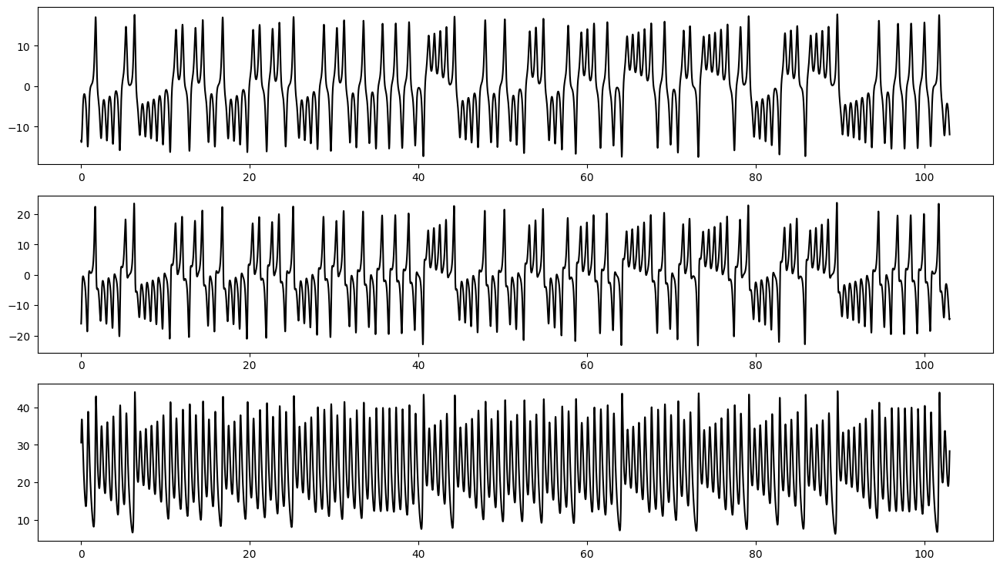

20601
44119
2458216.471464
2458245.676536278
2458216.471464
2458245.677954


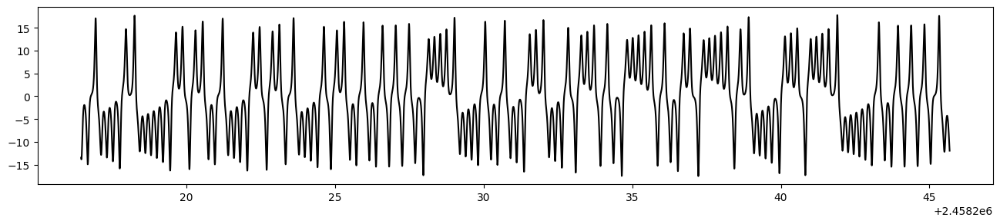

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


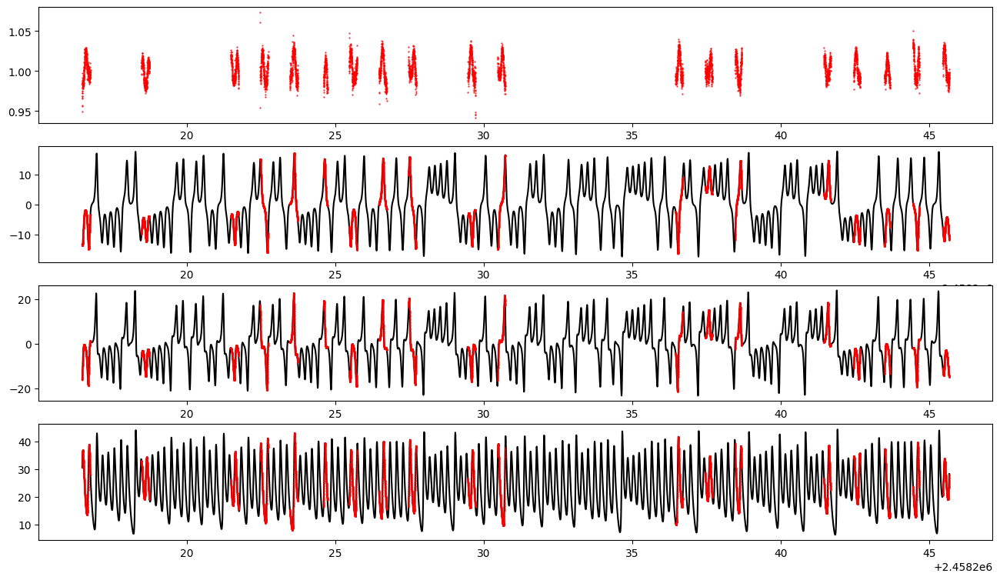

In [29]:
new_Nsteps = int(((speculoos_trunc[-1,0] - speculoos_trunc[0,0])*max_qp)/speculoos_Prot)
print(new_Nsteps)

lorenz = RK45(fun=sp.Lorenz_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

lorenz_r = np.empty((new_Nsteps,3))
lorenz_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    lorenz.step()
    lorenz_t[i] = lorenz.t
    lorenz_r[i] = lorenz.y
    

fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(lorenz_t, lorenz_r[:,i], 'k-')
plt.show()
print(len(lorenz_t))
print(len(t_speculoos_trunc_perfect))

new_dt =  (speculoos_trunc[-1,0] - speculoos_trunc[0,0])/len(lorenz_t)

#rescale time
lorenz_t_rescaled = speculoos_trunc[0,0] + np.arange(len(lorenz_t))*new_dt
print(lorenz_t_rescaled[0])
print(lorenz_t_rescaled[-1])

print(speculoos_trunc[0,0])
print(speculoos_trunc[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(lorenz_t_rescaled, lorenz_r[:,0], 'k-')
plt.show()

lorenz_x_speculoos_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,0], yerr_orig=np.ones_like(lorenz_r[:,0]), t_new=t_speculoos_trunc_perfect)
lorenz_x_speculoos_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,0], yerr_orig=np.ones_like(lorenz_r[:,0]), t_new=speculoos_trunc[:,0])

lorenz_y_speculoos_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,1], yerr_orig=np.ones_like(lorenz_r[:,1]), t_new=t_speculoos_trunc_perfect)
lorenz_y_speculoos_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,1], yerr_orig=np.ones_like(lorenz_r[:,1]), t_new=speculoos_trunc[:,0])

lorenz_z_speculoos_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,2], yerr_orig=np.ones_like(lorenz_r[:,2]), t_new=t_speculoos_trunc_perfect)
lorenz_z_speculoos_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,2], yerr_orig=np.ones_like(lorenz_r[:,2]), t_new=speculoos_trunc[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(speculoos_trunc[:,0],speculoos_trunc[:,1],'r.',ms=1)
axes[1].plot(t_speculoos_trunc_perfect, lorenz_x_speculoos_perfect, 'k-')
axes[1].plot(speculoos_trunc[:,0], lorenz_x_speculoos_gaps, 'r.',ms=1)
axes[2].plot(t_speculoos_trunc_perfect, lorenz_y_speculoos_perfect, 'k-')
axes[2].plot(speculoos_trunc[:,0], lorenz_y_speculoos_gaps, 'r.',ms=1)
axes[3].plot(t_speculoos_trunc_perfect, lorenz_z_speculoos_perfect, 'k-')
axes[3].plot(speculoos_trunc[:,0], lorenz_z_speculoos_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(speculoos_trunc[:,2]) * (np.ptp(lorenz_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))
unc_to_add_y = np.median(speculoos_trunc[:,2]) * (np.ptp(lorenz_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))
unc_to_add_z = np.median(speculoos_trunc[:,2]) * (np.ptp(lorenz_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1]))

In [30]:
np.random.seed(8421)

lorenz_x_speculoos_perfect_noise = lorenz_x_speculoos_perfect + np.random.normal(0.,unc_to_add_x,len(t_speculoos_trunc_perfect))
lorenz_y_speculoos_perfect_noise = lorenz_y_speculoos_perfect + np.random.normal(0.,unc_to_add_y,len(t_speculoos_trunc_perfect))
lorenz_z_speculoos_perfect_noise = lorenz_z_speculoos_perfect + np.random.normal(0.,unc_to_add_z,len(t_speculoos_trunc_perfect))

lorenz_x_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                lorenz_x_speculoos_perfect.T,
                                                lorenz_x_speculoos_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_speculoos_trunc_perfect).T)).T
lorenz_y_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                lorenz_y_speculoos_perfect.T,
                                                lorenz_y_speculoos_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_speculoos_trunc_perfect).T)).T
lorenz_z_speculoos_perfect_tosave = np.vstack((t_speculoos_trunc_perfect.T,
                                                lorenz_z_speculoos_perfect.T,
                                                lorenz_z_speculoos_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_speculoos_trunc_perfect).T)).T

print(np.shape(lorenz_x_speculoos_perfect_tosave))
print(np.shape(lorenz_y_speculoos_perfect_tosave))
print(np.shape(lorenz_z_speculoos_perfect_tosave))
np.savetxt("./data/6_lorenz/6_lorenz_x_speculoos_perfect.txt",lorenz_x_speculoos_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_y_speculoos_perfect.txt",lorenz_y_speculoos_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_z_speculoos_perfect.txt",lorenz_z_speculoos_perfect_tosave,fmt="%f",header=header)

lorenz_x_speculoos_gaps_noise = np.zeros_like(lorenz_x_speculoos_gaps)
lorenz_y_speculoos_gaps_noise = np.zeros_like(lorenz_y_speculoos_gaps)
lorenz_z_speculoos_gaps_noise = np.zeros_like(lorenz_z_speculoos_gaps)

for i in range(len(lorenz_x_speculoos_gaps_noise)):
    lorenz_x_speculoos_gaps_noise[i] = lorenz_x_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(lorenz_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)
    lorenz_y_speculoos_gaps_noise[i] = lorenz_y_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(lorenz_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)
    lorenz_z_speculoos_gaps_noise[i] = lorenz_z_speculoos_gaps[i] + np.random.normal(0.,speculoos_trunc[i,2]*(np.ptp(lorenz_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])),1)

lorenz_x_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             lorenz_x_speculoos_gaps.T,
                                             lorenz_x_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(lorenz_x_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T
lorenz_y_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             lorenz_y_speculoos_gaps.T,
                                             lorenz_y_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(lorenz_y_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T
lorenz_z_speculoos_gaps_tosave = np.vstack((speculoos_trunc[:,0].T,
                                             lorenz_z_speculoos_gaps.T,
                                             lorenz_z_speculoos_gaps_noise.T,
                                             speculoos_trunc[:,2]*(np.ptp(lorenz_z_speculoos_perfect)/np.ptp(speculoos_trunc[:,1])).T)).T

print(np.shape(lorenz_x_speculoos_gaps_tosave))
print(np.shape(lorenz_y_speculoos_gaps_tosave))
print(np.shape(lorenz_z_speculoos_gaps_tosave))
np.savetxt("./data/6_lorenz/6_lorenz_x_speculoos_gaps.txt",lorenz_x_speculoos_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_y_speculoos_gaps.txt",lorenz_y_speculoos_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_z_speculoos_gaps.txt",lorenz_z_speculoos_gaps_tosave,fmt="%f",header=header)


(44119, 4)
(44119, 4)
(44119, 4)
(6758, 4)
(6758, 4)
(6758, 4)


## Kepler

8249


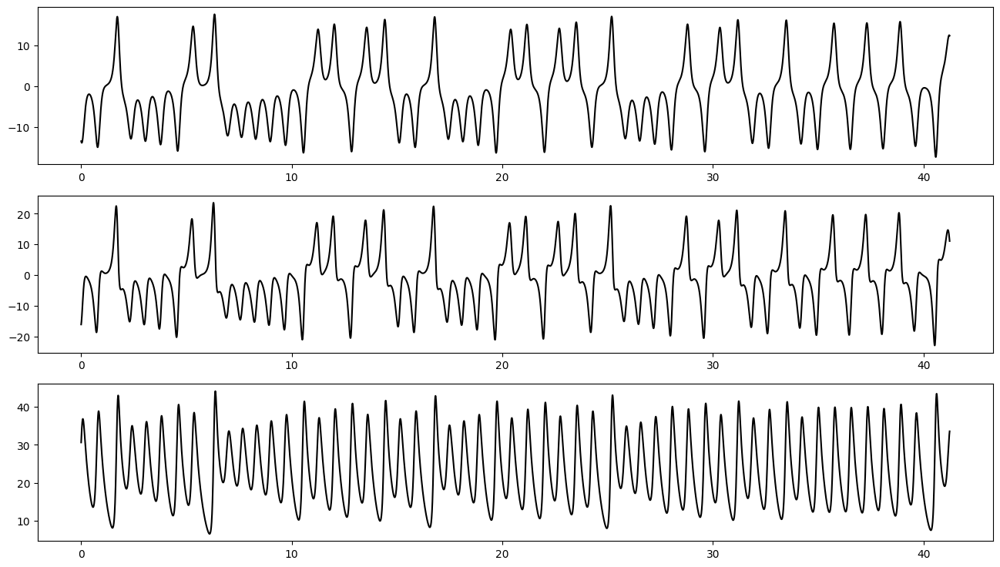

8249
71422
2454964.553195
2456423.8039392317
2454964.553195
2456423.980861


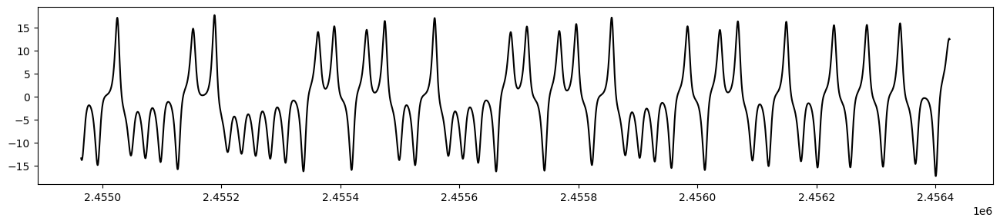

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


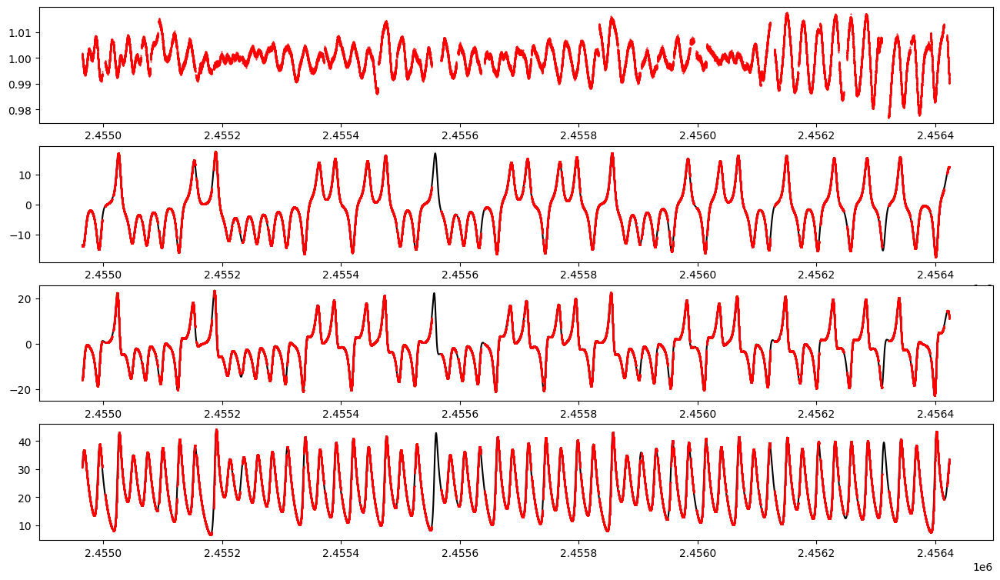

In [31]:
new_Nsteps = int(((kepler[-1,0] - kepler[0,0])*max_qp)/kepler_Prot)
print(new_Nsteps)

lorenz = RK45(fun=sp.Lorenz_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

lorenz_r = np.empty((new_Nsteps,3))
lorenz_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    lorenz.step()
    lorenz_t[i] = lorenz.t
    lorenz_r[i] = lorenz.y
    

fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(lorenz_t, lorenz_r[:,i], 'k-')
plt.show()
print(len(lorenz_t))
print(len(t_kepler_perfect))

new_dt =  (kepler[-1,0] - kepler[0,0])/len(lorenz_t)

#rescale time
lorenz_t_rescaled = kepler[0,0] + np.arange(len(lorenz_t))*new_dt
print(lorenz_t_rescaled[0])
print(lorenz_t_rescaled[-1])

print(kepler[0,0])
print(kepler[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(lorenz_t_rescaled, lorenz_r[:,0], 'k-')
plt.show()

lorenz_x_kepler_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,0], yerr_orig=np.ones_like(lorenz_r[:,0]), t_new=t_kepler_perfect)
lorenz_x_kepler_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,0], yerr_orig=np.ones_like(lorenz_r[:,0]), t_new=kepler[:,0])

lorenz_y_kepler_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,1], yerr_orig=np.ones_like(lorenz_r[:,1]), t_new=t_kepler_perfect)
lorenz_y_kepler_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,1], yerr_orig=np.ones_like(lorenz_r[:,1]), t_new=kepler[:,0])

lorenz_z_kepler_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,2], yerr_orig=np.ones_like(lorenz_r[:,2]), t_new=t_kepler_perfect)
lorenz_z_kepler_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,2], yerr_orig=np.ones_like(lorenz_r[:,2]), t_new=kepler[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(kepler[:,0],kepler[:,1],'r.',ms=1)
axes[1].plot(t_kepler_perfect, lorenz_x_kepler_perfect, 'k-')
axes[1].plot(kepler[:,0], lorenz_x_kepler_gaps, 'r.',ms=1)
axes[2].plot(t_kepler_perfect, lorenz_y_kepler_perfect, 'k-')
axes[2].plot(kepler[:,0], lorenz_y_kepler_gaps, 'r.',ms=1)
axes[3].plot(t_kepler_perfect, lorenz_z_kepler_perfect, 'k-')
axes[3].plot(kepler[:,0], lorenz_z_kepler_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(kepler[:,2]) * (np.ptp(lorenz_x_kepler_perfect)/np.ptp(kepler[:,1]))
unc_to_add_y = np.median(kepler[:,2]) * (np.ptp(lorenz_y_kepler_perfect)/np.ptp(kepler[:,1]))
unc_to_add_z = np.median(kepler[:,2]) * (np.ptp(lorenz_z_kepler_perfect)/np.ptp(kepler[:,1]))

In [32]:
np.random.seed(8421)

lorenz_x_kepler_perfect_noise = lorenz_x_kepler_perfect + np.random.normal(0.,unc_to_add_x,len(t_kepler_perfect))
lorenz_y_kepler_perfect_noise = lorenz_y_kepler_perfect + np.random.normal(0.,unc_to_add_y,len(t_kepler_perfect))
lorenz_z_kepler_perfect_noise = lorenz_z_kepler_perfect + np.random.normal(0.,unc_to_add_z,len(t_kepler_perfect))

lorenz_x_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                lorenz_x_kepler_perfect.T,
                                                lorenz_x_kepler_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_kepler_perfect).T)).T
lorenz_y_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                lorenz_y_kepler_perfect.T,
                                                lorenz_y_kepler_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_kepler_perfect).T)).T
lorenz_z_kepler_perfect_tosave = np.vstack((t_kepler_perfect.T,
                                                lorenz_z_kepler_perfect.T,
                                                lorenz_z_kepler_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_kepler_perfect).T)).T

print(np.shape(lorenz_x_kepler_perfect_tosave))
print(np.shape(lorenz_y_kepler_perfect_tosave))
print(np.shape(lorenz_z_kepler_perfect_tosave))
np.savetxt("./data/6_lorenz/6_lorenz_x_kepler_perfect.txt",lorenz_x_kepler_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_y_kepler_perfect.txt",lorenz_y_kepler_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_z_kepler_perfect.txt",lorenz_z_kepler_perfect_tosave,fmt="%f",header=header)

lorenz_x_kepler_gaps_noise = np.zeros_like(lorenz_x_kepler_gaps)
lorenz_y_kepler_gaps_noise = np.zeros_like(lorenz_y_kepler_gaps)
lorenz_z_kepler_gaps_noise = np.zeros_like(lorenz_z_kepler_gaps)

for i in range(len(lorenz_x_kepler_gaps_noise)):
    lorenz_x_kepler_gaps_noise[i] = lorenz_x_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(lorenz_x_kepler_perfect)/np.ptp(kepler[:,1])),1)
    lorenz_y_kepler_gaps_noise[i] = lorenz_y_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(lorenz_y_kepler_perfect)/np.ptp(kepler[:,1])),1)
    lorenz_z_kepler_gaps_noise[i] = lorenz_z_kepler_gaps[i] + np.random.normal(0.,kepler[i,2]*(np.ptp(lorenz_z_kepler_perfect)/np.ptp(kepler[:,1])),1)

lorenz_x_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             lorenz_x_kepler_gaps.T,
                                             lorenz_x_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(lorenz_x_kepler_perfect)/np.ptp(kepler[:,1])).T)).T
lorenz_y_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             lorenz_y_kepler_gaps.T,
                                             lorenz_y_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(lorenz_y_kepler_perfect)/np.ptp(kepler[:,1])).T)).T
lorenz_z_kepler_gaps_tosave = np.vstack((kepler[:,0].T,
                                             lorenz_z_kepler_gaps.T,
                                             lorenz_z_kepler_gaps_noise.T,
                                             kepler[:,2]*(np.ptp(lorenz_z_kepler_perfect)/np.ptp(kepler[:,1])).T)).T

print(np.shape(lorenz_x_kepler_gaps_tosave))
print(np.shape(lorenz_y_kepler_gaps_tosave))
print(np.shape(lorenz_z_kepler_gaps_tosave))
np.savetxt("./data/6_lorenz/6_lorenz_x_kepler_gaps.txt",lorenz_x_kepler_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_y_kepler_gaps.txt",lorenz_y_kepler_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_z_kepler_gaps.txt",lorenz_z_kepler_gaps_tosave,fmt="%f",header=header)


(71422, 4)
(71422, 4)
(71422, 4)
(64696, 4)
(64696, 4)
(64696, 4)


## TESS

9539


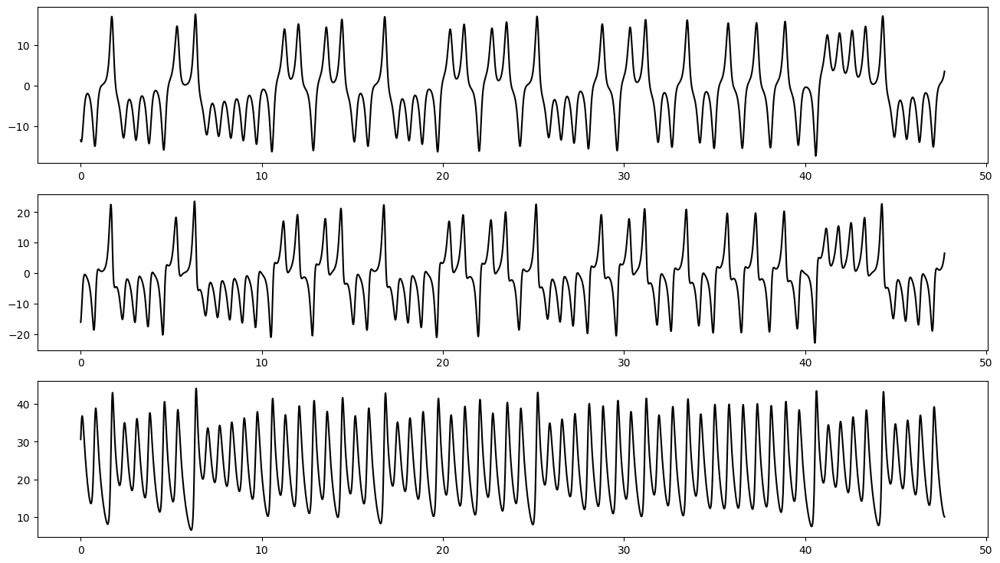

9539
257062
2458325.297928
2458682.318735588
2458325.297928
2458682.356167


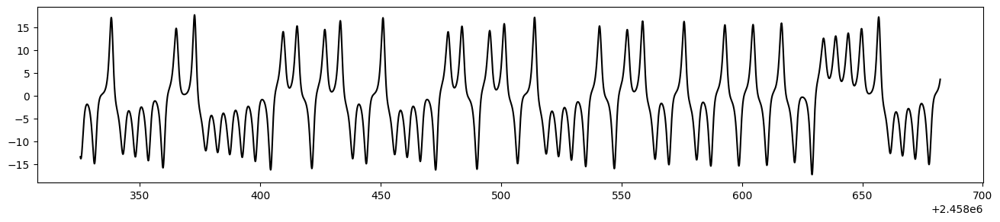

/var/folders/f8/fqd5scnj31n0br62dg8rnm2w0000gn/T/ipykernel_22031/1774334807.py:21: RuntimeWarning: invalid value encountered in scalar divide
  slope = (y_orig[iplus1] - y_orig[iminus1])/(t_orig[iplus1]-t_orig[iminus1])


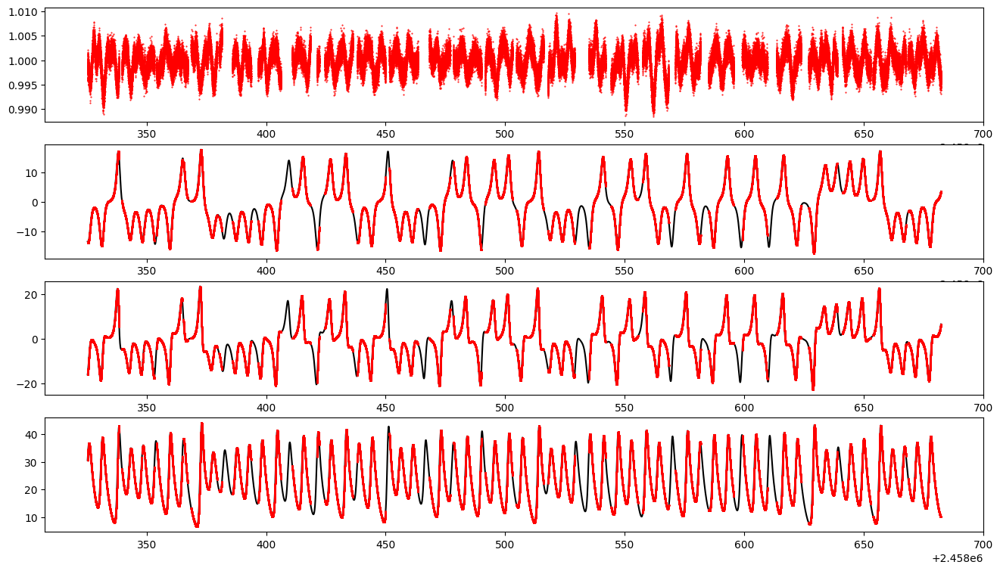

In [33]:
new_Nsteps = int(((tess[-1,0] - tess[0,0])*max_qp)/tess_Prot)
print(new_Nsteps)

lorenz = RK45(fun=sp.Lorenz_vel,t0=0.,y0=r0,max_step=dt,t_bound=10000.)

lorenz_r = np.empty((new_Nsteps,3))
lorenz_t = np.empty((new_Nsteps))
for i in range(new_Nsteps):
    lorenz.step()
    lorenz_t[i] = lorenz.t
    lorenz_r[i] = lorenz.y
    

fig, axes = plt.subplots(3,1,figsize=(16,9))
for i in range(3):
    axes[i].plot(lorenz_t, lorenz_r[:,i], 'k-')
plt.show()
print(len(lorenz_t))
print(len(t_tess_perfect))

new_dt =  (tess[-1,0] - tess[0,0])/len(lorenz_t)

#rescale time
lorenz_t_rescaled = tess[0,0] + np.arange(len(lorenz_t))*new_dt
print(lorenz_t_rescaled[0])
print(lorenz_t_rescaled[-1])

print(tess[0,0])
print(tess[-1,0])

fig, ax = plt.subplots(1,1,figsize=(16,3))
ax.plot(lorenz_t_rescaled, lorenz_r[:,0], 'k-')
plt.show()

lorenz_x_tess_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,0], yerr_orig=np.ones_like(lorenz_r[:,0]), t_new=t_tess_perfect)
lorenz_x_tess_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,0], yerr_orig=np.ones_like(lorenz_r[:,0]), t_new=tess[:,0])

lorenz_y_tess_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,1], yerr_orig=np.ones_like(lorenz_r[:,1]), t_new=t_tess_perfect)
lorenz_y_tess_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,1], yerr_orig=np.ones_like(lorenz_r[:,1]), t_new=tess[:,0])

lorenz_z_tess_perfect, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,2], yerr_orig=np.ones_like(lorenz_r[:,2]), t_new=t_tess_perfect)
lorenz_z_tess_gaps, blah = resample_time_series(t_orig=lorenz_t_rescaled, y_orig=lorenz_r[:,2], yerr_orig=np.ones_like(lorenz_r[:,2]), t_new=tess[:,0])

fig, axes = plt.subplots(4,1,figsize=(16,9))
axes[0].plot(tess[:,0],tess[:,1],'r.',ms=1)
axes[1].plot(t_tess_perfect, lorenz_x_tess_perfect, 'k-')
axes[1].plot(tess[:,0], lorenz_x_tess_gaps, 'r.',ms=1)
axes[2].plot(t_tess_perfect, lorenz_y_tess_perfect, 'k-')
axes[2].plot(tess[:,0], lorenz_y_tess_gaps, 'r.',ms=1)
axes[3].plot(t_tess_perfect, lorenz_z_tess_perfect, 'k-')
axes[3].plot(tess[:,0], lorenz_z_tess_gaps, 'r.',ms=1)
plt.show()

unc_to_add_x = np.median(tess[:,2]) * (np.ptp(lorenz_x_tess_perfect)/np.ptp(tess[:,1]))
unc_to_add_y = np.median(tess[:,2]) * (np.ptp(lorenz_y_tess_perfect)/np.ptp(tess[:,1]))
unc_to_add_z = np.median(tess[:,2]) * (np.ptp(lorenz_z_tess_perfect)/np.ptp(tess[:,1]))

In [34]:
np.random.seed(8421)

lorenz_x_tess_perfect_noise = lorenz_x_tess_perfect + np.random.normal(0.,unc_to_add_x,len(t_tess_perfect))
lorenz_y_tess_perfect_noise = lorenz_y_tess_perfect + np.random.normal(0.,unc_to_add_y,len(t_tess_perfect))
lorenz_z_tess_perfect_noise = lorenz_z_tess_perfect + np.random.normal(0.,unc_to_add_z,len(t_tess_perfect))

lorenz_x_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                lorenz_x_tess_perfect.T,
                                                lorenz_x_tess_perfect_noise.T,
                                                unc_to_add_x*np.ones_like(t_tess_perfect).T)).T
lorenz_y_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                lorenz_y_tess_perfect.T,
                                                lorenz_y_tess_perfect_noise.T,
                                                unc_to_add_y*np.ones_like(t_tess_perfect).T)).T
lorenz_z_tess_perfect_tosave = np.vstack((t_tess_perfect.T,
                                                lorenz_z_tess_perfect.T,
                                                lorenz_z_tess_perfect_noise.T,
                                                unc_to_add_z*np.ones_like(t_tess_perfect).T)).T

print(np.shape(lorenz_x_tess_perfect_tosave))
print(np.shape(lorenz_y_tess_perfect_tosave))
print(np.shape(lorenz_z_tess_perfect_tosave))
np.savetxt("./data/6_lorenz/6_lorenz_x_tess_perfect.txt",lorenz_x_tess_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_y_tess_perfect.txt",lorenz_y_tess_perfect_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_z_tess_perfect.txt",lorenz_z_tess_perfect_tosave,fmt="%f",header=header)

lorenz_x_tess_gaps_noise = np.zeros_like(lorenz_x_tess_gaps)
lorenz_y_tess_gaps_noise = np.zeros_like(lorenz_y_tess_gaps)
lorenz_z_tess_gaps_noise = np.zeros_like(lorenz_z_tess_gaps)

for i in range(len(lorenz_x_tess_gaps_noise)):
    lorenz_x_tess_gaps_noise[i] = lorenz_x_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(lorenz_x_tess_perfect)/np.ptp(tess[:,1])),1)
    lorenz_y_tess_gaps_noise[i] = lorenz_y_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(lorenz_y_tess_perfect)/np.ptp(tess[:,1])),1)
    lorenz_z_tess_gaps_noise[i] = lorenz_z_tess_gaps[i] + np.random.normal(0.,tess[i,2]*(np.ptp(lorenz_z_tess_perfect)/np.ptp(tess[:,1])),1)

lorenz_x_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             lorenz_x_tess_gaps.T,
                                             lorenz_x_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(lorenz_x_tess_perfect)/np.ptp(tess[:,1])).T)).T
lorenz_y_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             lorenz_y_tess_gaps.T,
                                             lorenz_y_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(lorenz_y_tess_perfect)/np.ptp(tess[:,1])).T)).T
lorenz_z_tess_gaps_tosave = np.vstack((tess[:,0].T,
                                             lorenz_z_tess_gaps.T,
                                             lorenz_z_tess_gaps_noise.T,
                                             tess[:,2]*(np.ptp(lorenz_z_tess_perfect)/np.ptp(tess[:,1])).T)).T

print(np.shape(lorenz_x_tess_gaps_tosave))
print(np.shape(lorenz_y_tess_gaps_tosave))
print(np.shape(lorenz_z_tess_gaps_tosave))
np.savetxt("./data/6_lorenz/6_lorenz_x_tess_gaps.txt",lorenz_x_tess_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_y_tess_gaps.txt",lorenz_y_tess_gaps_tosave,fmt="%f",header=header)
np.savetxt("./data/6_lorenz/6_lorenz_z_tess_gaps.txt",lorenz_z_tess_gaps_tosave,fmt="%f",header=header)


(257062, 4)
(257062, 4)
(257062, 4)
(205310, 4)
(205310, 4)
(205310, 4)
